# Monthly performance: CESM LME

In [1]:
import sys,os
import xarray as xr
import numpy as np
import scipy as spy
import pickle

In [2]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.path as mpath
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point
from collections import OrderedDict 

In [3]:
sys.path.append("/home/disk/p/mkb22/Documents/si_analysis_kb/LIMs/SI_LIMs/")
import LIM_utils_kb as limkb
import LIM_building as limbuild
import LIM_stats_kb as statskb
import run_forecast_model_data as rf

sys.path.append("/home/disk/kalman2/mkb22/pyLMR/")
import LMR_utils

In [8]:
import importlib
importlib.reload(limbuild)
importlib.reload(limkb)
importlib.reload(rf)
importlib.reload(statskb)

<module 'LIM_stats_kb' from '/home/disk/p/mkb22/Documents/si_analysis_kb/LIMs/SI_LIMs/LIM_stats_kb.py'>

In [19]:
plt.rcParams['figure.dpi']=300

In [20]:
def get_title_strings(var,exp_setup,forecast):
    if 'cmip6' in exp_setup['train_dsource']: 
        tcmip='CMIP6'
    elif 'era' in exp_setup['train_dsource']:
        tcmip=''
    elif 'satellite' in exp_setup['train_dsource']: 
        tcmip=''
    elif 'lme' in exp_setup['train_dsource']: 
        tcmip=''
    else: 
        tcmip='CMIP5'

    if 'cmip6' in exp_setup['valid_dsource']: 
        vcmip='CMIP6'
    elif 'era' in exp_setup['valid_dsource']:
        vcmip=''
    elif 'satellite' in exp_setup['valid_dsource']: 
        vcmip=''
    elif 'lme' in exp_setup['valid_dsource']: 
        vcmip=''
    else: 
        vcmip='CMIP5'

    # start_tim = exp_setup['nyears_startvalid']
    # end_tim = exp_setup['nyears_startvalid']+(exp_setup['nyearsvalid']*12)
    valid_yrs_str = (str(forecast['var_dict_valid'][var]['time'][0])[:4]+'_'+
                     str(forecast['var_dict_valid'][var]['time'][-1])[:4])

    if 'hist' in exp_setup['train_dsource']:
        texp = 'Historical'
    elif 'lm' in exp_setup['train_dsource']: 
        texp = 'LM'
    elif 'ssp585' in exp_setup['train_dsource']: 
        texp = 'SSP585'
    elif 'era5' in exp_setup['train_dsource']: 
        texp = 'ERA5'
    elif 'satellite' in exp_setup['train_dsource']: 
        texp = 'Satellite'
    elif 'lme' in exp_setup['train_dsource']: 
        texp = 'LME'

    if 'hist' in exp_setup['valid_dsource']:
        vexp = 'Historical'
    elif 'lm' in exp_setup['valid_dsource']: 
        vexp = 'LM'
    elif 'ssp585' in exp_setup['valid_dsource']: 
        vexp = 'SSP585'
    elif 'era5' in exp_setup['valid_dsource']: 
        vexp = 'ERA5'
    elif 'satellite' in exp_setup['valid_dsource']: 
        vexp = 'Satellite'
    elif 'lme' in exp_setup['valid_dsource']: 
        vexp = 'LME'

    if 'cesm2' in exp_setup['train_dsource']:
        tmod = 'CESM2'
    elif 'mpi' in exp_setup['train_dsource']: 
        tmod = 'MPI'
    elif 'gfdl' in exp_setup['train_dsource']: 
        tmod = 'GFDL'
    elif 'ccsm4' in exp_setup['train_dsource']: 
        tmod = 'CCSM4'
    elif 'era5' in exp_setup['train_dsource']: 
        tmod = ''
    elif 'satellite' in exp_setup['train_dsource']: 
        tmod = ''
    elif 'lme' in exp_setup['train_dsource']: 
        tmod = 'CESM'

    if 'cesm2' in exp_setup['valid_dsource']:
        vmod = 'CESM2'
    elif 'mpi' in exp_setup['valid_dsource']: 
        vmod = 'MPI'
    elif 'gfdl' in exp_setup['valid_dsource']: 
        vmod = 'GFDL'
    elif 'ccsm4' in exp_setup['valid_dsource']: 
        vmod = 'CCSM4'
    elif 'era5' in exp_setup['valid_dsource']: 
        vmod = ''
    elif 'satellite' in exp_setup['valid_dsource']: 
        vmod = ''
    elif 'lme' in exp_setup['valid_dsource']: 
        vmod = 'CESM'

    if exp_setup['Weight'] is True: 
        wt_addin = ' '
    else: 
        wt_addin = '(no area weighting)'

    if exp_setup['detrend'] is True: 
        tr_addin = ' '
    else: 
        tr_addin = ' (trended)'
        
    return tcmip, vcmip, valid_yrs_str, texp, vexp, tmod, vmod, wt_addin, tr_addin

In [21]:
def load_validation_data(var, exp_setup, remove_climo=True, detrend=True, verbose=True):
    ## LOad Truth data: 
    fdic_valid = limkb.build_training_dic(exp_setup['valid_dsource'])
    v = {}
    tecut = int(exp_setup['nyears_startvalid']/12)+(exp_setup['nyearsvalid'])
    #        tecut = exp_setup['nyearstot'] - (int(exp_setup['nyears_startvalid']/12)+(exp_setup['nyearsvalid']))
    if tecut <=0: 
        tecut = False
    print('tecut = '+str(tecut) +', tscut = '+str(exp_setup['nyears_startvalid']/12))

    X_var, _ = limkb.load_data(var, v, fdic_valid, remove_climo=remove_climo, detrend=detrend, 
                               verbose=verbose,tscut=int(exp_setup['nyears_startvalid']/12), 
                               tecut=tecut, lat_cutoff=exp_setup['lat_cutoff'])

    if var is 'sic':
        if np.nanmax(X_var)>1:
            print('Changing units of sic be a between 0 to 1')
            X_var = X_var/100
    
    return X_var

In [22]:
mo_names=['Jan','Feb', 'Mar','Apr','May','June','July','Aug','Sept','Oct','Nov','Dec','All']

In [23]:
ntrunc = 50 # EOF truncation for individual fields (reduced-state space)
ntrunc_sic = 50
#nmodes = 15 # number of coupled EOFs for LIM state space (truncated-state space)
#nmodes = 20
nmodes_sic = 50
#modes_sic = 20

mo='all'
#mo=0
lags = [1,2,3,4,5,6,7,8]

#model = 'satellite'
#model = 'cmip6_mpi_hist'
#model = 'era5'
model = 'cesm_lme'
lag_int = 1

# forecast lead time in months that defines the LIM training
tau = 1

# variables to include in the LIM (note "vars" is a Python command)
limvars = ['tas','psl','zg','tos','sit','sic']
#limvars = ['sic']

data_dir = '/home/disk/kalman2/mkb22/SI_LIMs/sensitivity_testing/ntrain/'

In [24]:
folder = 'last_millennium/'
var_names = (str(ntrunc)+"_").join(limvars)+str(nmodes_sic)
var='sic'

filename_os = ('LIMcast_'+model+'_002_ntrain_850_1650'+
               '_validyrs_1651_1850_'+var_names+'_20211202.pkl')
filename_is = ('LIMcast_'+model+'_002_ntrain_850_1650'+
               '_validyrs_0851_1050_'+var_names+'_20211202.pkl')

print('Loading '+data_dir+folder+filename_is)

experiment_os =  pickle.load(open(data_dir+folder+filename_os, 'rb'))
experiment_is =  pickle.load(open(data_dir+folder+filename_is, 'rb'))

LIMd_is = experiment_is['LIMd']
exp_setup_is = experiment_is['forecast']['exp_setup']
forecast_is = experiment_is['forecast']
forecast_validation_lags_is = experiment_is['forecast_validation_lags']
forecast_validation_mo_is = experiment_is['forecast_validation']
ar1cast_lags_is = experiment_is['ar1cast_lags']
ar1cast_mo_is = experiment_is['ar1cast']['validation_stats_ar1']

LIMd_os = experiment_os['LIMd']
exp_setup_os = experiment_os['forecast']['exp_setup']
forecast_os = experiment_os['forecast']
forecast_validation_lags_os = experiment_os['forecast_validation_lags']
forecast_validation_mo_os = experiment_os['forecast_validation']
ar1cast_lags_os = experiment_os['ar1cast_lags']
ar1cast_mo_os = experiment_os['ar1cast']['validation_stats_ar1']

[tcmip_is, vcmip_is, valid_yrs_str_is, texp_is, 
 vexp_is, tmod_is, vmod_is, wt_addin_is, tr_addin_is] = get_title_strings(var,exp_setup_is,forecast_is)
[tcmip_os, vcmip_os, valid_yrs_str_os, texp_os, 
 vexp_os, tmod_os, vmod_os, wt_addin_os, tr_addin_os] = get_title_strings(var,exp_setup_os,forecast_os)
    

Loading /home/disk/kalman2/mkb22/SI_LIMs/sensitivity_testing/ntrain/last_millennium/LIMcast_cesm_lme_002_ntrain_850_1650_validyrs_0851_1050_tas50_psl50_zg50_tos50_sit50_sic50_20211202.pkl


In [25]:
x_forecast_dcomp_os = np.zeros((len(exp_setup_os['lags']),LIMd_os['E3_all'].shape[0]+LIMd_os['E_sic'].shape[0],
                               forecast_os['x_forecast'].shape[2]))
nmodes_os = LIMd_os['E3_all'].shape[1]

for i,lag in enumerate(exp_setup_os['lags']):
        print('Lag '+ str(lag))
        x_forecast_dcomp_os[lag,:,:] = limkb.decompress_eof_separate_sic(forecast_os['x_forecast'][lag,:,:],
                                                                         nmodes_os,exp_setup_os['nmodes_sic'],
                                                                         LIMd_os['E3_all'],LIMd_os['E_sic'],
                                                                         exp_setup_os['limvars'],LIMd_os['var_dict'],
                                                                         LIMd_os['W_all'],Weights=exp_setup_os['Weight'],
                                                                         sic_separate=exp_setup_os['sic_separate'])
        
forecast_os['x_forecast_dcomp'] = x_forecast_dcomp_os

Lag 0
Lag 1
Lag 2
Lag 3
Lag 4
Lag 5
Lag 6
Lag 7
Lag 8


In [26]:
x_forecast_dcomp_mo = np.reshape(forecast_os['x_forecast_dcomp'], 
                                 (forecast_os['x_forecast_dcomp'].shape[0], 
                                  forecast_os['x_forecast_dcomp'].shape[1],
                                  int(forecast_os['x_forecast_dcomp'].shape[2]/12),12))

Loading from cuments/SeaIceData/LME/LIMs/areacella_CESM_LME_global_001.nc
latitude cutoff detected: 50
Loading from b22/Documents/SeaIceData/LME/LIMs/areacello_global_LME_02.nc
latitude cutoff detected: 50
tecut = 1001, tscut = 801.0
Loading from tas
Loading from a/LME/LIMs/tas_sfc_Amon_CESM_LMEallforc_002_085001-200512.nc
time dimension: 1651 - 1850
detrending...
Working on month...0
Working on month...1
Working on month...2
Working on month...3
Working on month...4
Working on month...5
Working on month...6
Working on month...7
Working on month...8
Working on month...9
Working on month...10
Working on month...11
latitude cutoff detected: 50
-----------------------------------------------------
completed in 22.44125247001648 seconds
-----------------------------------------------------
Month 0
Trained using month 0...
Validating against month 0
Truth_anom shape: (3168, 199)
Forecast_anom shape: (3168, 199)
changing cellarea units from m^2 to km^2


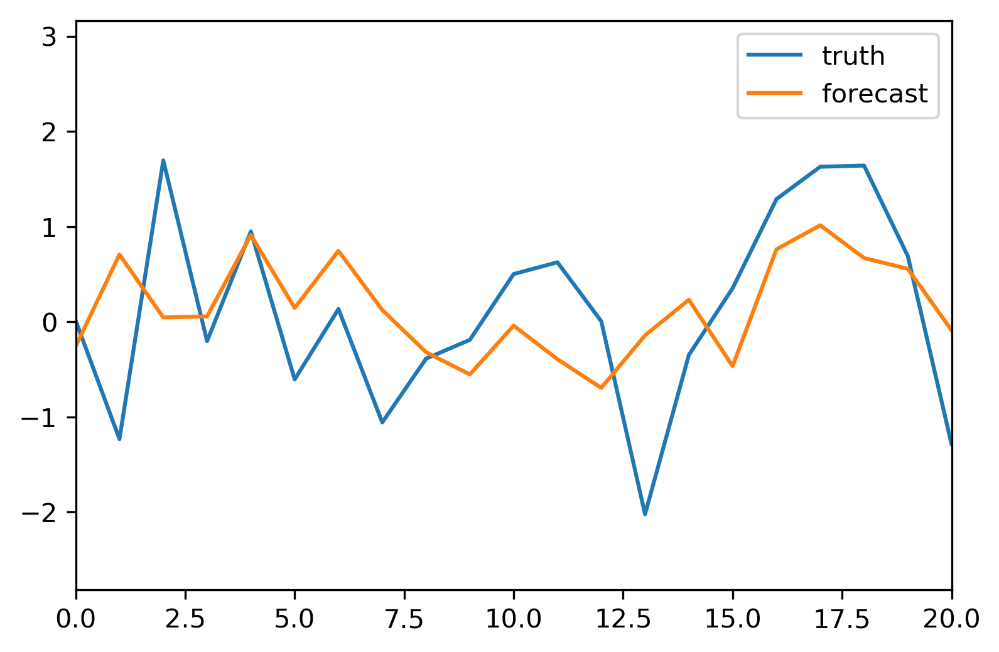

Month 1
Trained using month 1...
Validating against month 1
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


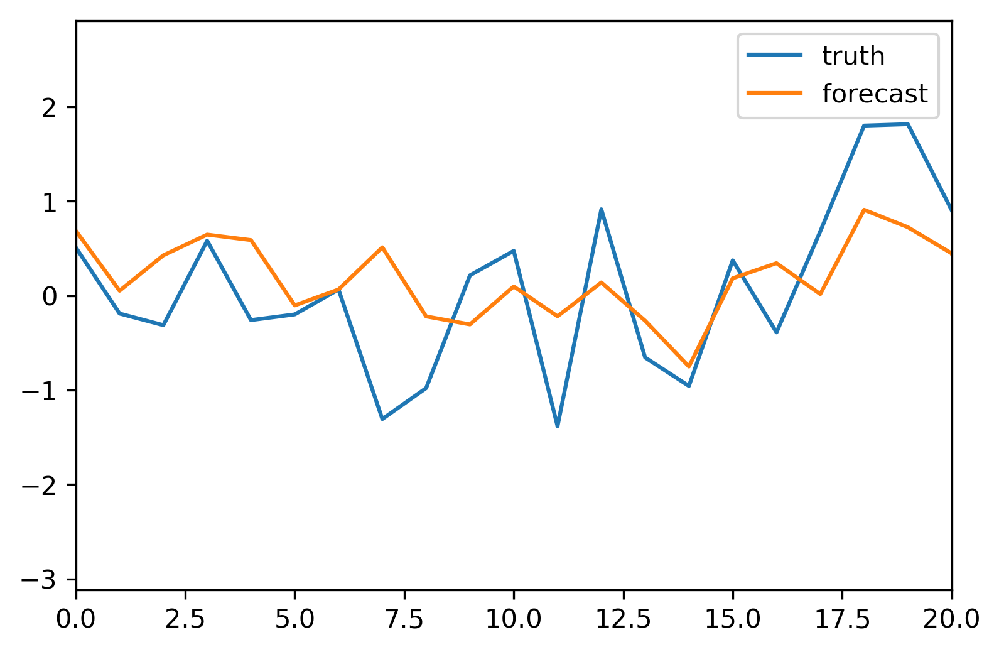

Month 2
Trained using month 2...
Validating against month 2
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


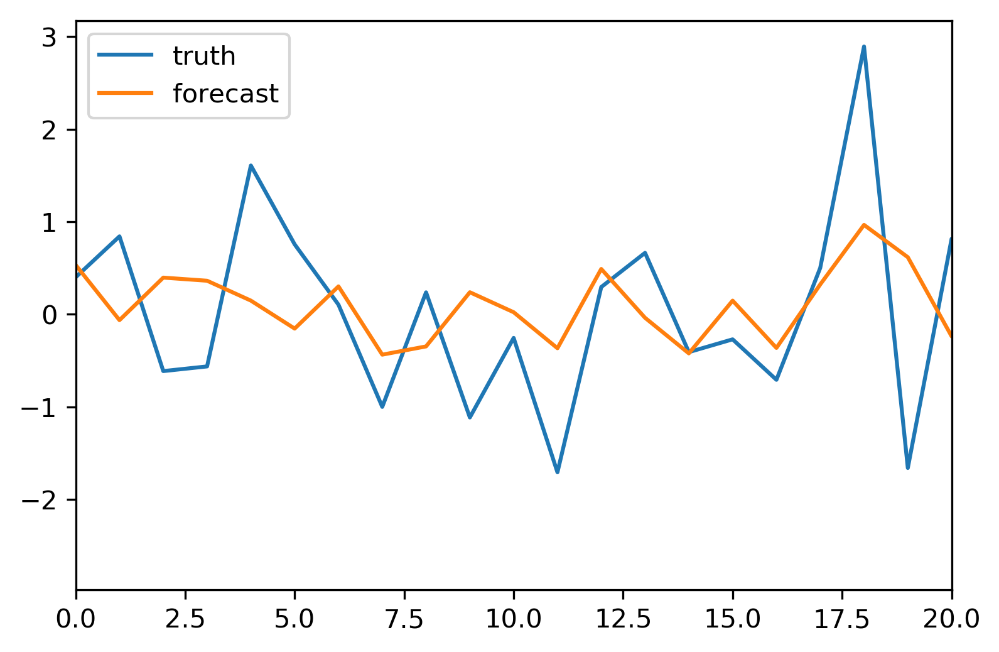

Month 3
Trained using month 3...
Validating against month 3
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


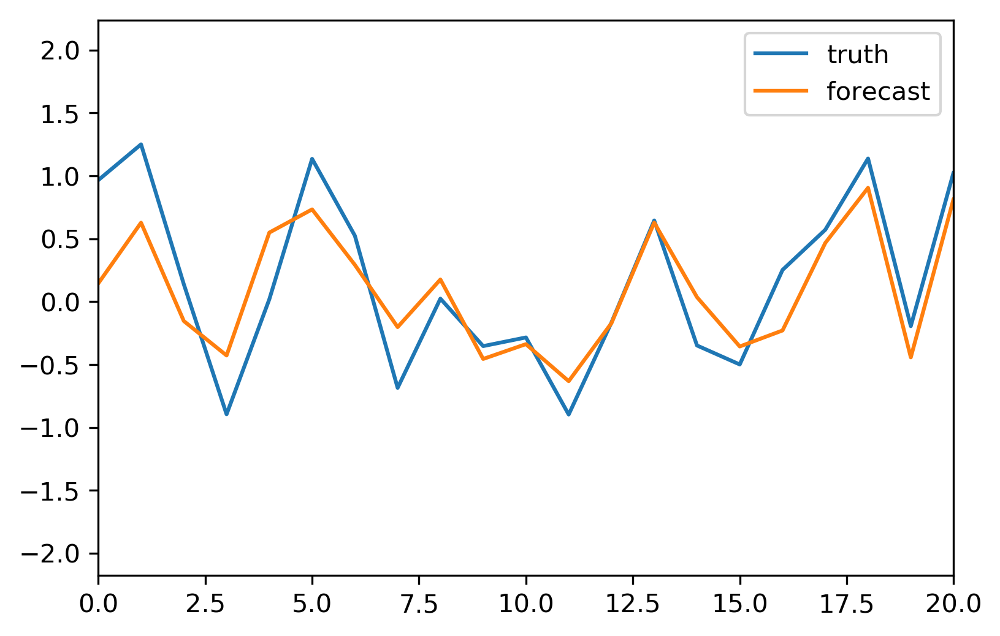

Month 4
Trained using month 4...
Validating against month 4
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


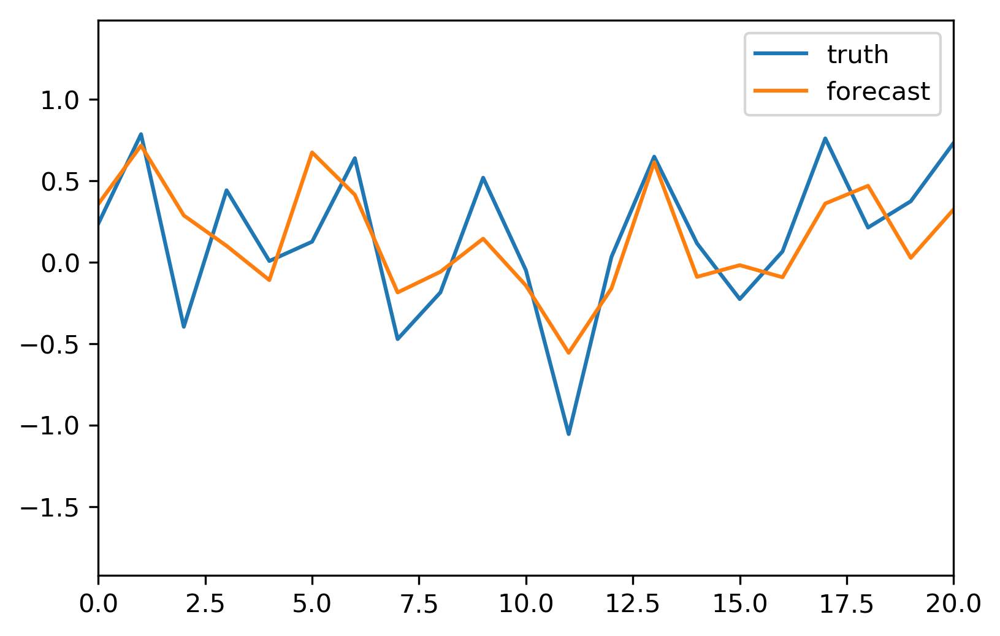

Month 5
Trained using month 5...
Validating against month 5
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


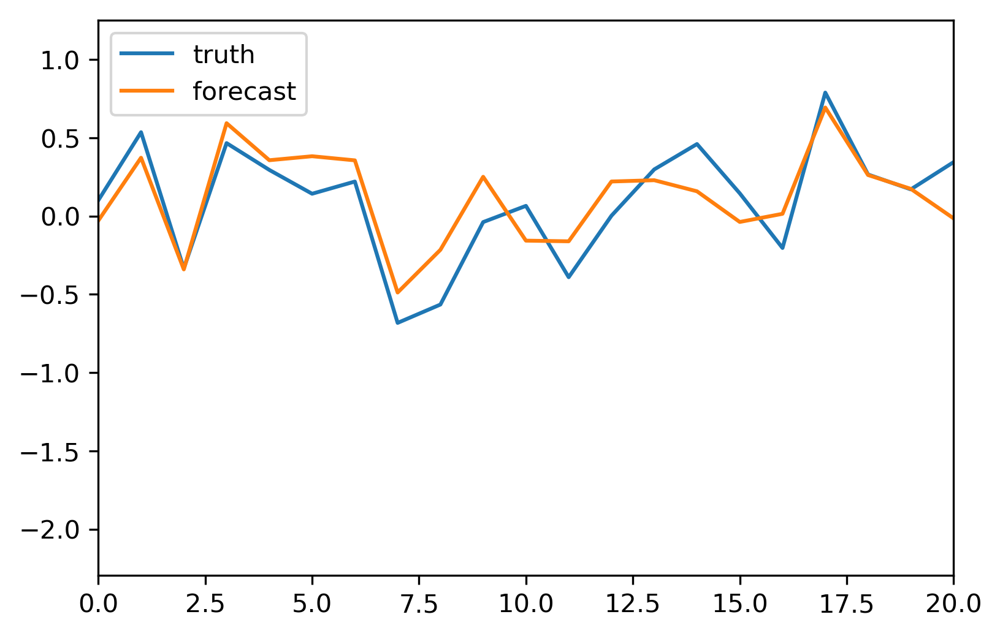

Month 6
Trained using month 6...
Validating against month 6
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


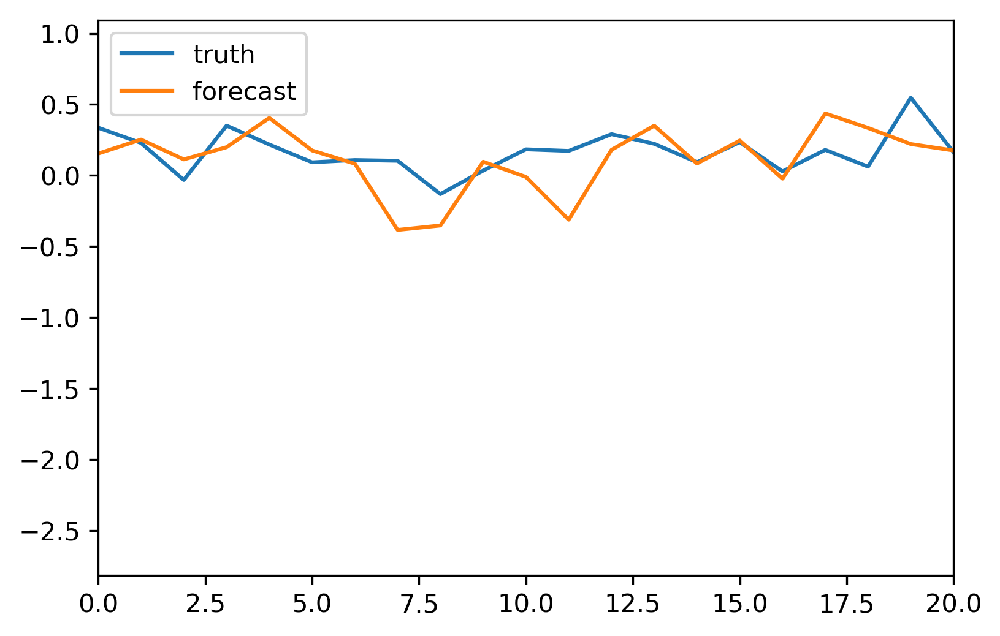

Month 7
Trained using month 7...
Validating against month 7
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


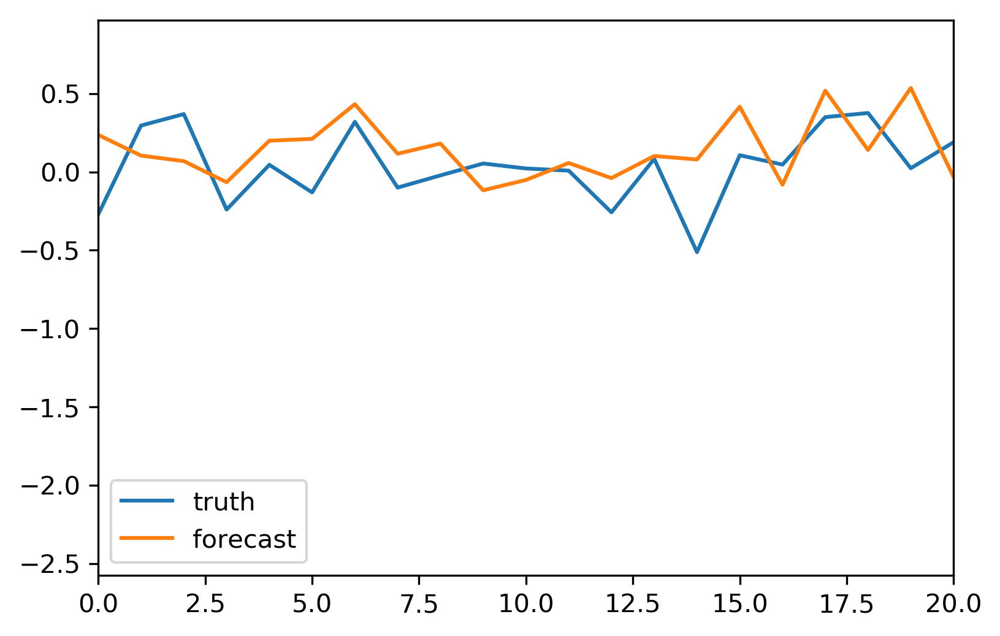

Month 8
Trained using month 8...
Validating against month 8
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


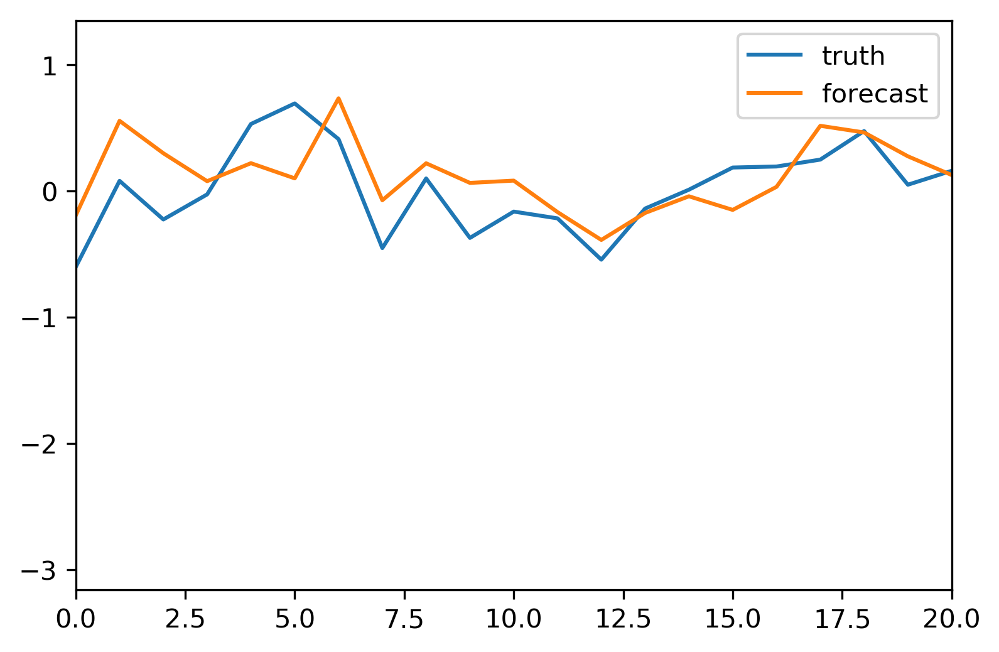

Month 9
Trained using month 9...
Validating against month 9
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


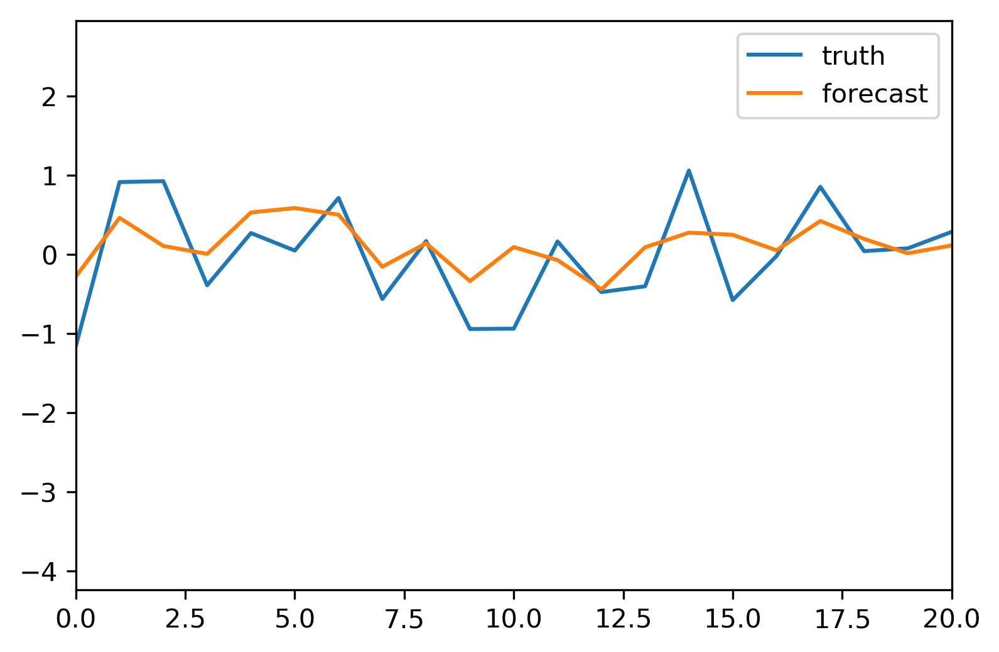

Month 10
Trained using month 10...
Validating against month 10
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


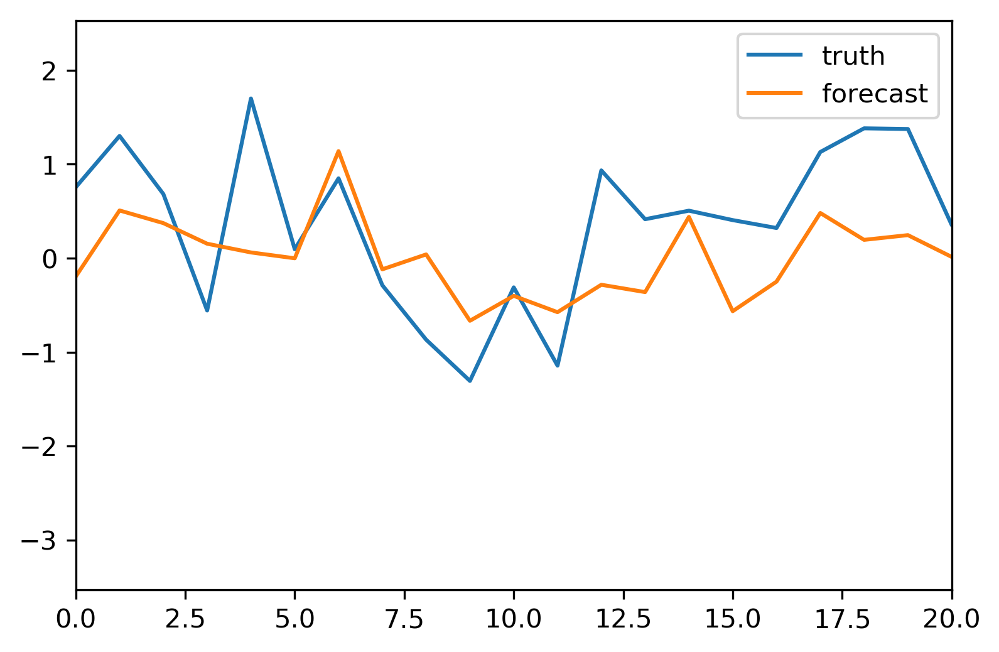

Month 11
Trained using month 11...
Validating against month 11
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


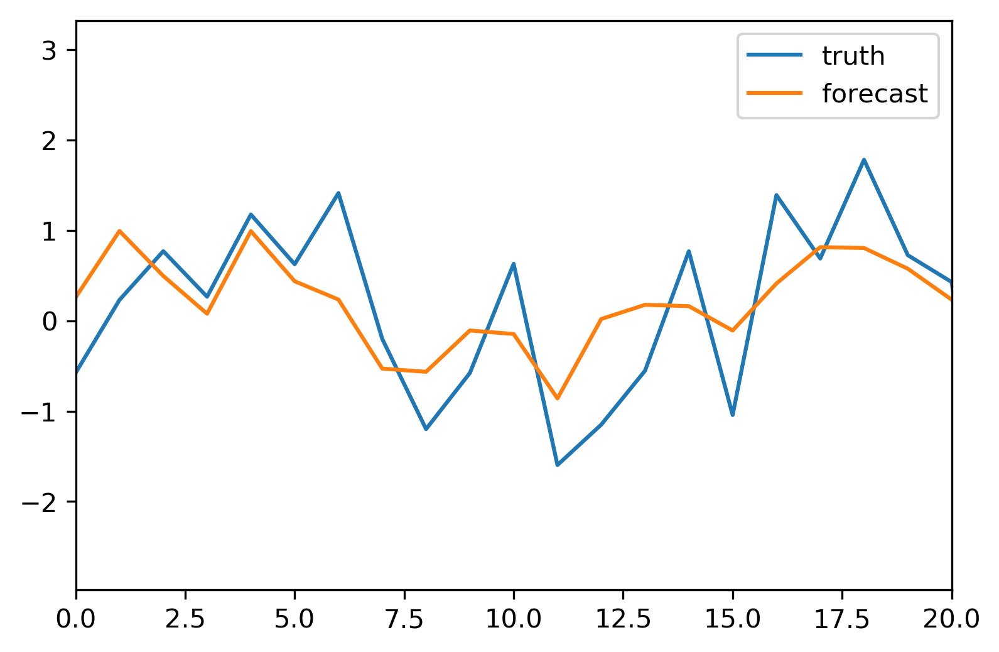

tecut = 1001, tscut = 801.0
Loading from psl
Loading from a/LME/LIMs/psl_sfc_Amon_CESM_LMEallforc_002_085001-200512.nc
time dimension: 1651 - 1850
detrending...
Working on month...0
Working on month...1
Working on month...2
Working on month...3
Working on month...4
Working on month...5
Working on month...6
Working on month...7
Working on month...8
Working on month...9
Working on month...10
Working on month...11
latitude cutoff detected: 50
-----------------------------------------------------
completed in 22.07208275794983 seconds
-----------------------------------------------------
Month 0
Trained using month 0...
Validating against month 0
Truth_anom shape: (3168, 199)
Forecast_anom shape: (3168, 199)
changing cellarea units from m^2 to km^2


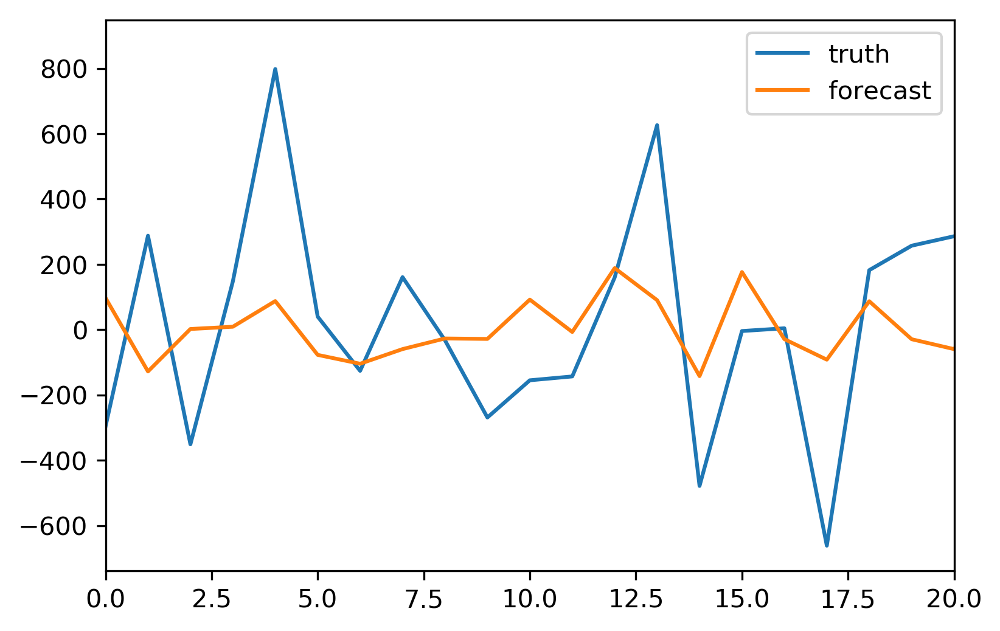

Month 1
Trained using month 1...
Validating against month 1
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


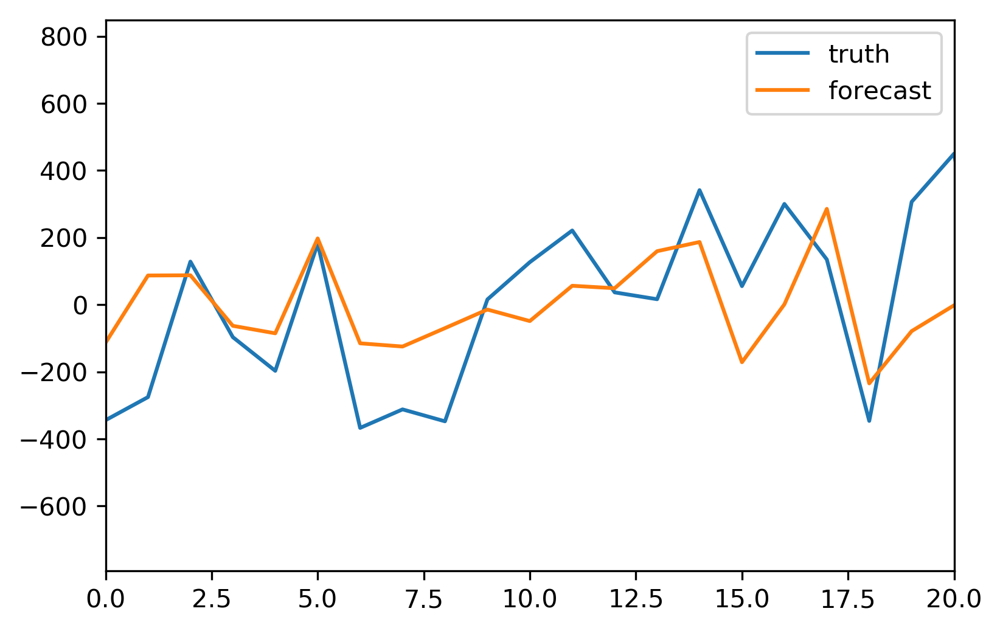

Month 2
Trained using month 2...
Validating against month 2
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


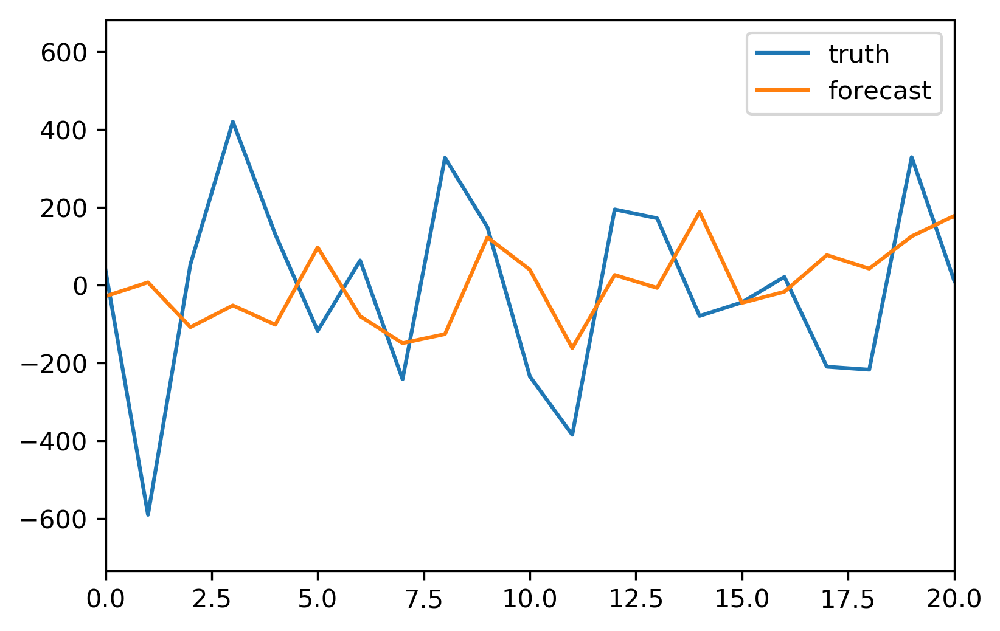

Month 3
Trained using month 3...
Validating against month 3
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


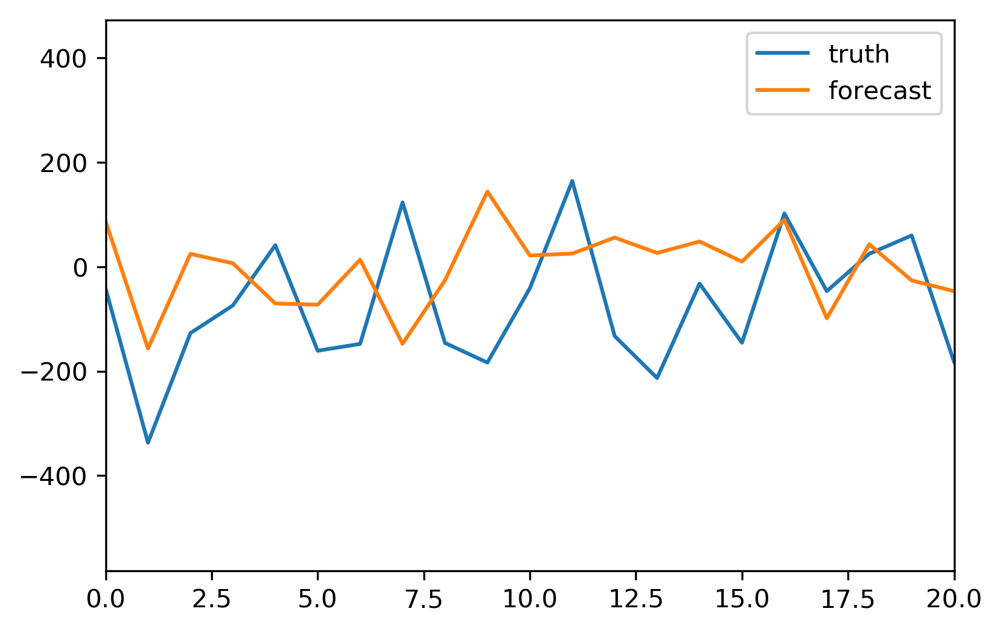

Month 4
Trained using month 4...
Validating against month 4
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


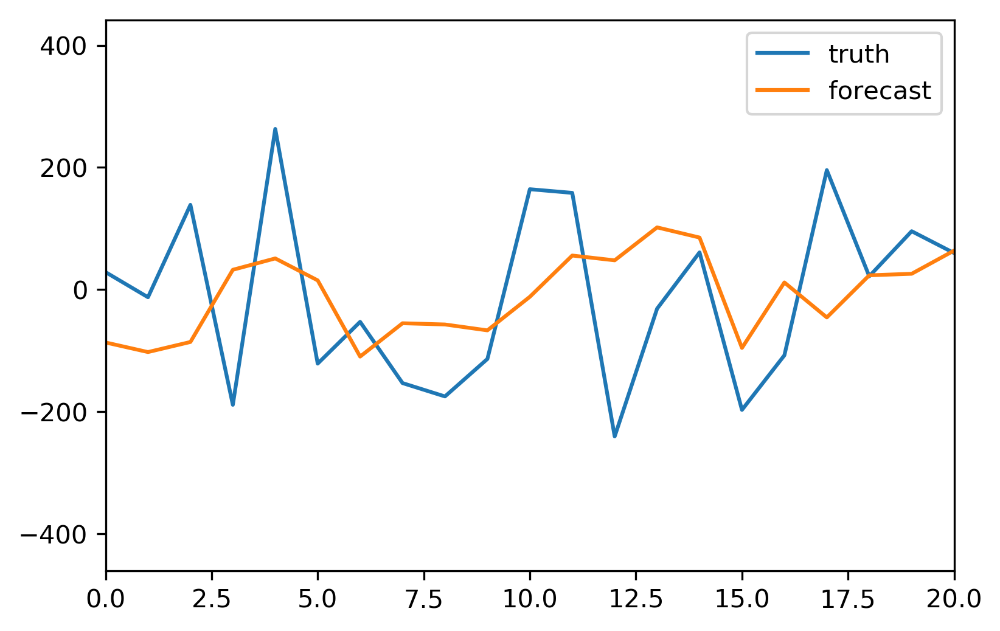

Month 5
Trained using month 5...
Validating against month 5
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


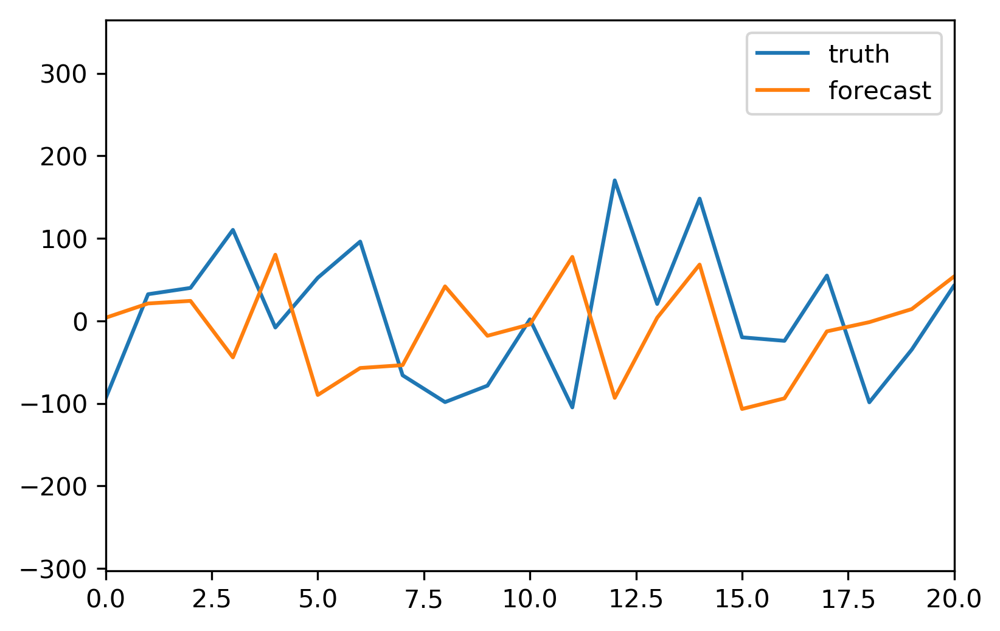

Month 6
Trained using month 6...
Validating against month 6
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


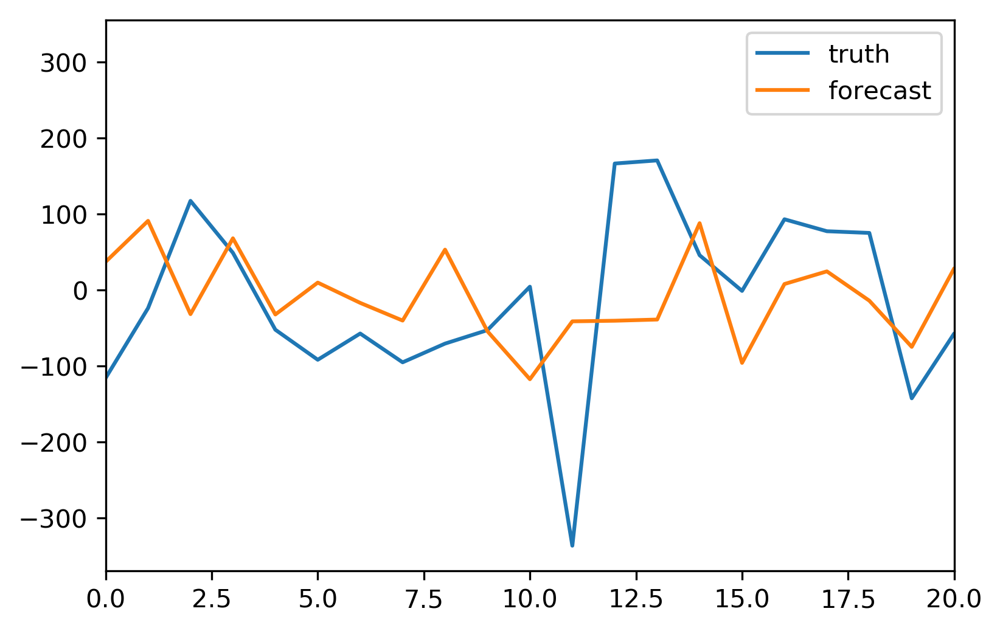

Month 7
Trained using month 7...
Validating against month 7
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


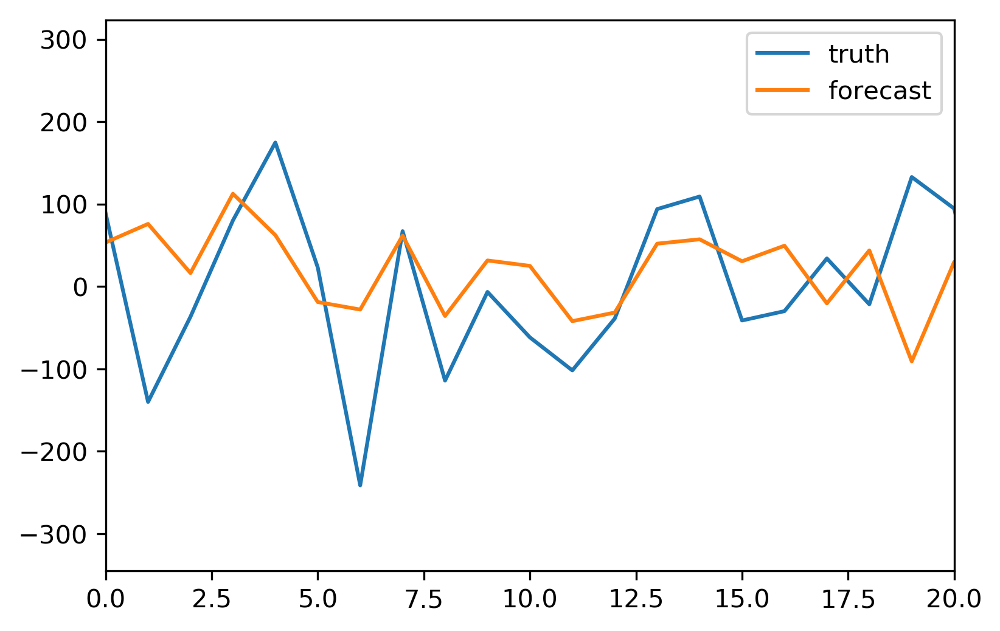

Month 8
Trained using month 8...
Validating against month 8
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


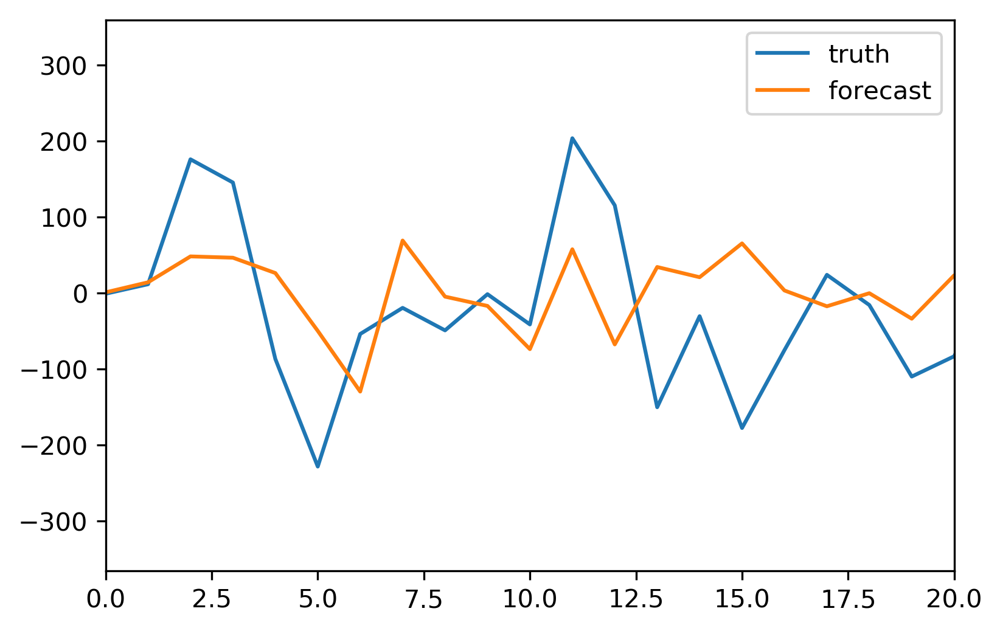

Month 9
Trained using month 9...
Validating against month 9
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


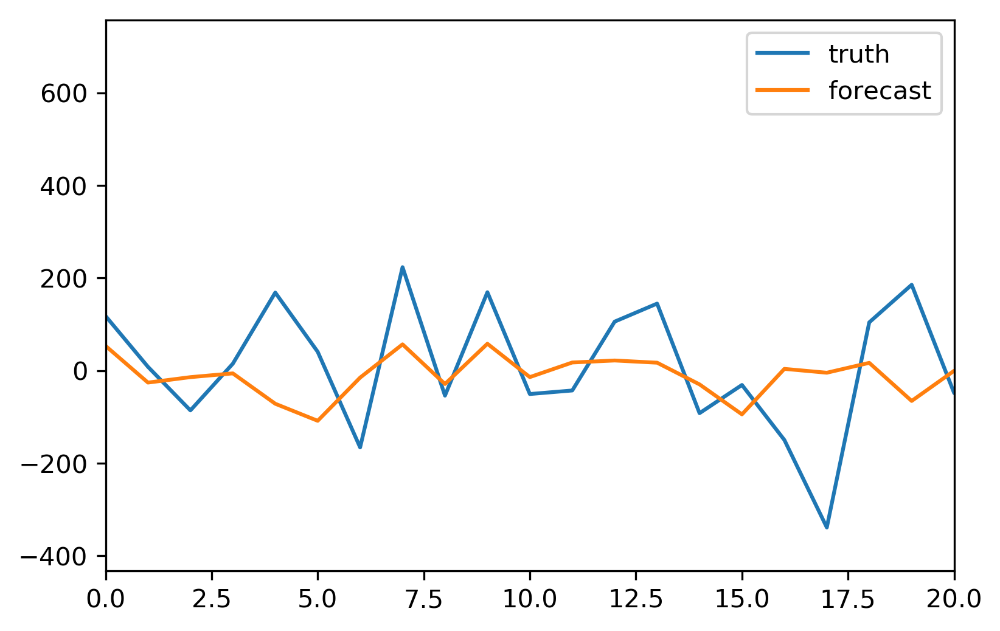

Month 10
Trained using month 10...
Validating against month 10
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


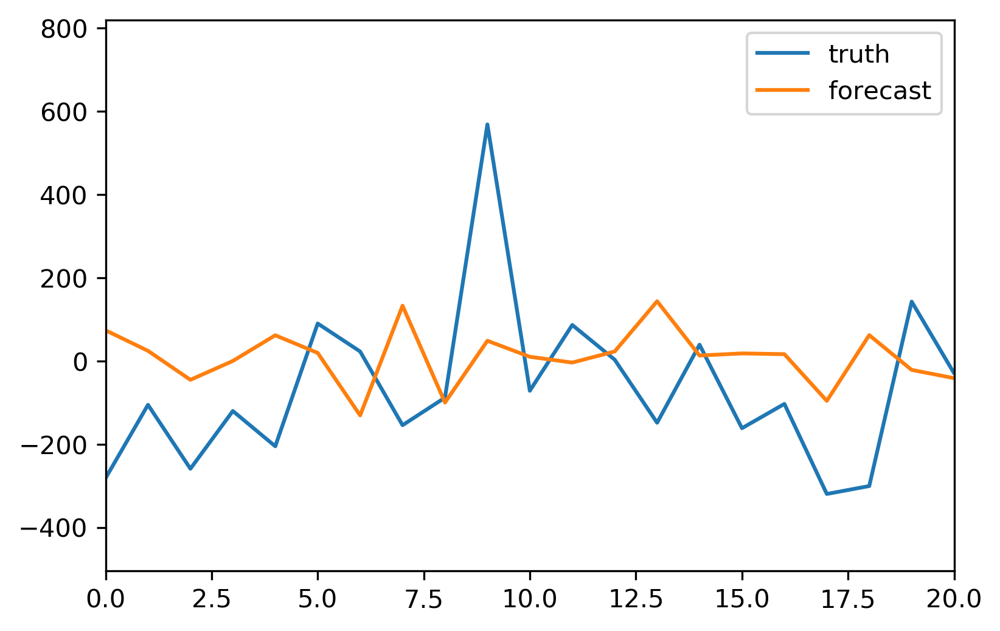

Month 11
Trained using month 11...
Validating against month 11
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


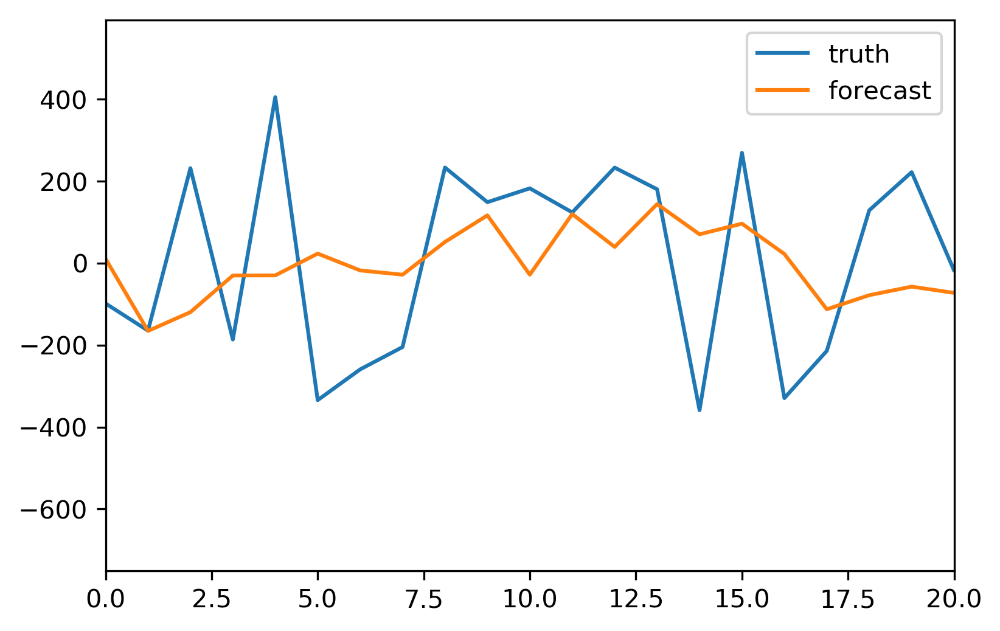

tecut = 1001, tscut = 801.0
Loading from zg
Loading from LME/LIMs/zg_500hPa_Amon_CESM_LMEallforc_002_085001-200512.nc
time dimension: 1651 - 1850
detrending...
Working on month...0
Working on month...1
Working on month...2
Working on month...3
Working on month...4
Working on month...5
Working on month...6
Working on month...7
Working on month...8
Working on month...9
Working on month...10
Working on month...11
latitude cutoff detected: 50
-----------------------------------------------------
completed in 21.51566481590271 seconds
-----------------------------------------------------
Month 0
Trained using month 0...
Validating against month 0
Truth_anom shape: (3168, 199)
Forecast_anom shape: (3168, 199)
changing cellarea units from m^2 to km^2


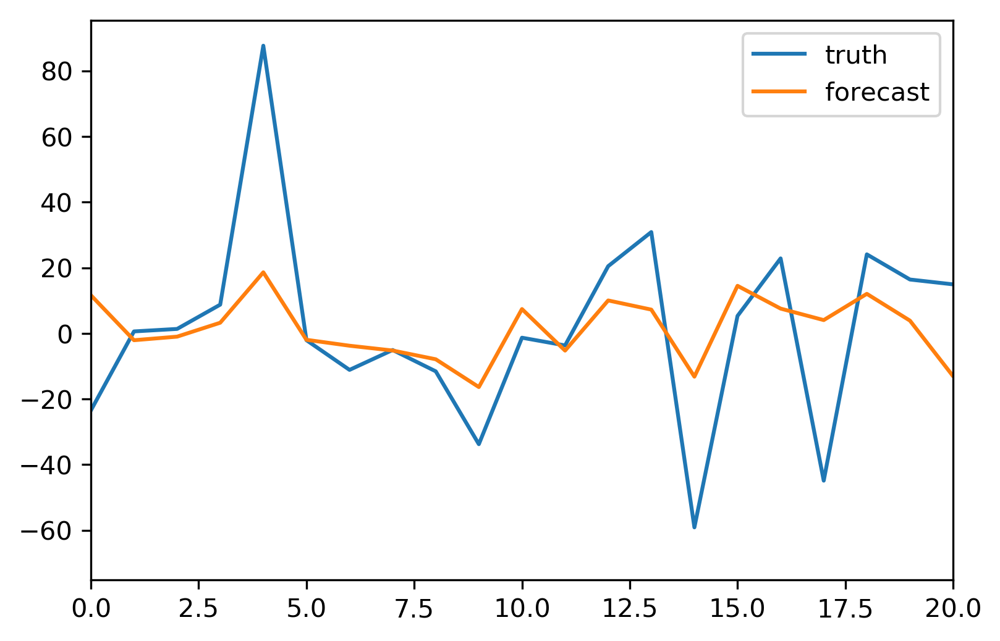

Month 1
Trained using month 1...
Validating against month 1
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


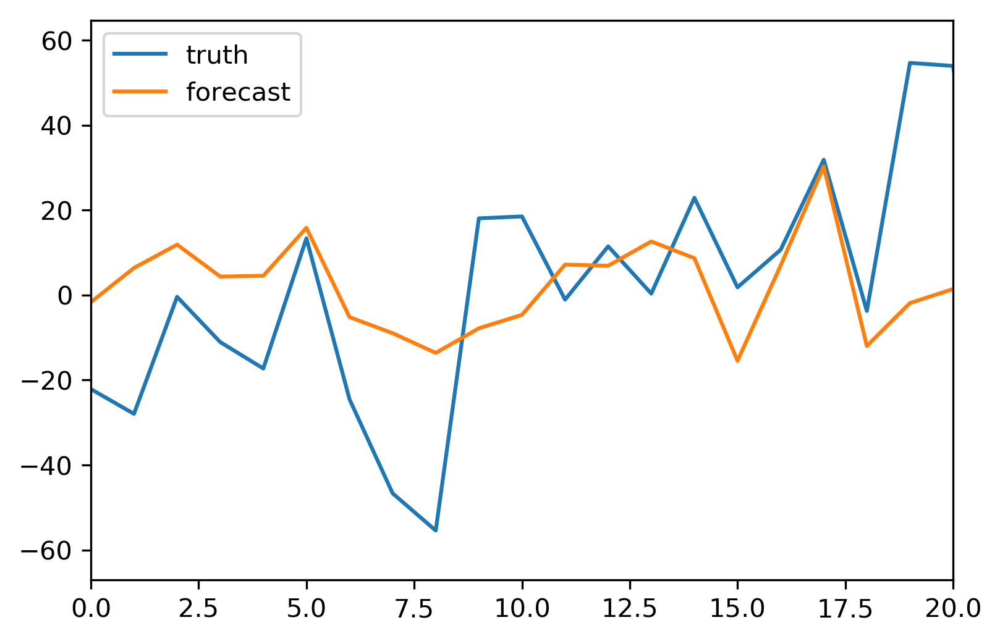

Month 2
Trained using month 2...
Validating against month 2
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


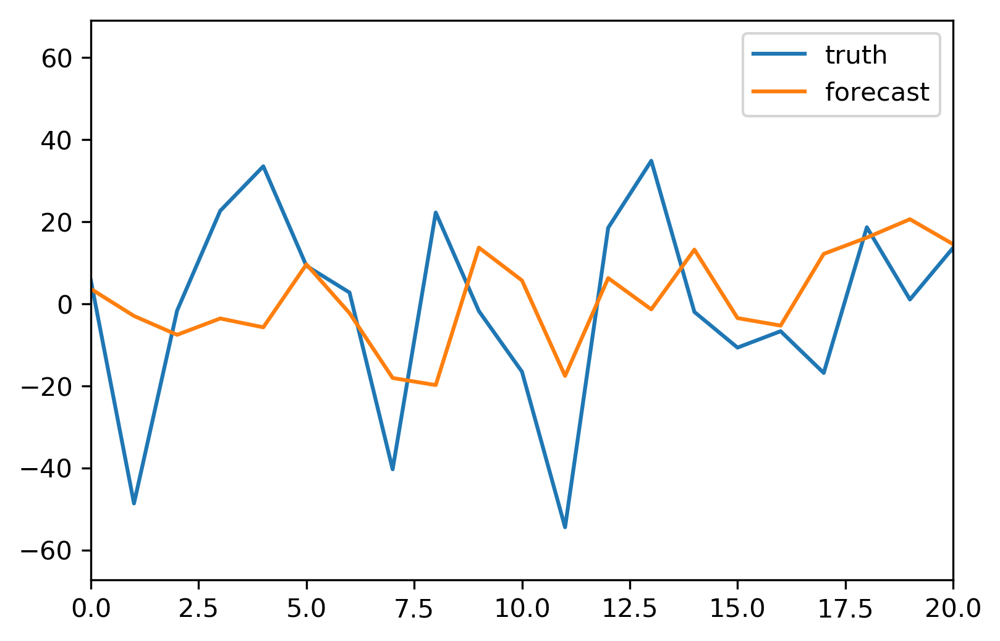

Month 3
Trained using month 3...
Validating against month 3
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


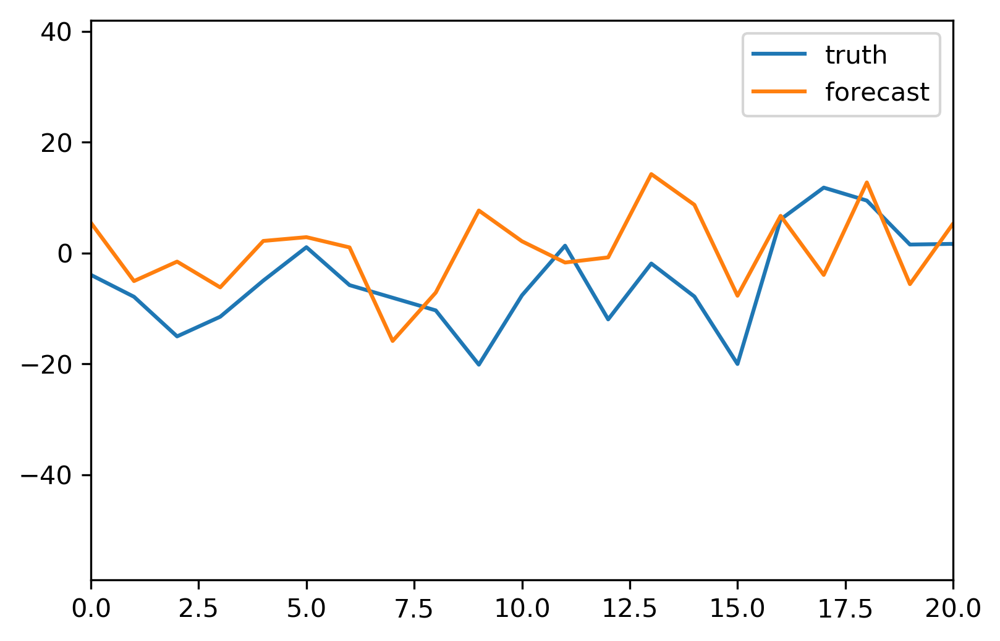

Month 4
Trained using month 4...
Validating against month 4
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


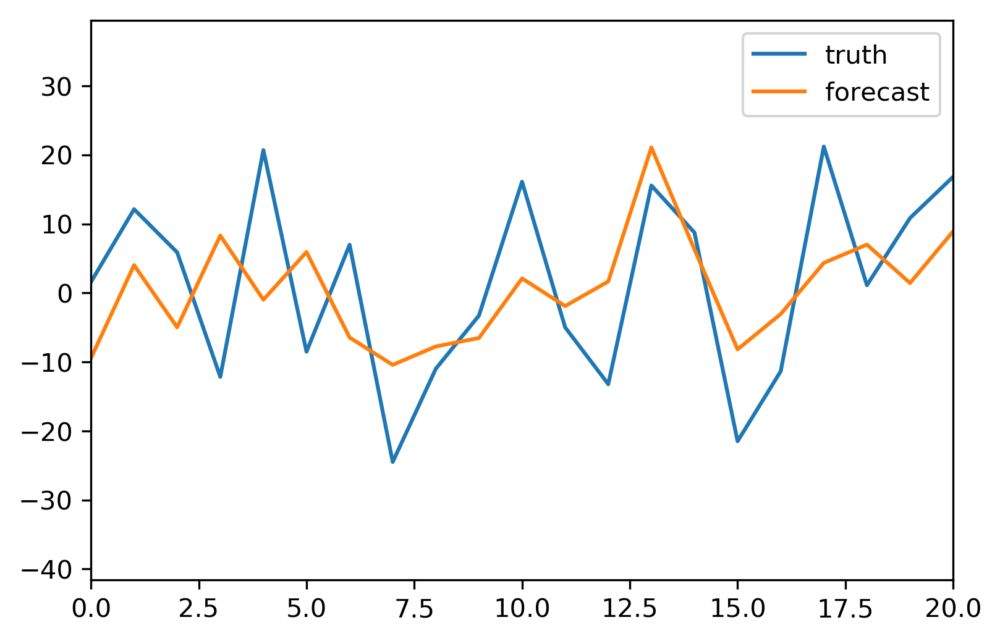

Month 5
Trained using month 5...
Validating against month 5
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


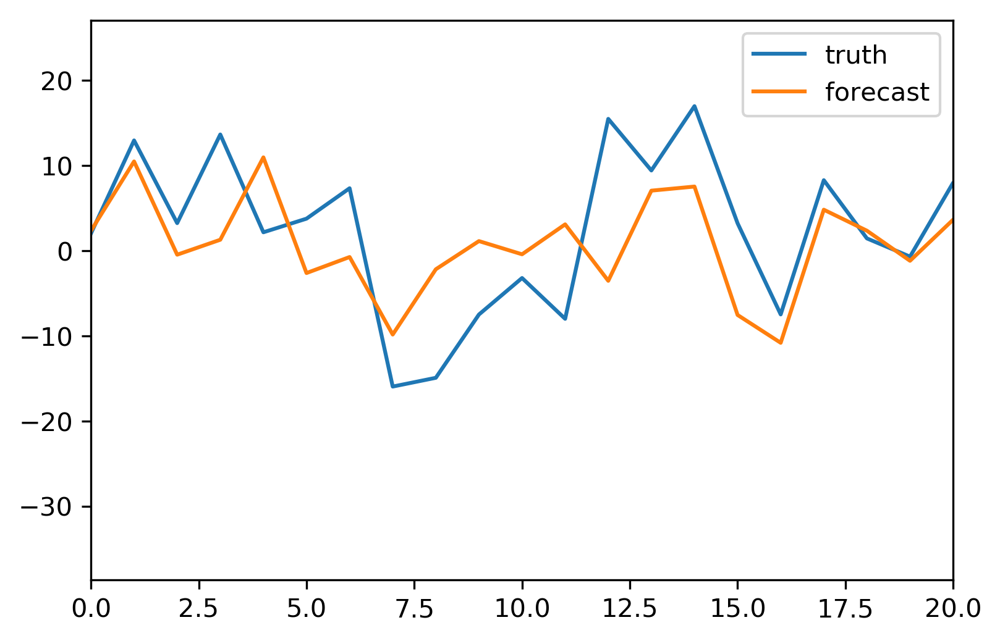

Month 6
Trained using month 6...
Validating against month 6
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


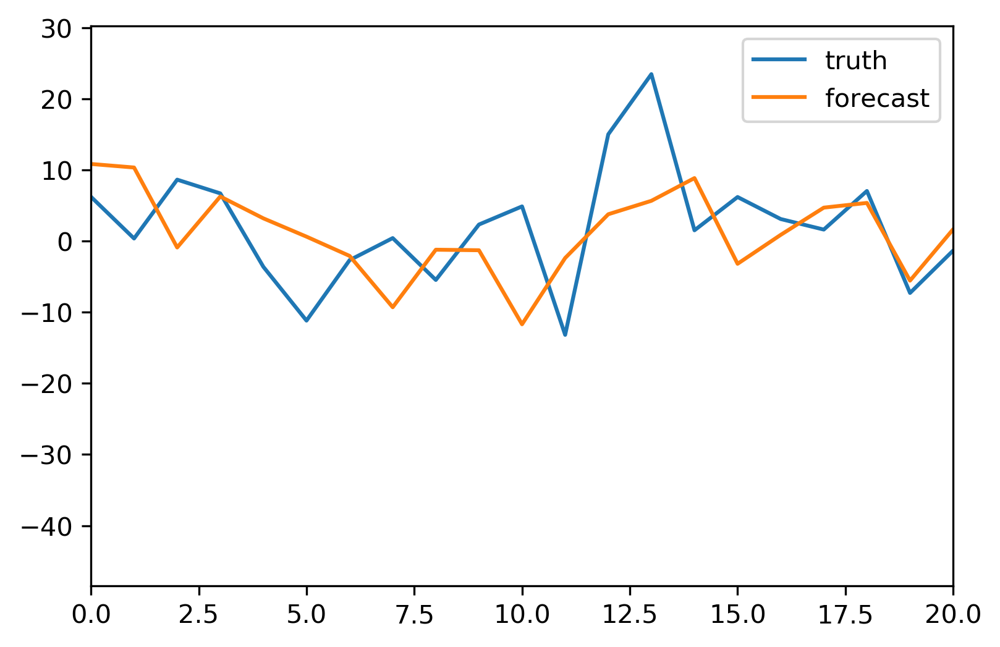

Month 7
Trained using month 7...
Validating against month 7
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


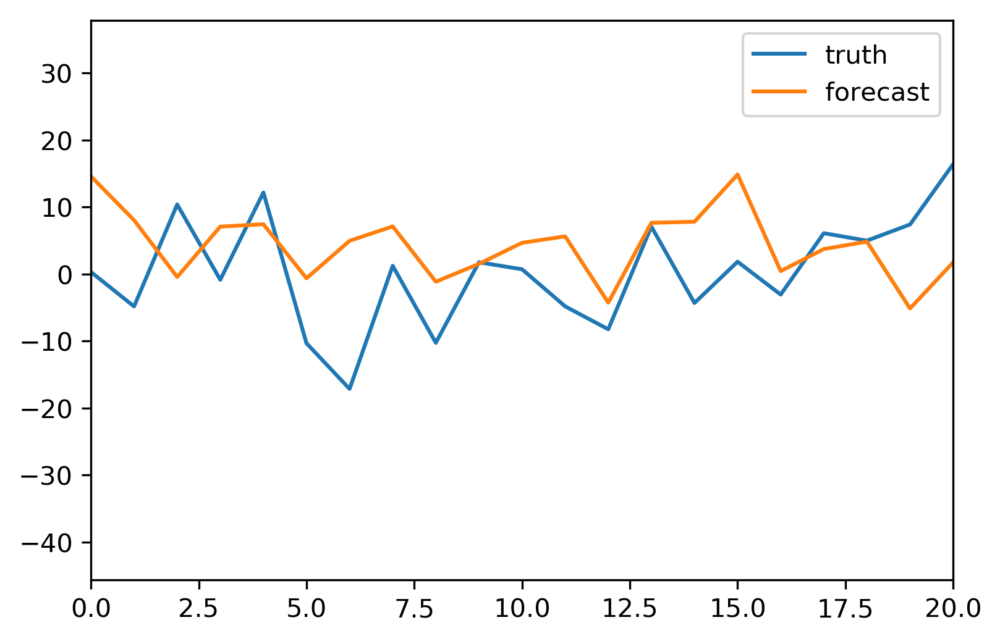

Month 8
Trained using month 8...
Validating against month 8
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


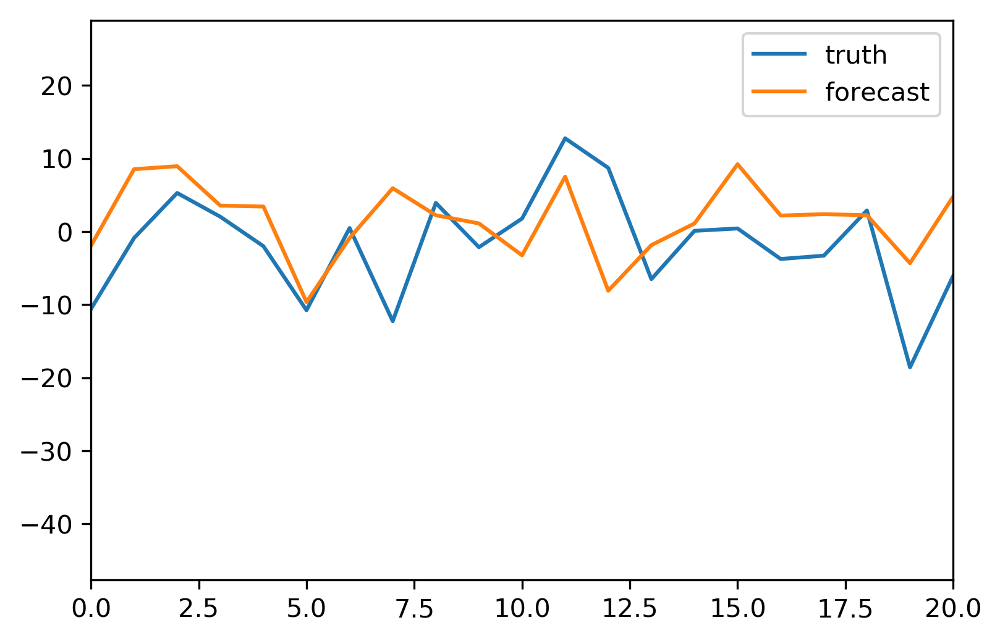

Month 9
Trained using month 9...
Validating against month 9
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


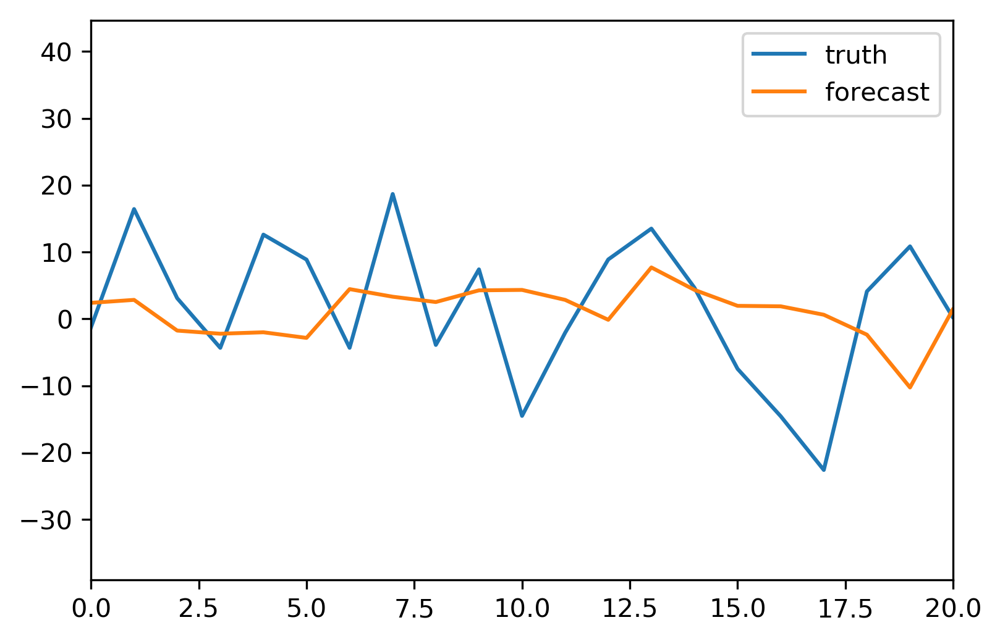

Month 10
Trained using month 10...
Validating against month 10
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


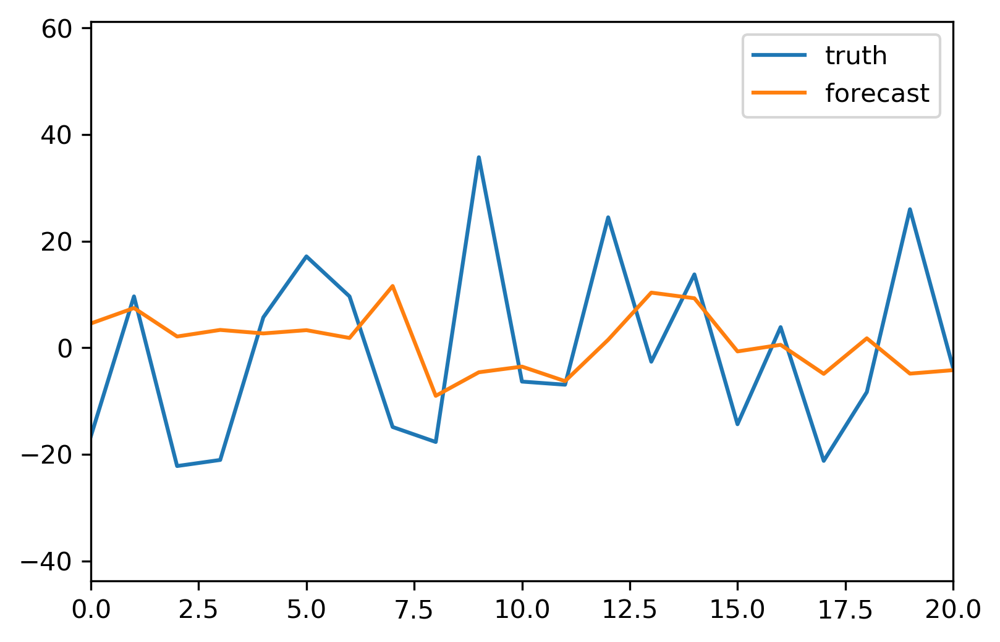

Month 11
Trained using month 11...
Validating against month 11
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


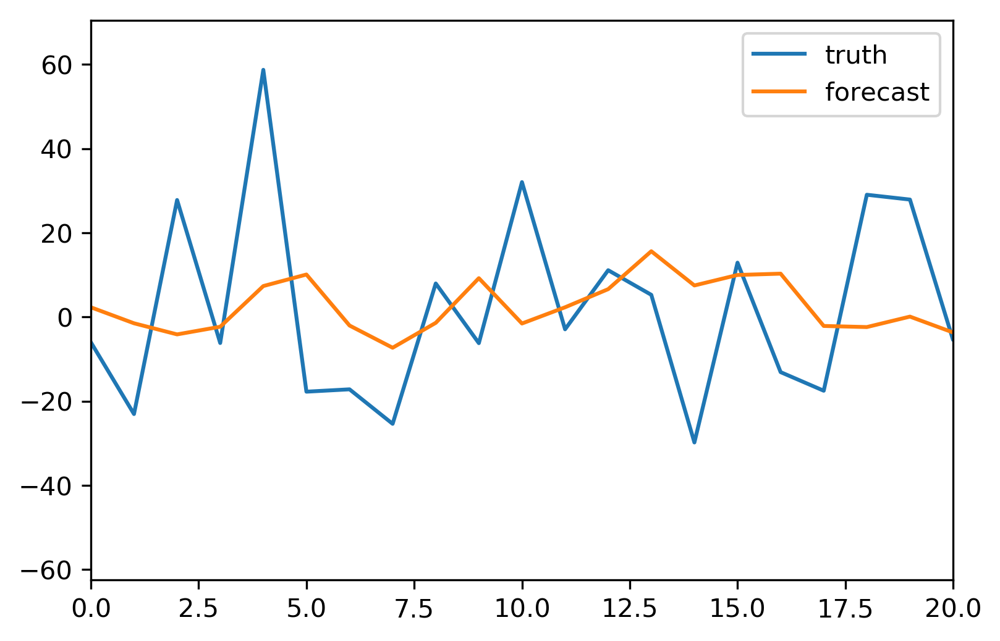

tecut = 1001, tscut = 801.0
Loading from tos
Loading from a/LME/LIMs/tos_sfc_Omon_CESM_LMEallforc_002_085001-200512.nc
time dimension: 1651 - 1850
detrending...
Working on month...0
Found with nans (not in satellite), going to fill with zeros...
Working on month...1
Found with nans (not in satellite), going to fill with zeros...
Working on month...2
Found with nans (not in satellite), going to fill with zeros...
Working on month...3
Found with nans (not in satellite), going to fill with zeros...
Working on month...4
Found with nans (not in satellite), going to fill with zeros...
Working on month...5
Found with nans (not in satellite), going to fill with zeros...
Working on month...6
Found with nans (not in satellite), going to fill with zeros...
Working on month...7
Found with nans (not in satellite), going to fill with zeros...
Working on month...8
Found with nans (not in satellite), going to fill with zeros...
Working on month...9
Found with nans (not in satellite), going to fill wit

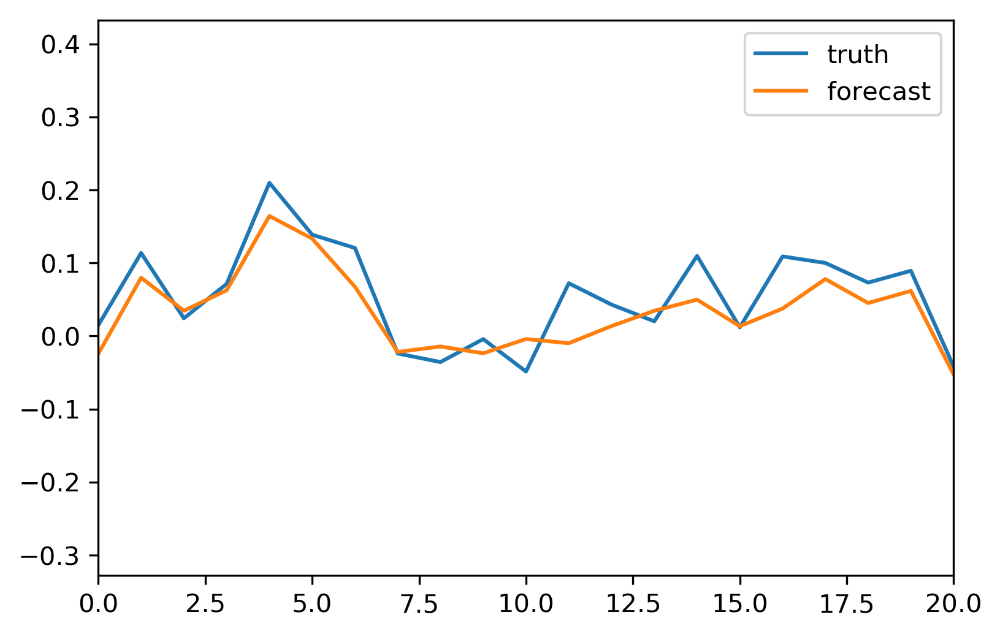

Month 1
Trained using month 1...
Validating against month 1
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


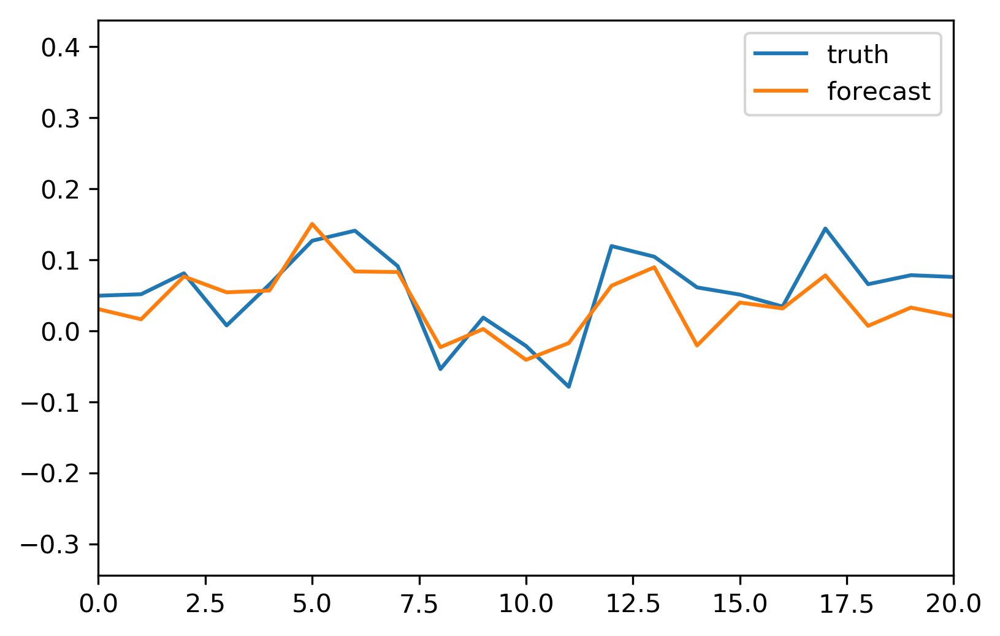

Month 2
Trained using month 2...
Validating against month 2
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


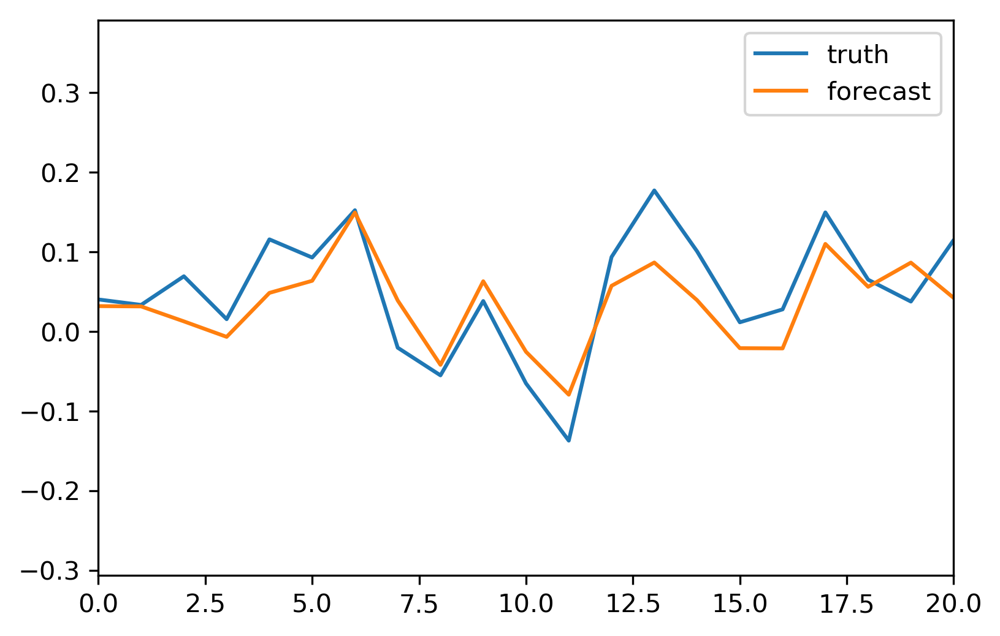

Month 3
Trained using month 3...
Validating against month 3
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


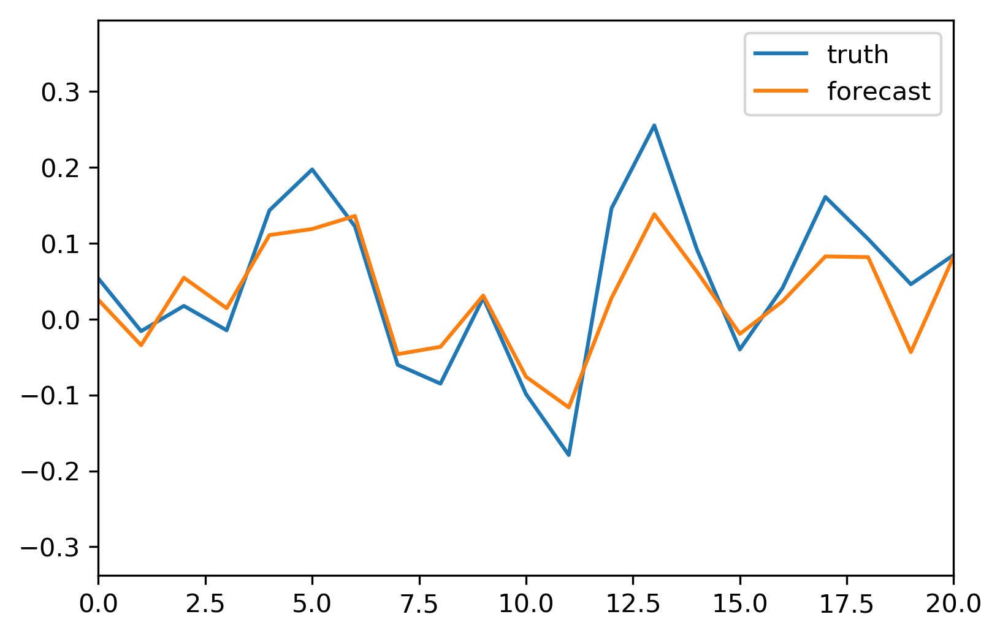

Month 4
Trained using month 4...
Validating against month 4
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


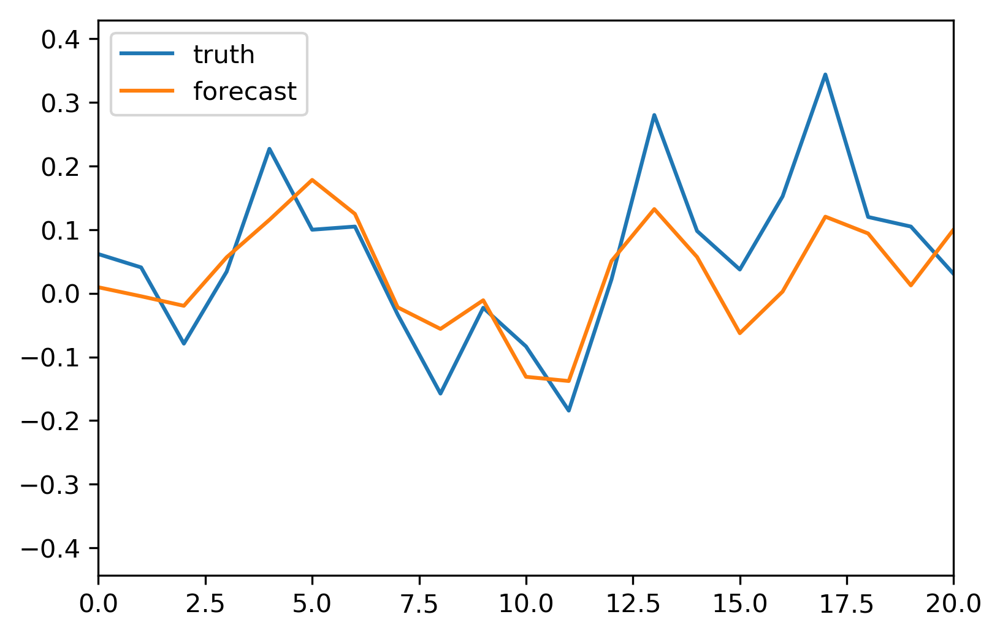

Month 5
Trained using month 5...
Validating against month 5
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


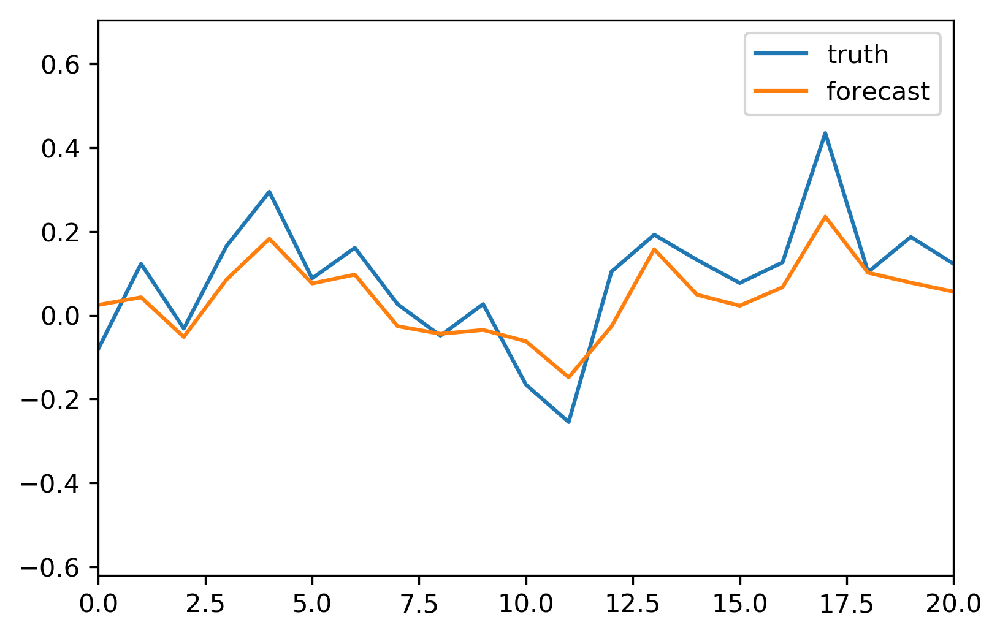

Month 6
Trained using month 6...
Validating against month 6
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


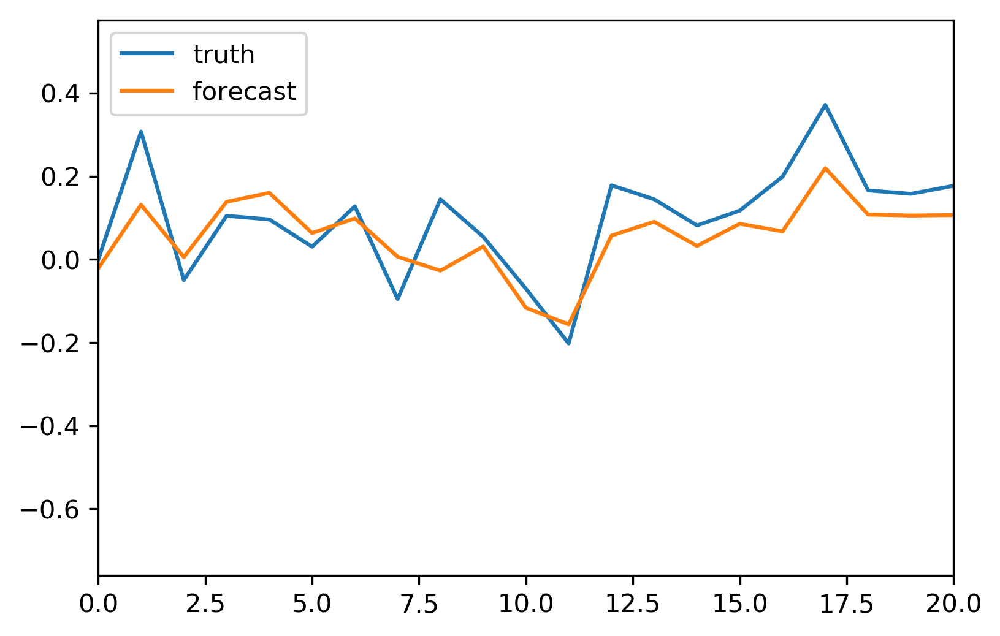

Month 7
Trained using month 7...
Validating against month 7
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


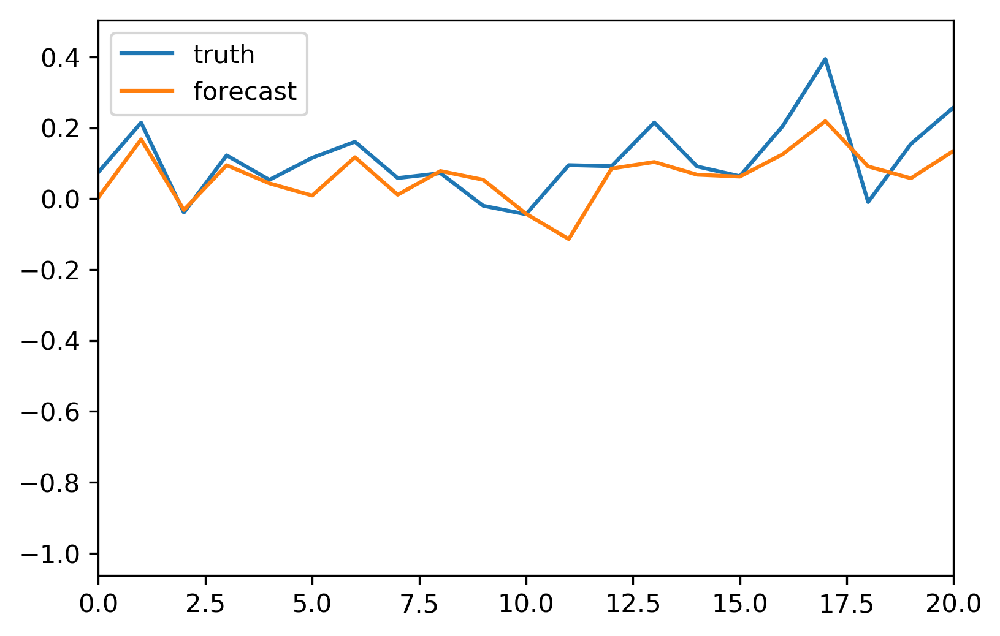

Month 8
Trained using month 8...
Validating against month 8
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


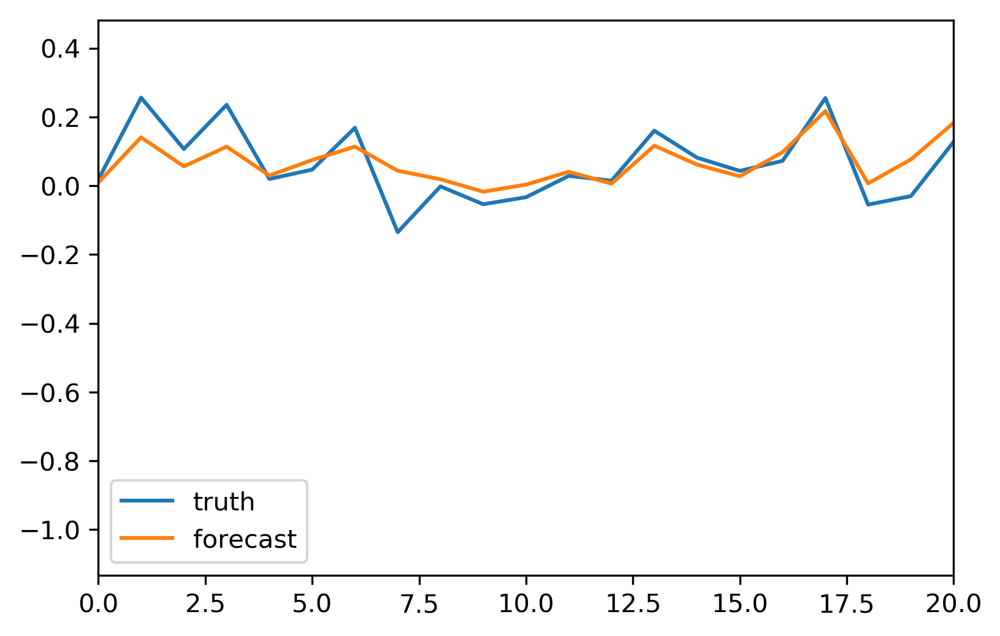

Month 9
Trained using month 9...
Validating against month 9
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


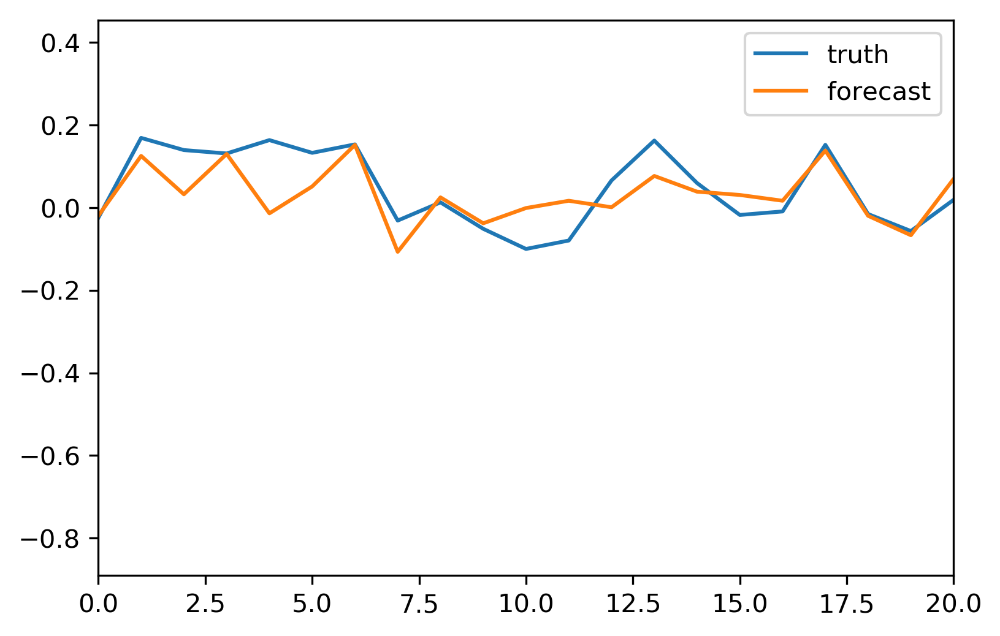

Month 10
Trained using month 10...
Validating against month 10
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


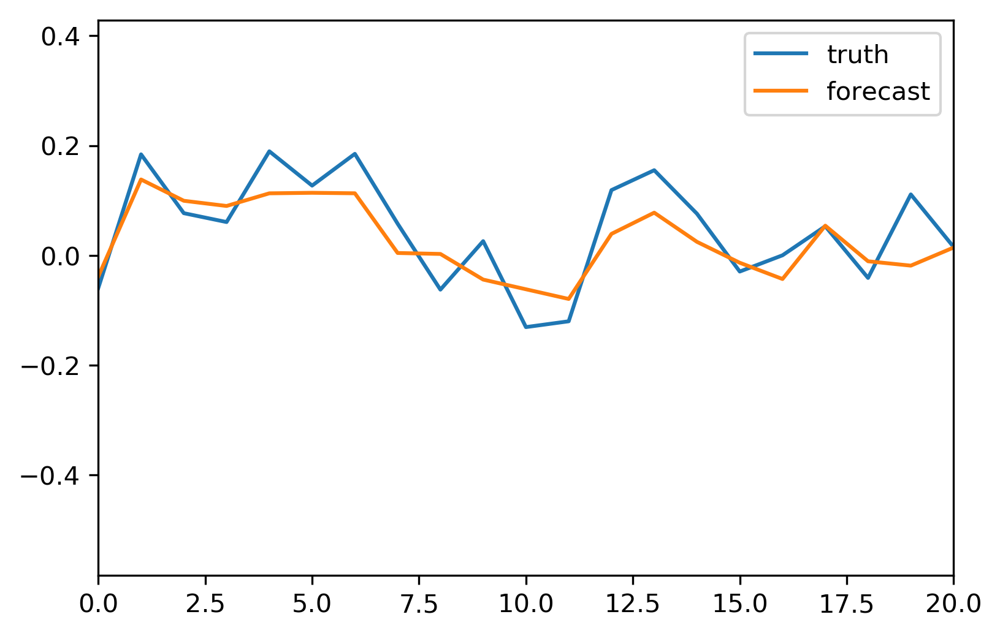

Month 11
Trained using month 11...
Validating against month 11
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


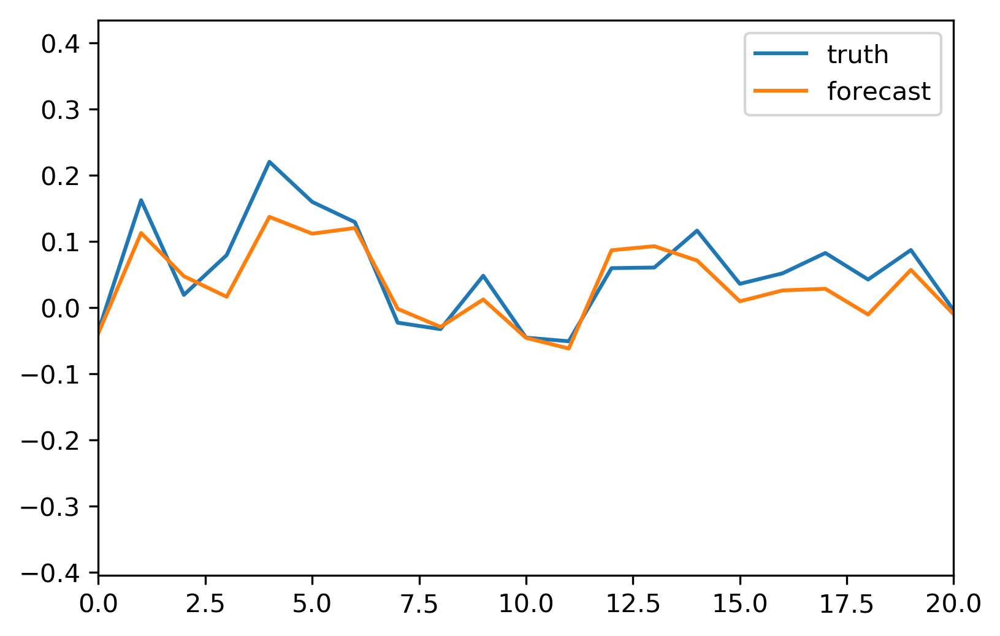

tecut = 1001, tscut = 801.0
Loading from sit
Loading from aIceData/LME/LIMs/sit_SImon_CESM_LME_nh_002_085001-200512.nc
time dimension: 1651 - 1850
detrending...
Working on month...0
Found with nans (not in satellite), going to fill with zeros...
Working on month...1
Found with nans (not in satellite), going to fill with zeros...
Working on month...2
Found with nans (not in satellite), going to fill with zeros...
Working on month...3
Found with nans (not in satellite), going to fill with zeros...
Working on month...4
Found with nans (not in satellite), going to fill with zeros...
Working on month...5
Found with nans (not in satellite), going to fill with zeros...
Working on month...6
Found with nans (not in satellite), going to fill with zeros...
Working on month...7
Found with nans (not in satellite), going to fill with zeros...
Working on month...8
Found with nans (not in satellite), going to fill with zeros...
Working on month...9
Found with nans (not in satellite), going to fill wit

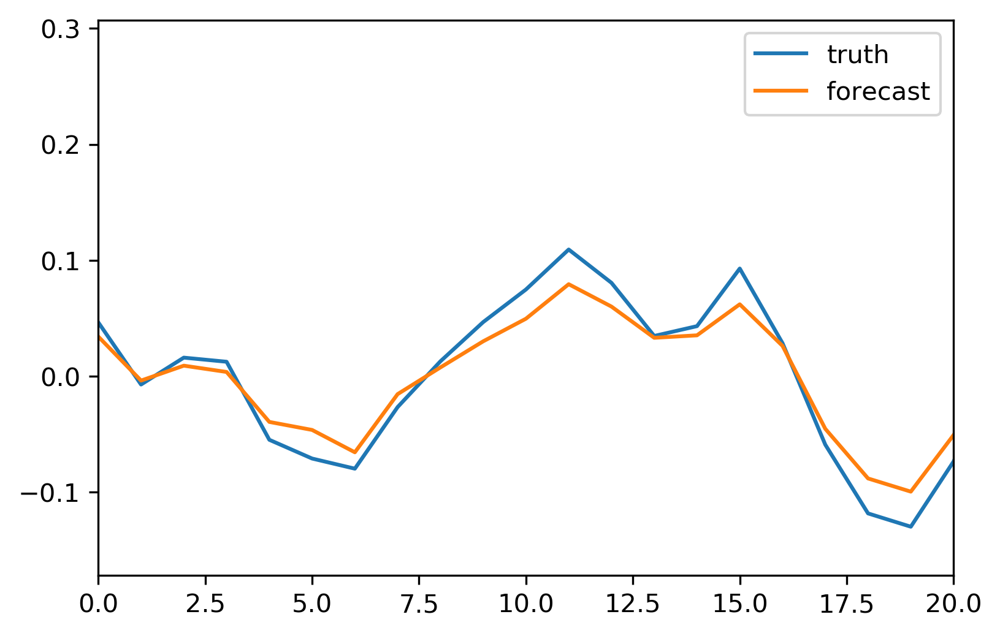

Month 1
Trained using month 1...
Validating against month 1
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


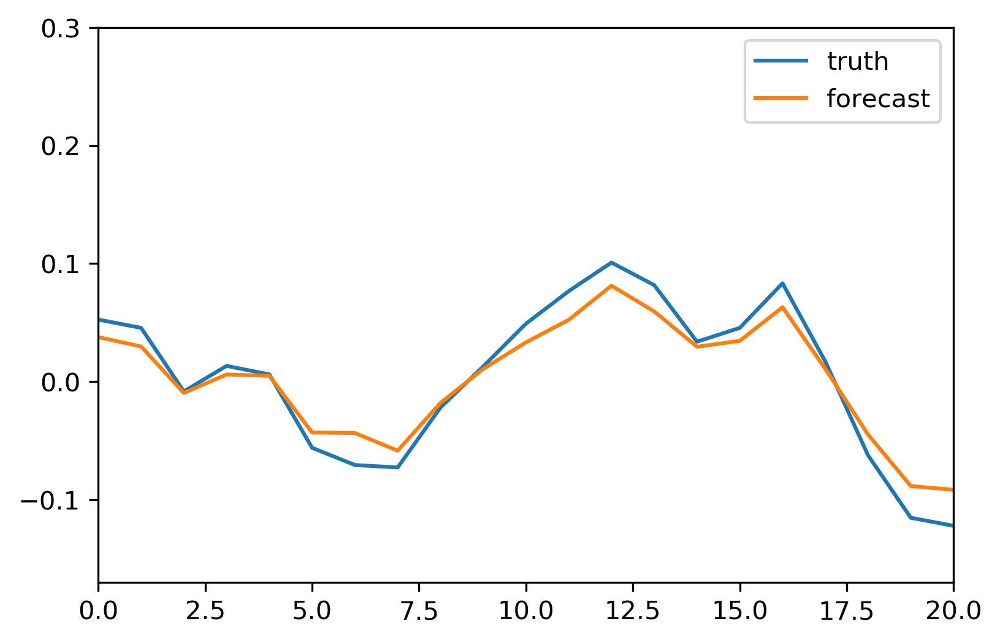

Month 2
Trained using month 2...
Validating against month 2
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


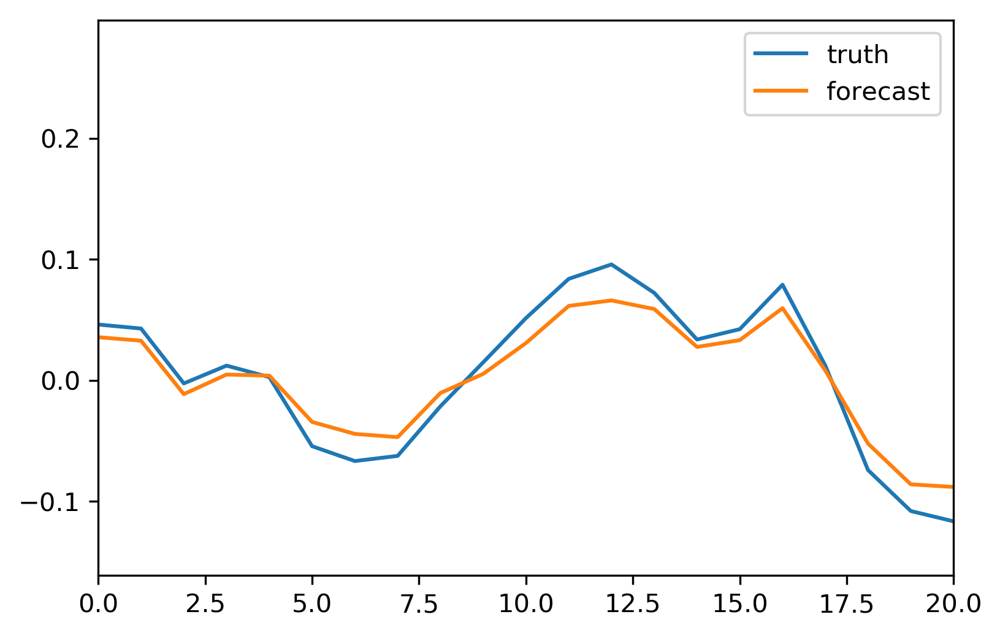

Month 3
Trained using month 3...
Validating against month 3
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


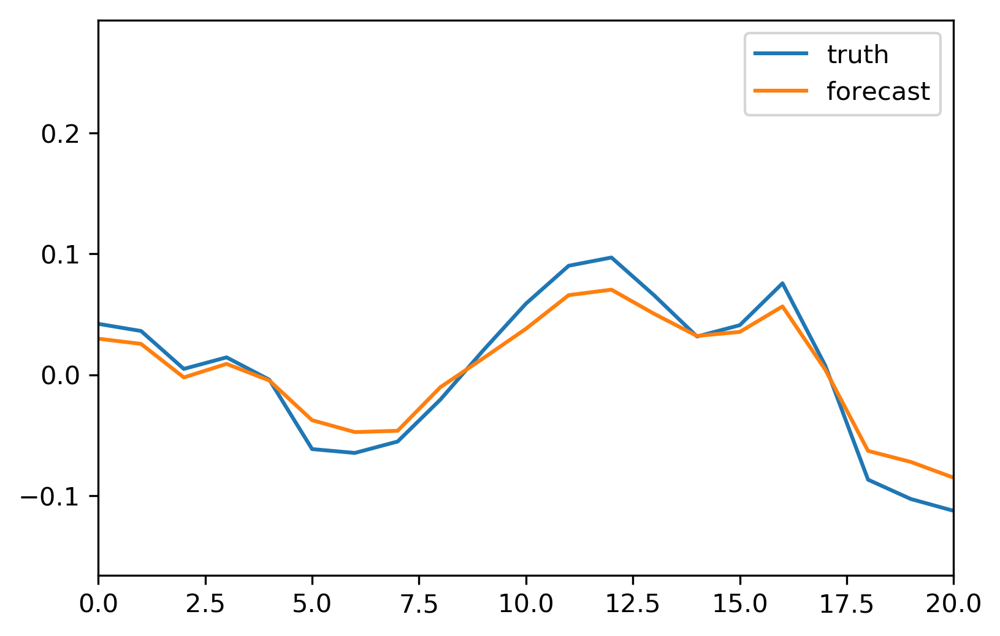

Month 4
Trained using month 4...
Validating against month 4
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


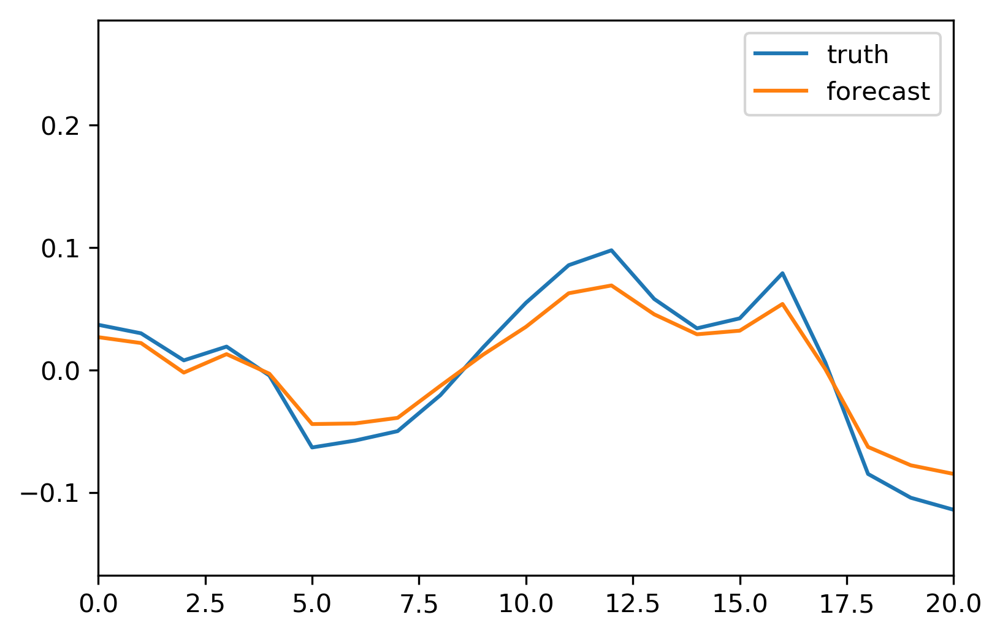

Month 5
Trained using month 5...
Validating against month 5
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


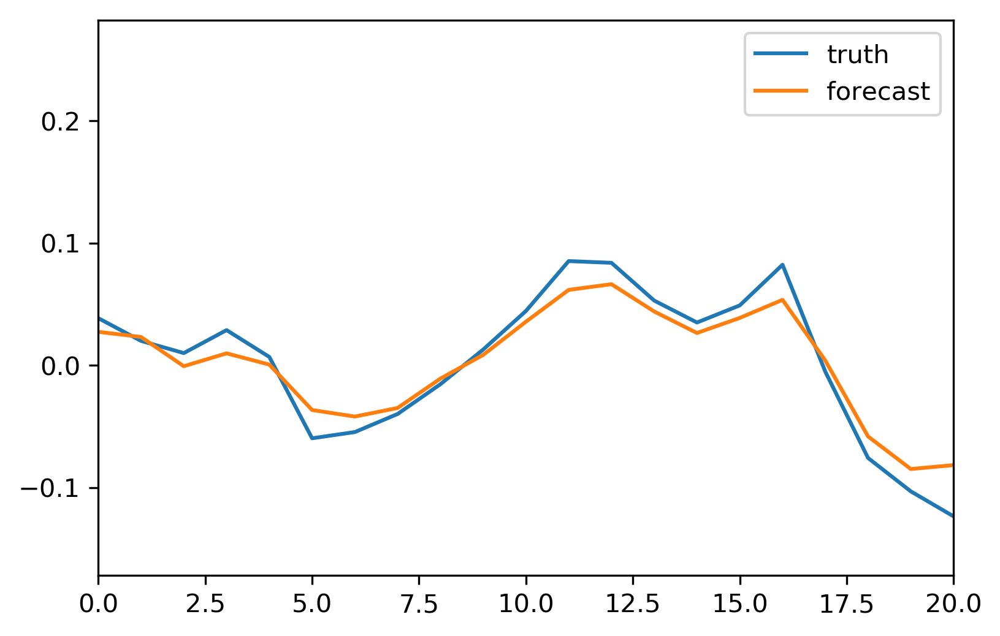

Month 6
Trained using month 6...
Validating against month 6
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


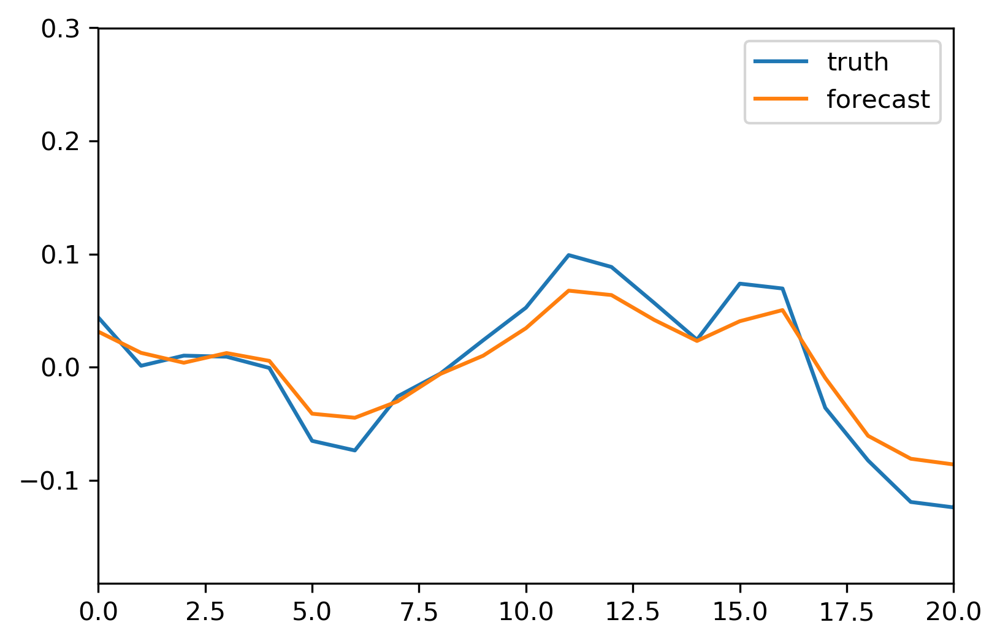

Month 7
Trained using month 7...
Validating against month 7
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


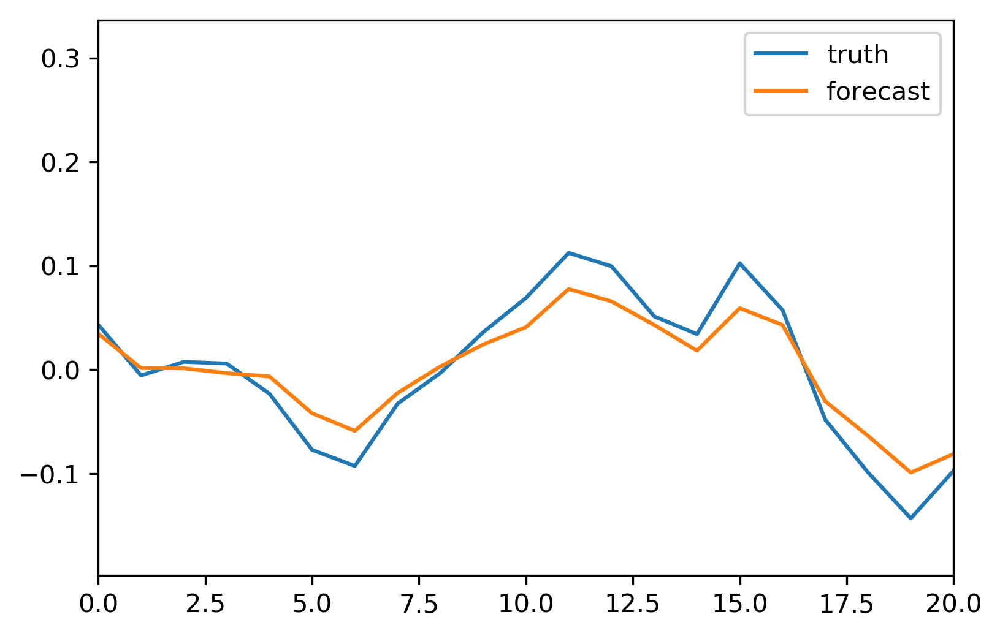

Month 8
Trained using month 8...
Validating against month 8
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


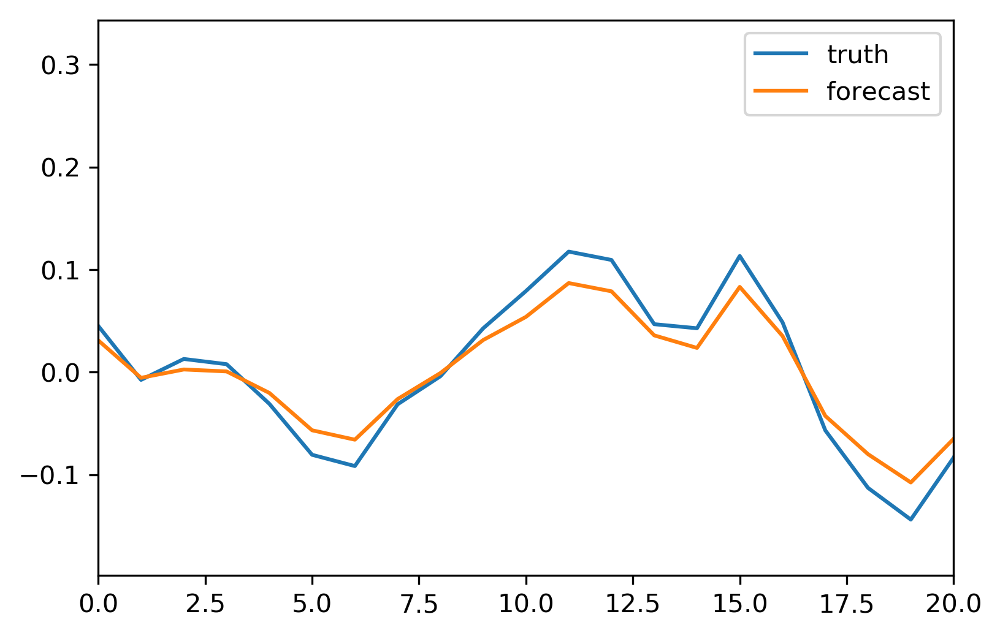

Month 9
Trained using month 9...
Validating against month 9
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


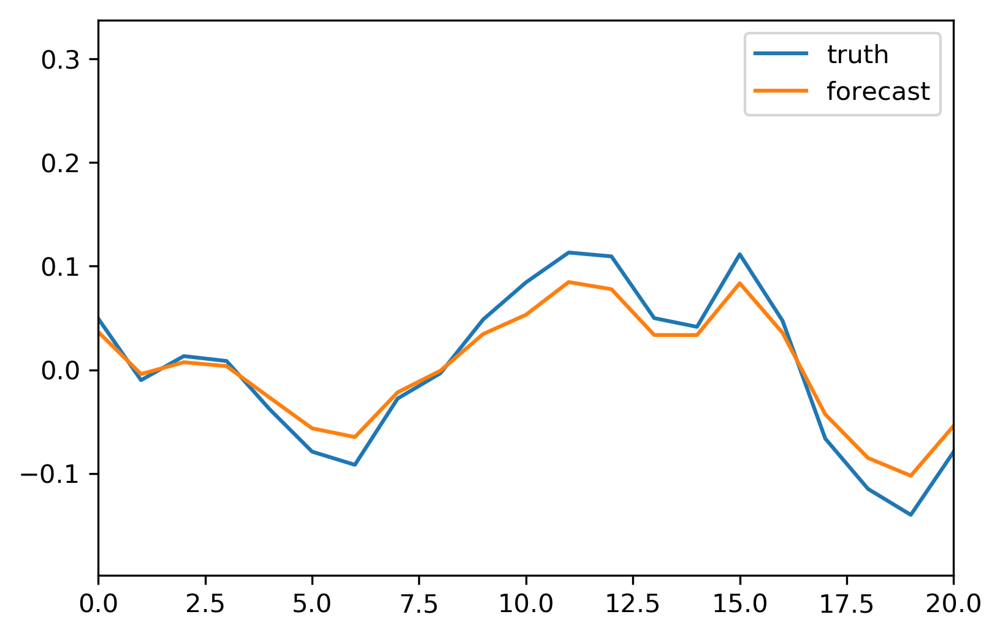

Month 10
Trained using month 10...
Validating against month 10
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


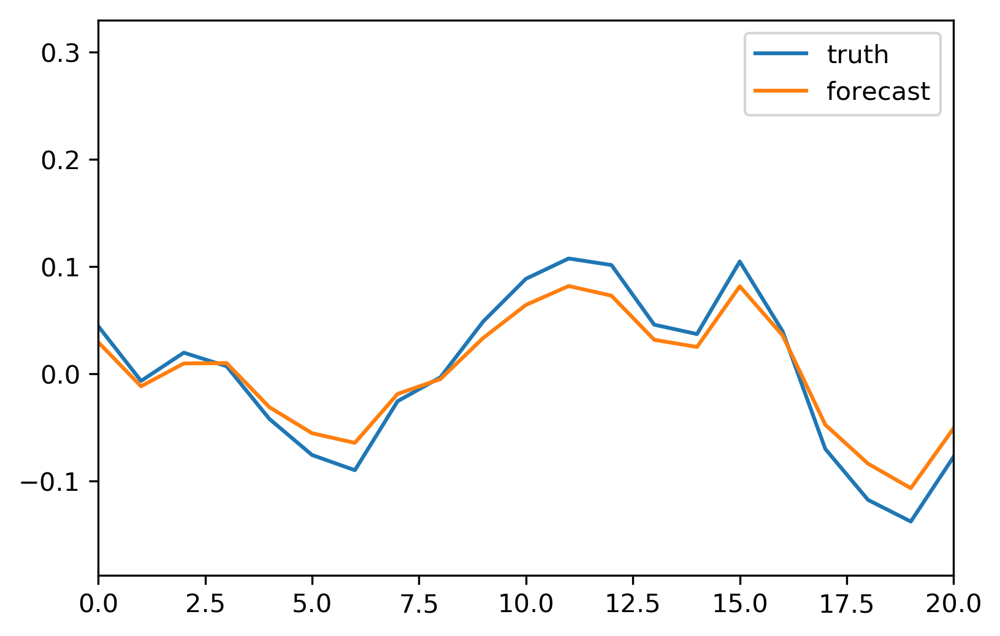

Month 11
Trained using month 11...
Validating against month 11
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


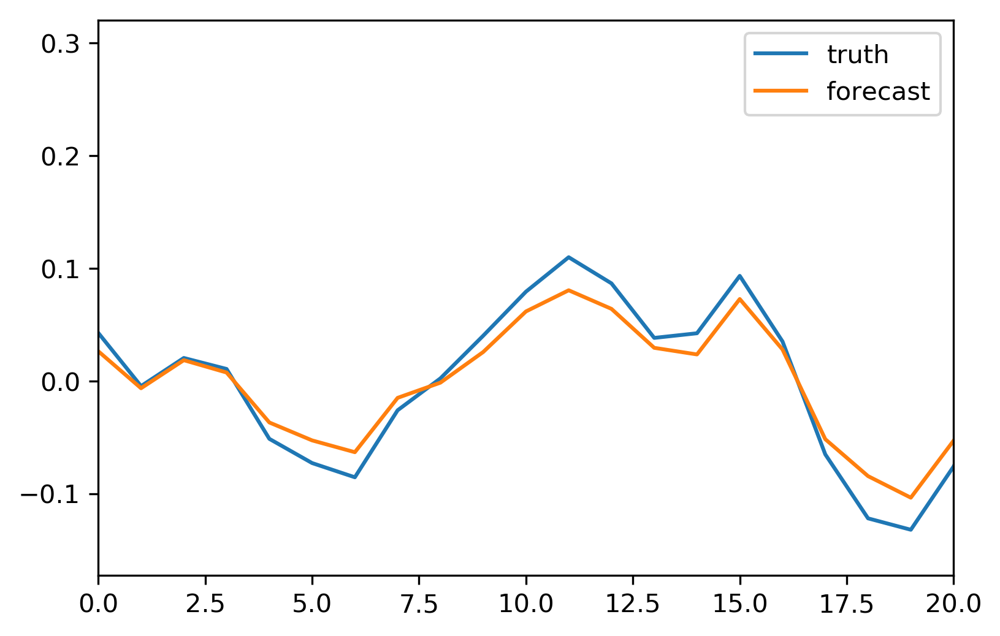

tecut = 1001, tscut = 801.0
Loading from sic
Loading from aIceData/LME/LIMs/sic_SImon_CESM_LME_nh_002_085001-200512.nc
time dimension: 1651 - 1850
detrending...
Working on month...0
Found with nans (not in satellite), going to fill with zeros...
Working on month...1
Found with nans (not in satellite), going to fill with zeros...
Working on month...2
Found with nans (not in satellite), going to fill with zeros...
Working on month...3
Found with nans (not in satellite), going to fill with zeros...
Working on month...4
Found with nans (not in satellite), going to fill with zeros...
Working on month...5
Found with nans (not in satellite), going to fill with zeros...
Working on month...6
Found with nans (not in satellite), going to fill with zeros...
Working on month...7
Found with nans (not in satellite), going to fill with zeros...
Working on month...8
Found with nans (not in satellite), going to fill with zeros...
Working on month...9
Found with nans (not in satellite), going to fill wit

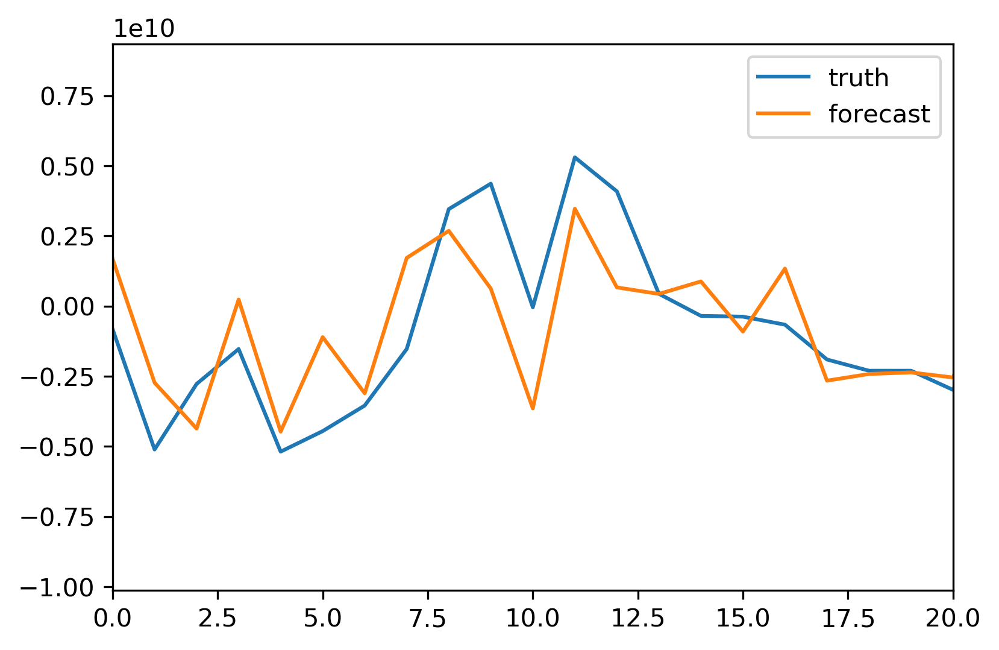

Month 1
Trained using month 1...
Validating against month 1
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


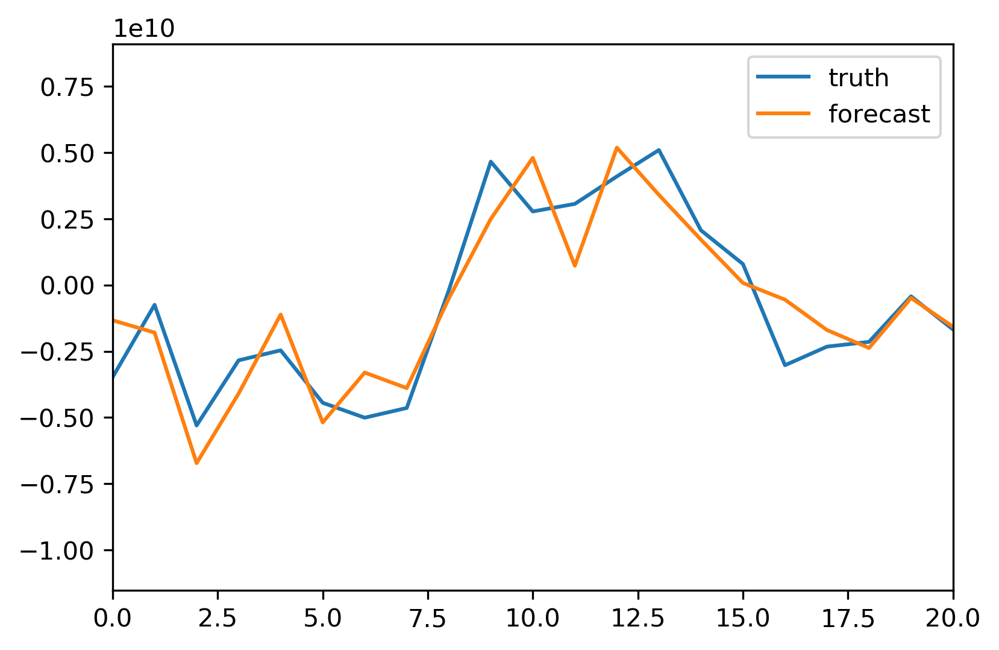

Month 2
Trained using month 2...
Validating against month 2
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


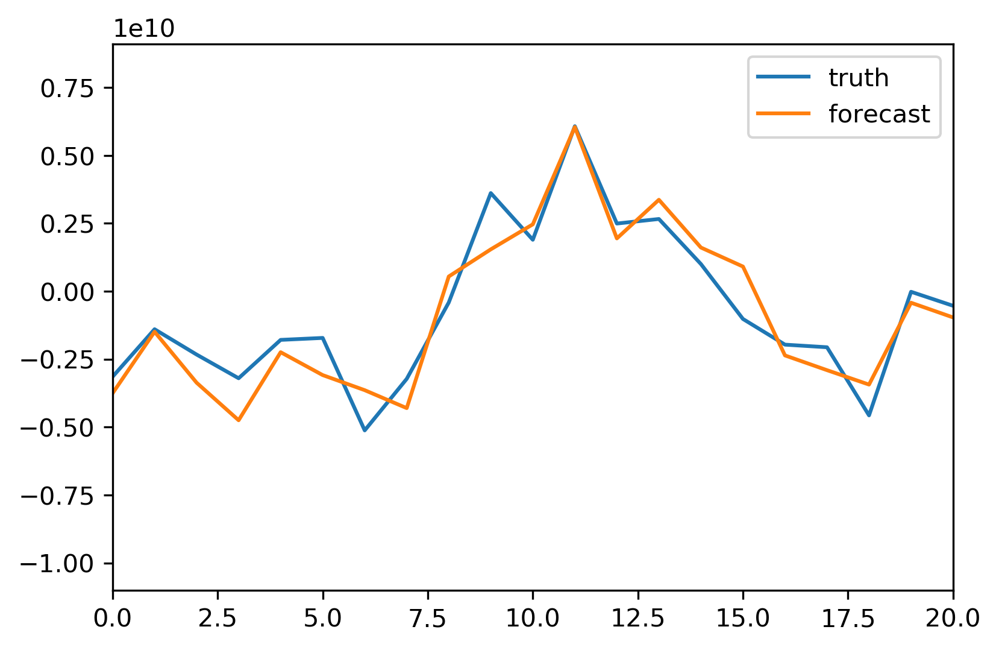

Month 3
Trained using month 3...
Validating against month 3
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


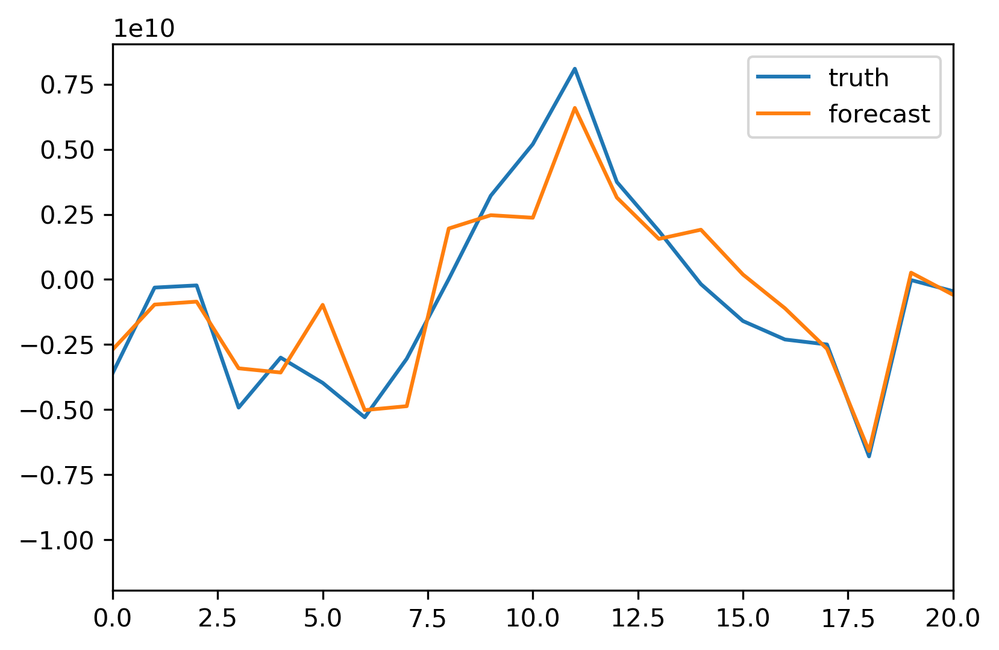

Month 4
Trained using month 4...
Validating against month 4
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


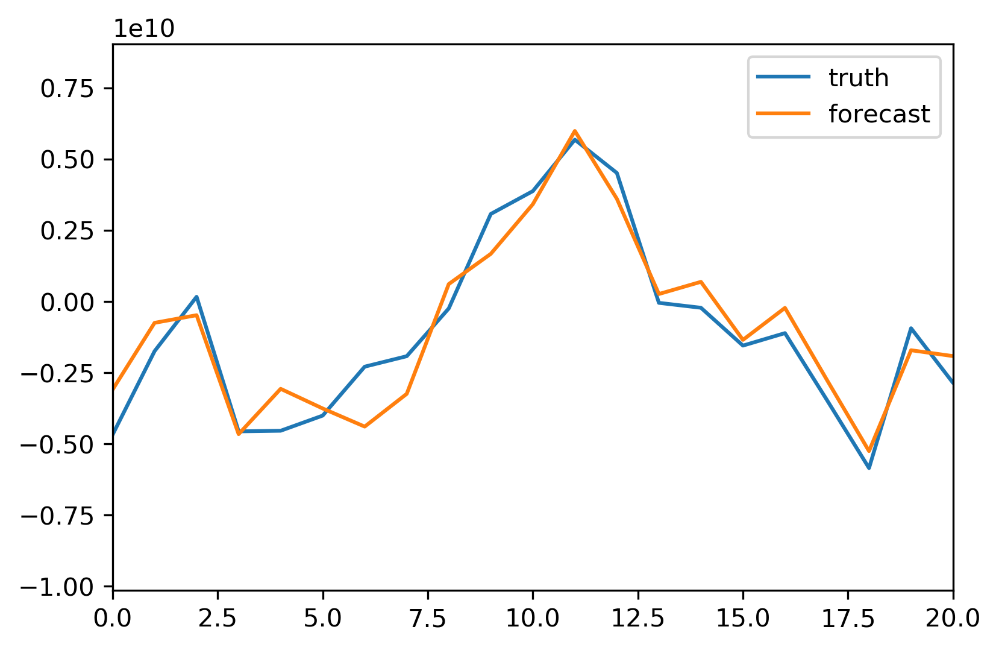

Month 5
Trained using month 5...
Validating against month 5
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


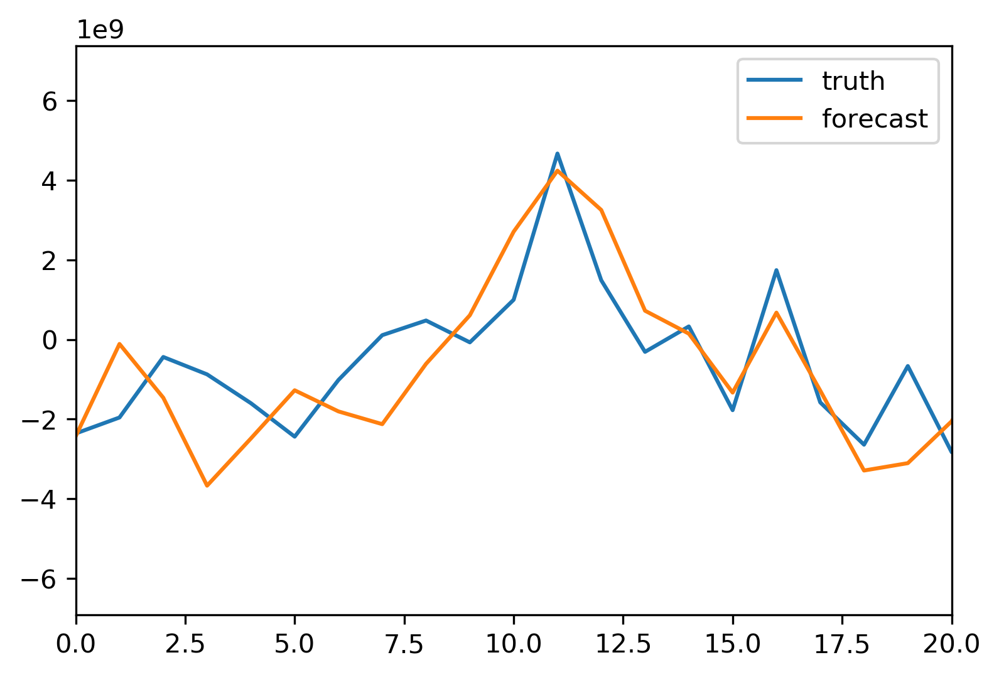

Month 6
Trained using month 6...
Validating against month 6
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


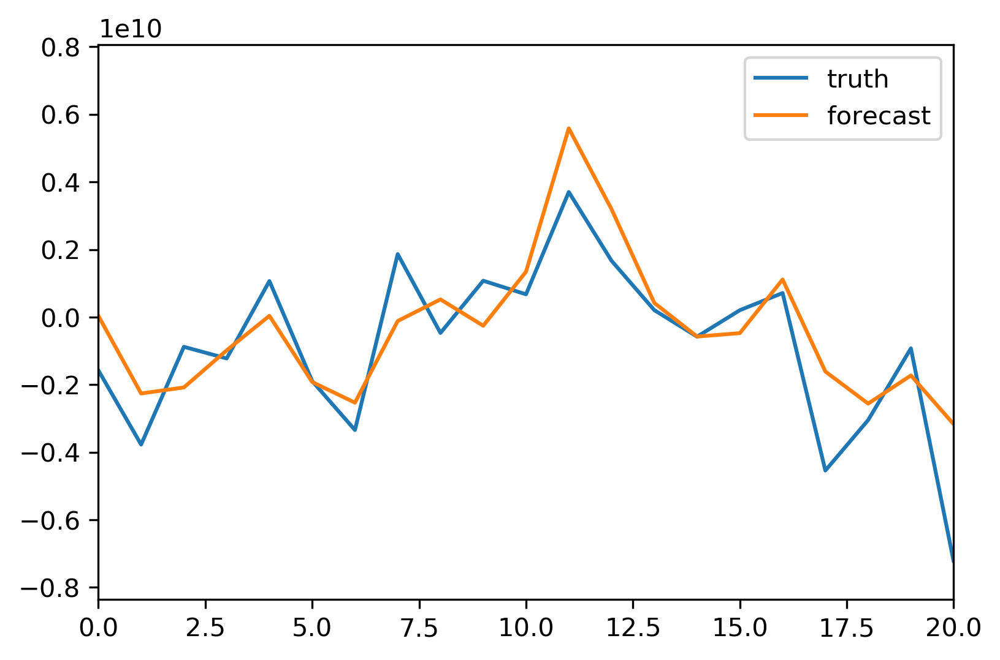

Month 7
Trained using month 7...
Validating against month 7
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


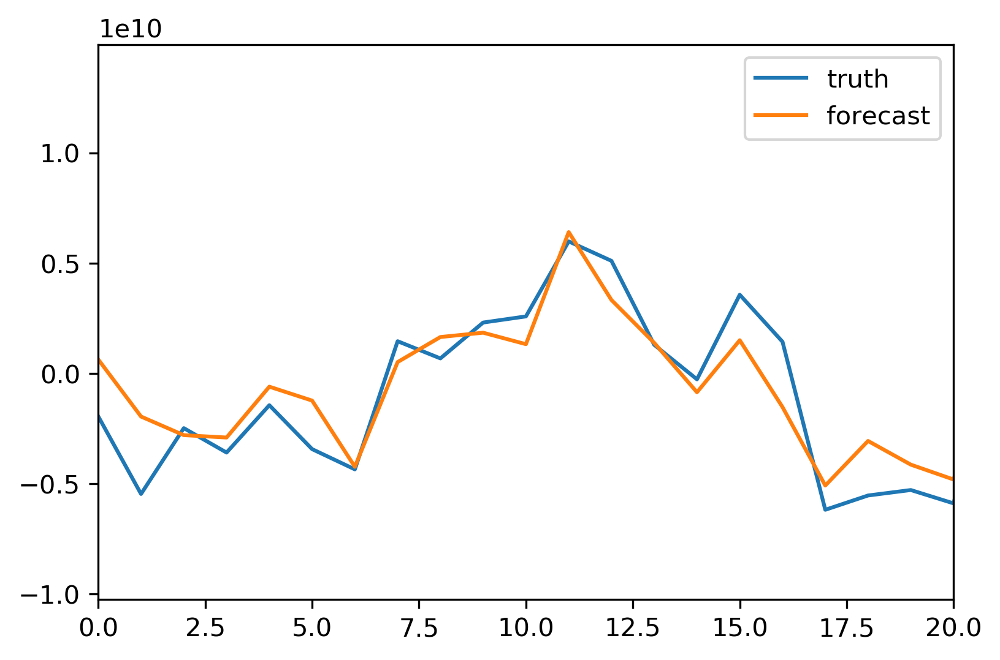

Month 8
Trained using month 8...
Validating against month 8
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


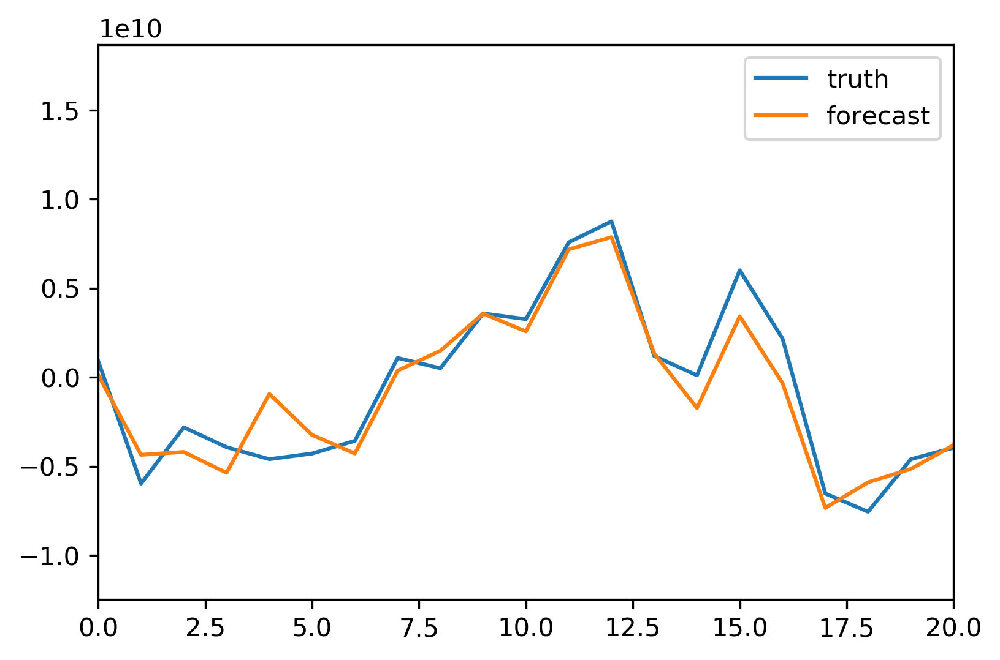

Month 9
Trained using month 9...
Validating against month 9
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


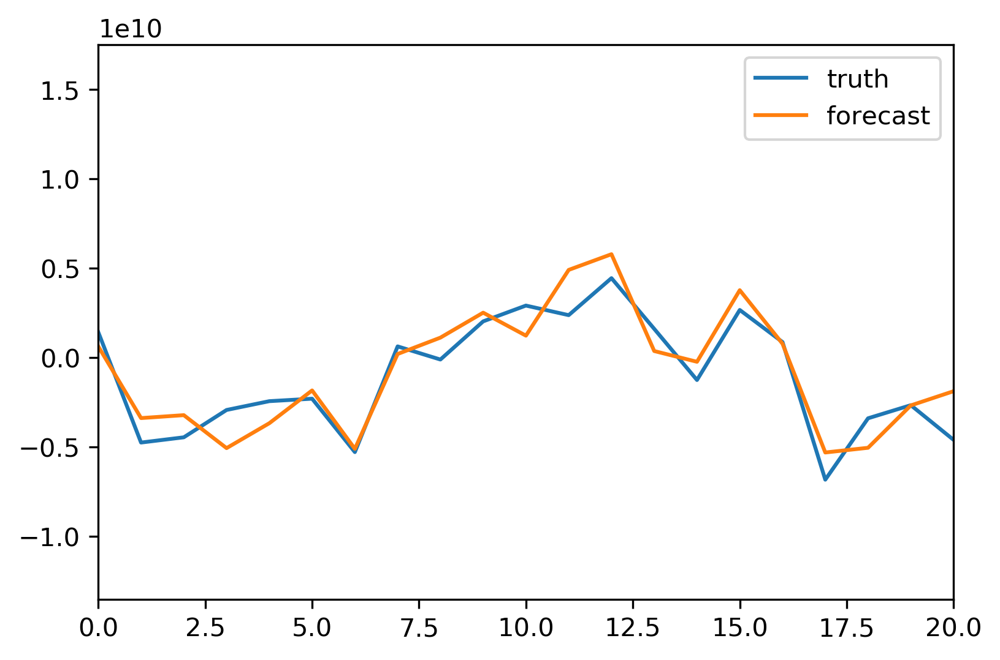

Month 10
Trained using month 10...
Validating against month 10
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


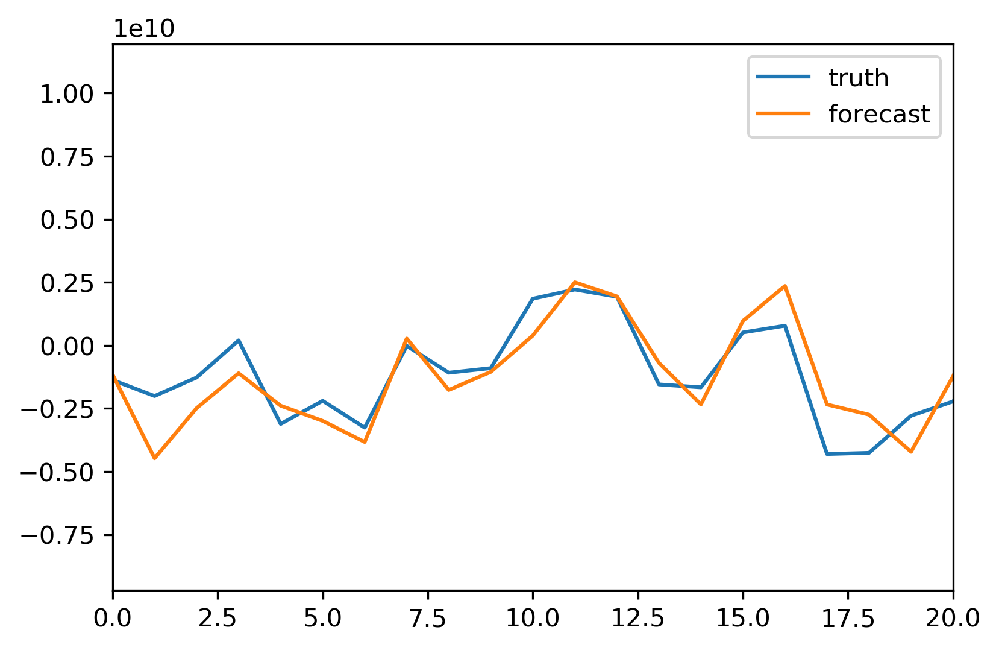

Month 11
Trained using month 11...
Validating against month 11
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


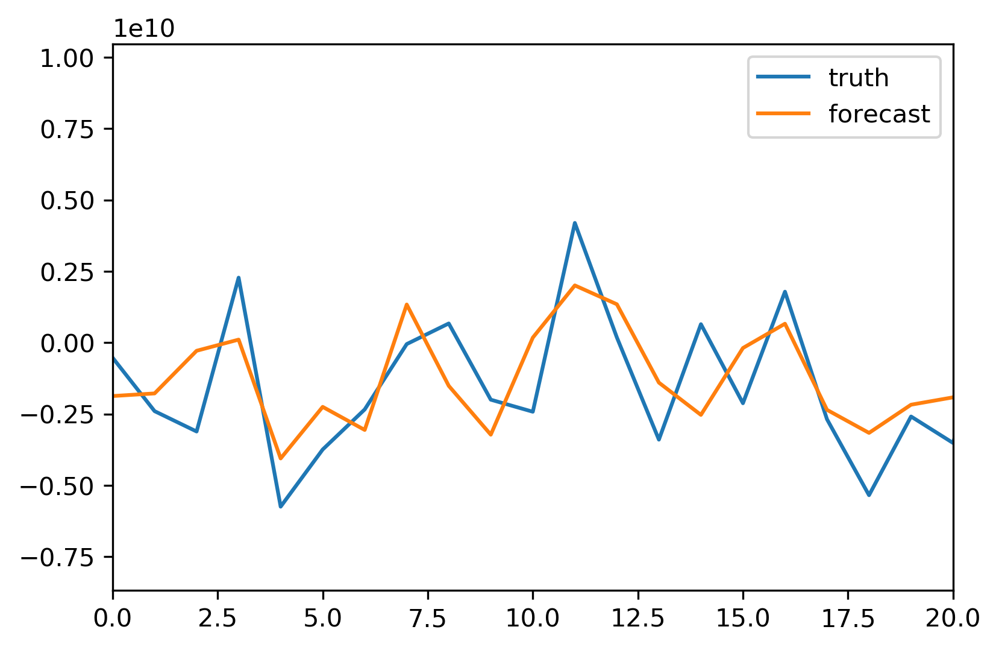

In [27]:
forecast_validation = rf.validate_forecast_monthly(forecast_os, exp_setup_os['limvars'], 1, exp_setup_os, 
                                                   LIMd_os, '', iplot=True, save=False)

Loading from cuments/SeaIceData/LME/LIMs/areacella_CESM_LME_global_001.nc
latitude cutoff detected: 50
Loading from b22/Documents/SeaIceData/LME/LIMs/areacello_global_LME_02.nc
latitude cutoff detected: 50
Lead = 1
tecut = 1001, tscut = 801.0
Loading from tas
Loading from a/LME/LIMs/tas_sfc_Amon_CESM_LMEallforc_002_085001-200512.nc
time dimension: 1651 - 1850
detrending...
Working on month...0
Working on month...1
Working on month...2
Working on month...3
Working on month...4
Working on month...5
Working on month...6
Working on month...7
Working on month...8
Working on month...9
Working on month...10
Working on month...11
latitude cutoff detected: 50
-----------------------------------------------------
completed in 23.260618686676025 seconds
-----------------------------------------------------
Month 0
Trained using month 0...
Validating against month 0
Truth_anom shape: (3168, 199)
Forecast_anom shape: (3168, 199)
changing cellarea units from m^2 to km^2


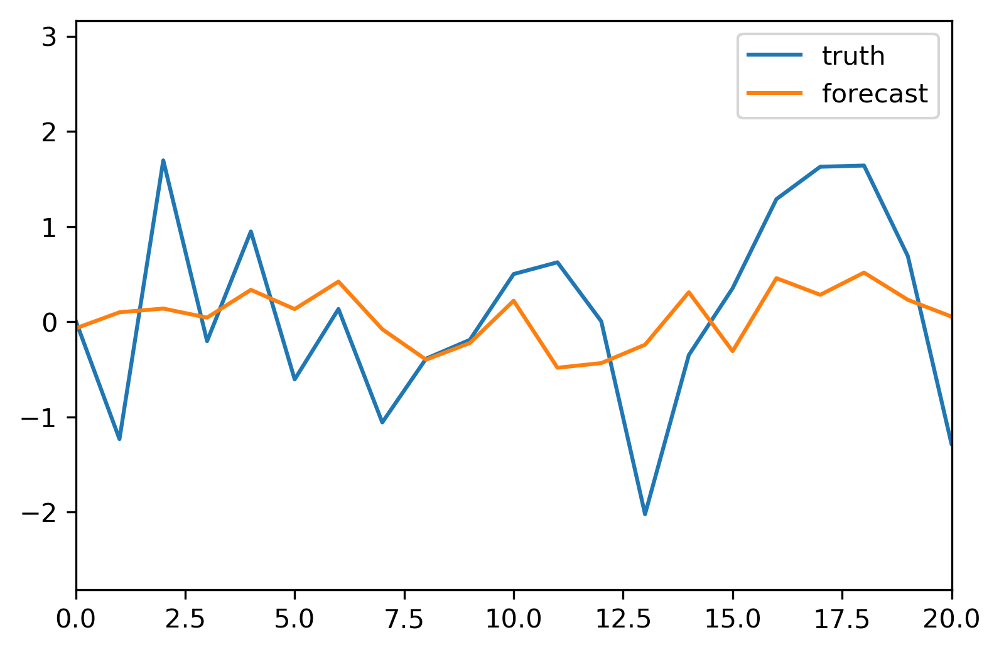

Month 1
Trained using month 1...
Validating against month 1
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


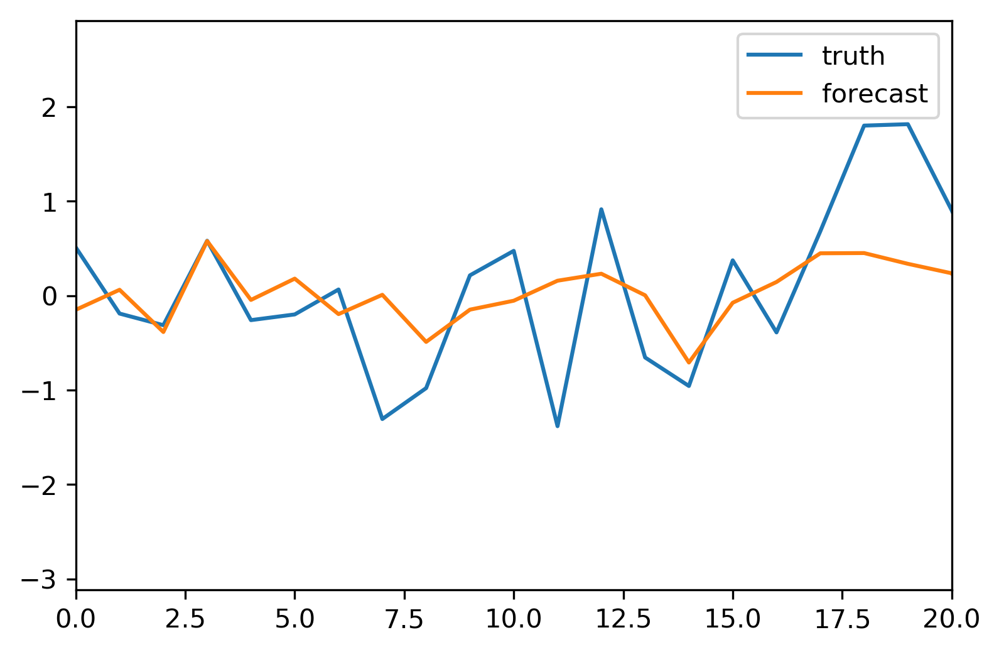

Month 2
Trained using month 2...
Validating against month 2
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


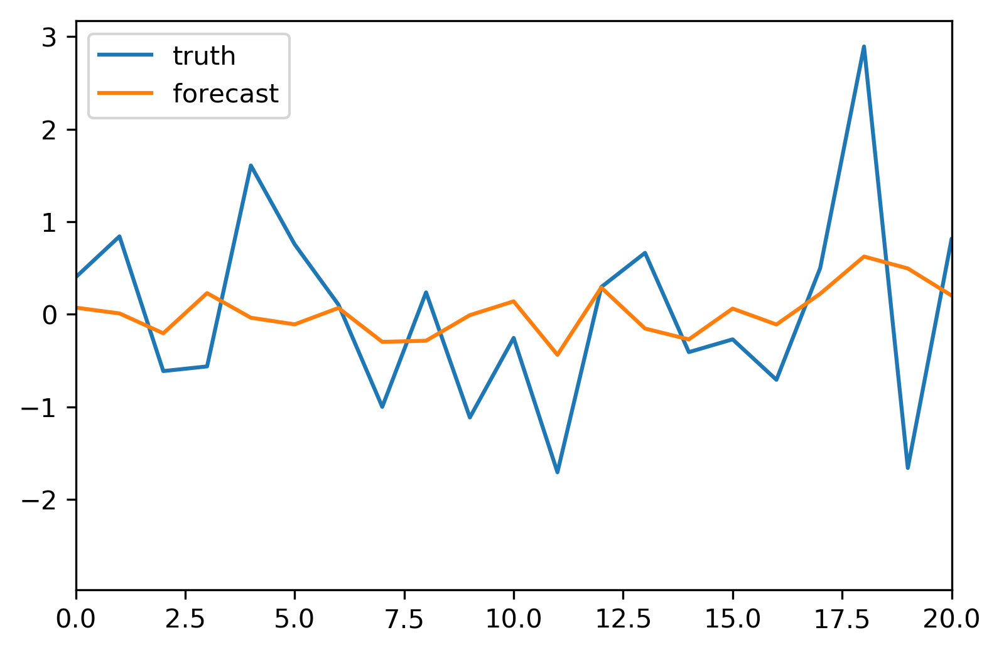

Month 3
Trained using month 3...
Validating against month 3
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


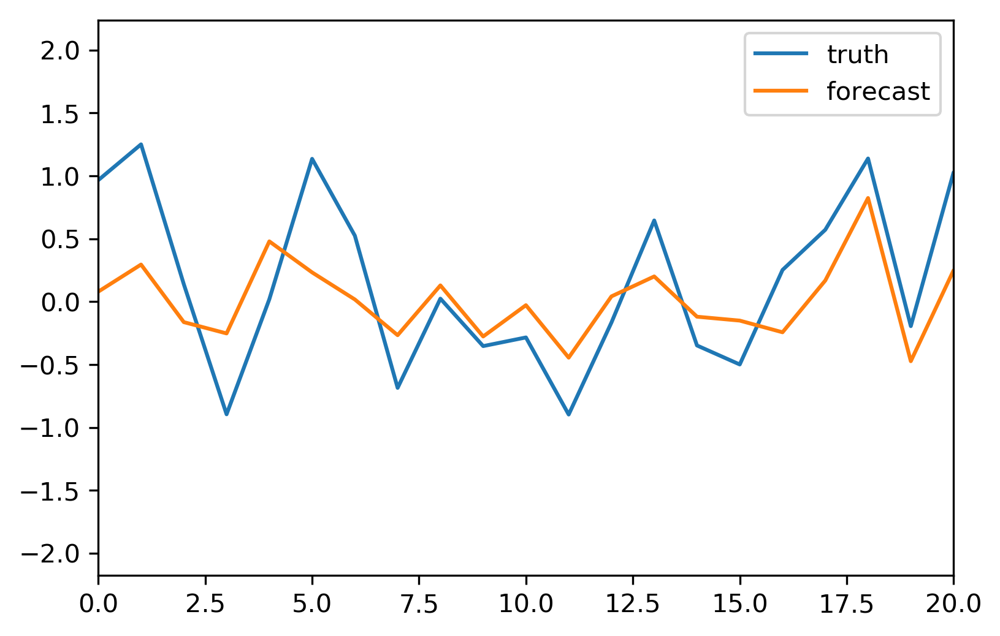

Month 4
Trained using month 4...
Validating against month 4
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


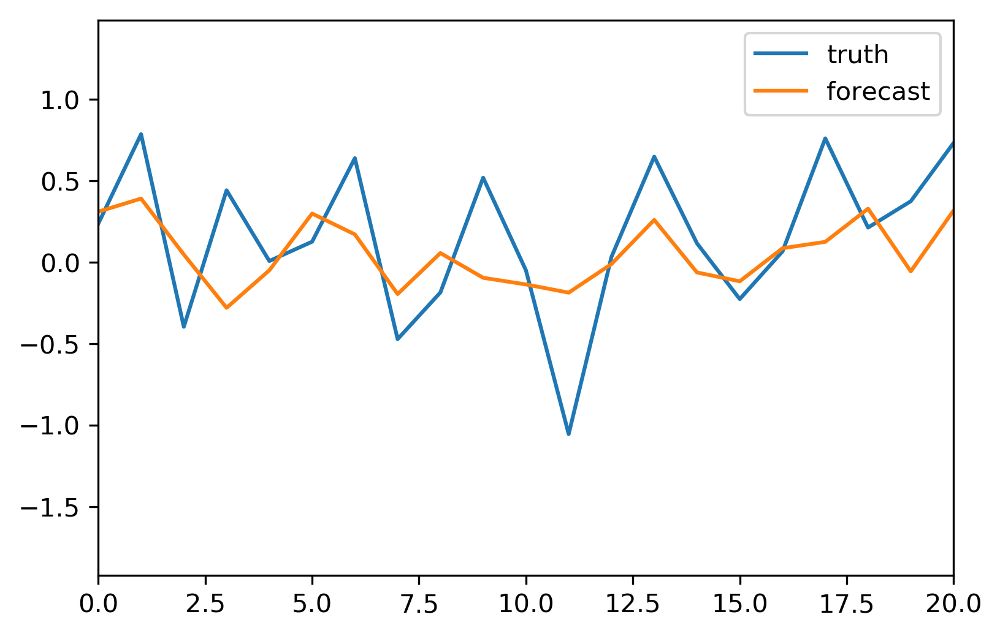

Month 5
Trained using month 5...
Validating against month 5
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


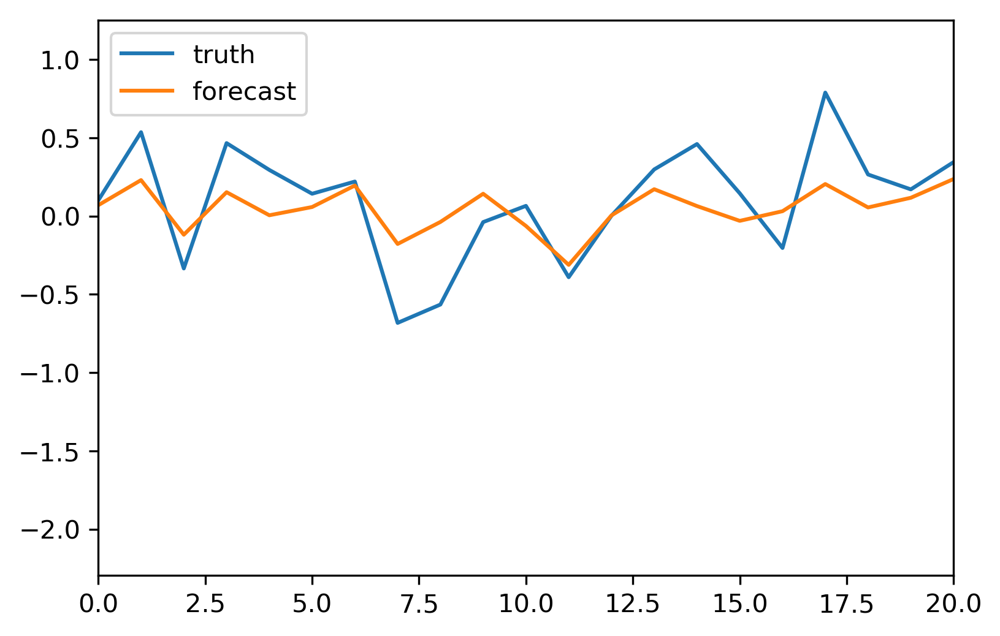

Month 6
Trained using month 6...
Validating against month 6
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


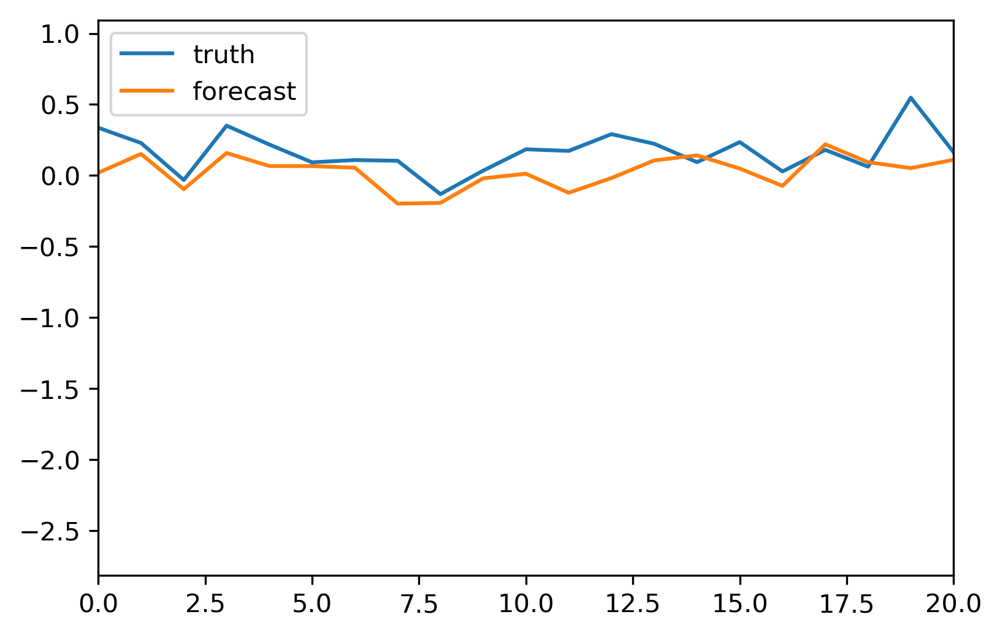

Month 7
Trained using month 7...
Validating against month 7
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


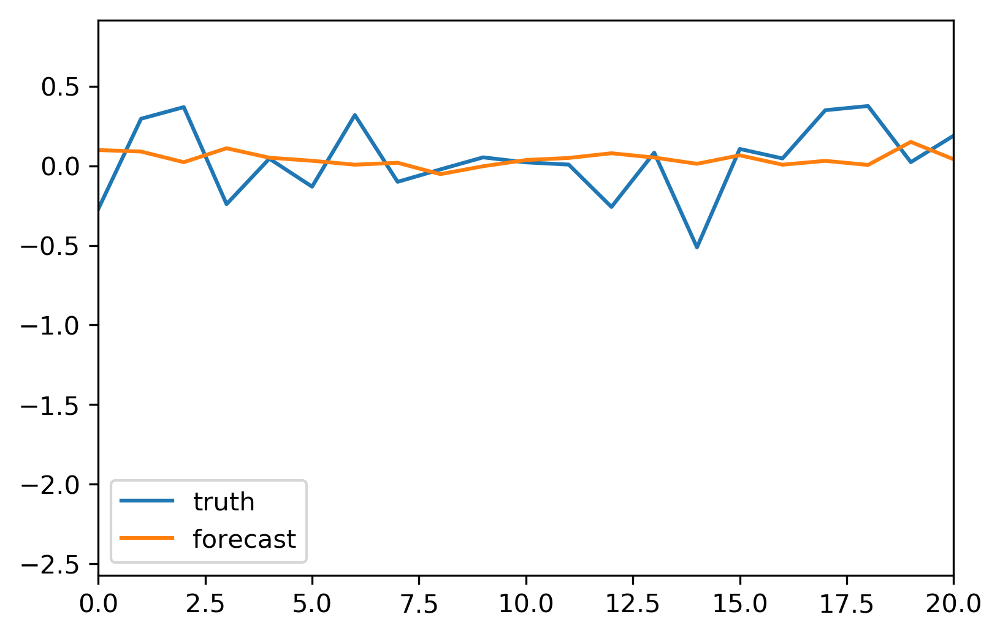

Month 8
Trained using month 8...
Validating against month 8
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


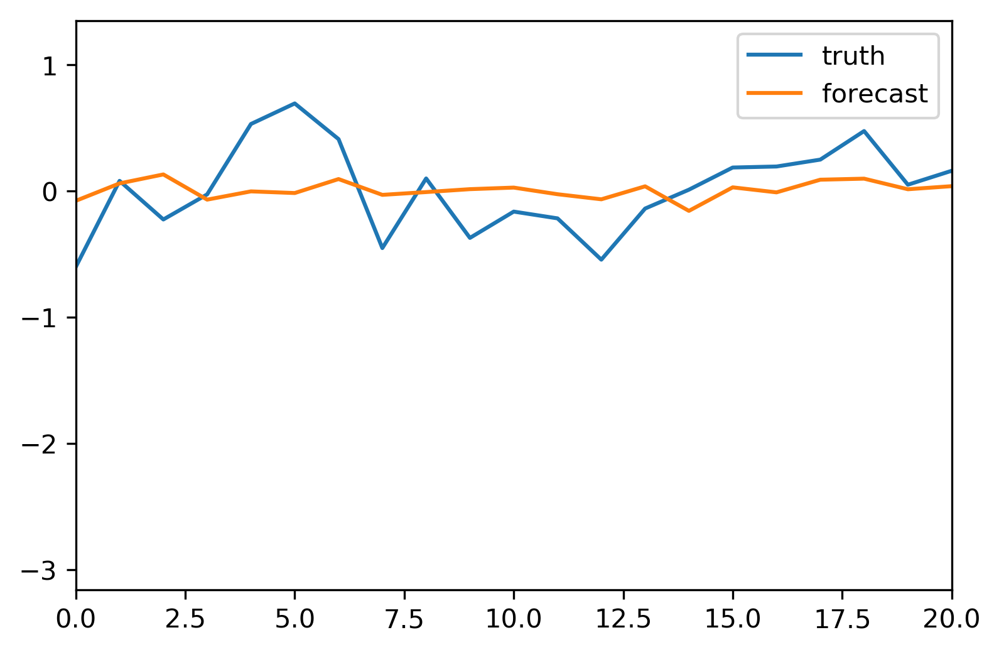

Month 9
Trained using month 9...
Validating against month 9
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


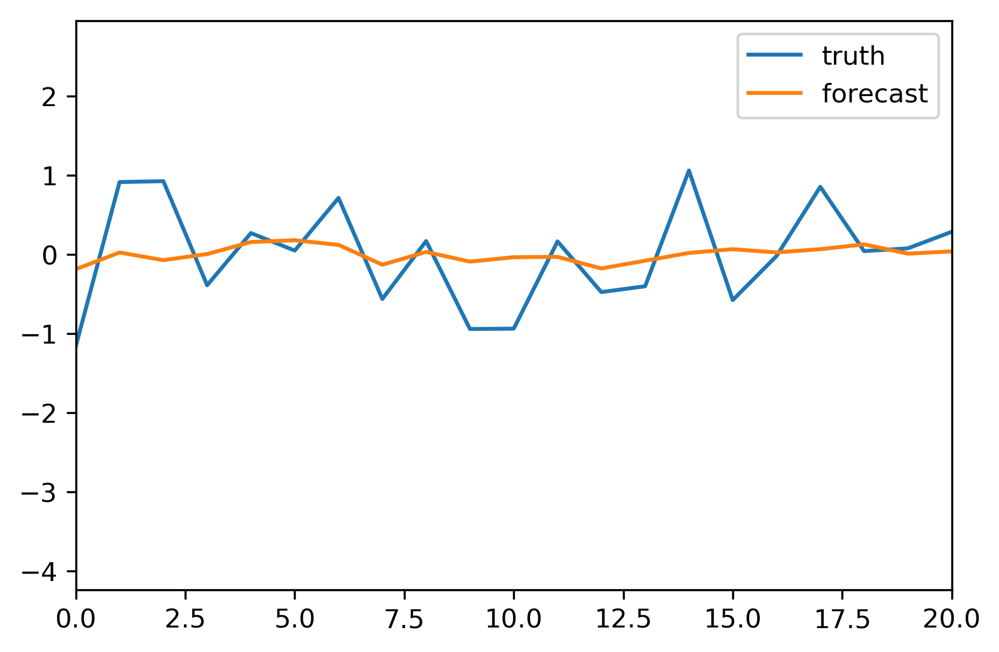

Month 10
Trained using month 10...
Validating against month 10
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


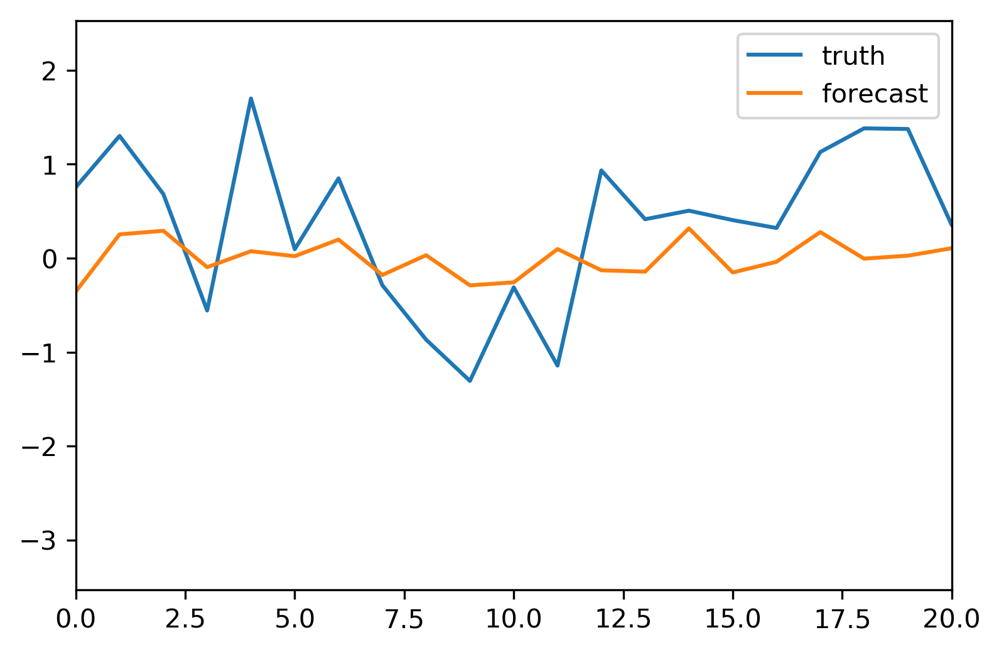

Month 11
Trained using month 11...
Validating against month 11
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


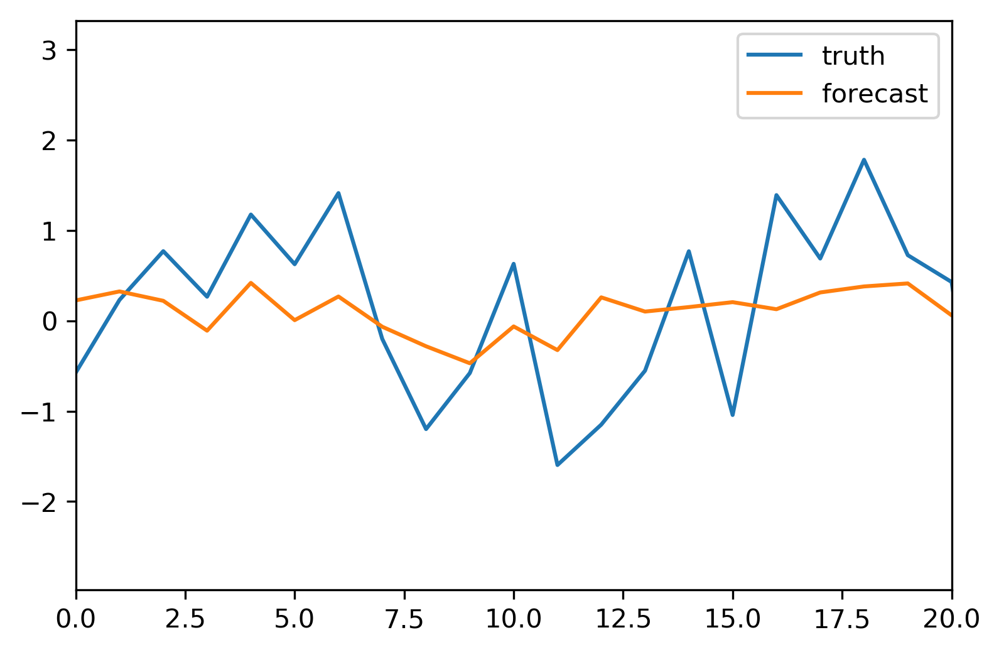

tecut = 1001, tscut = 801.0
Loading from psl
Loading from a/LME/LIMs/psl_sfc_Amon_CESM_LMEallforc_002_085001-200512.nc
time dimension: 1651 - 1850
detrending...
Working on month...0
Working on month...1
Working on month...2
Working on month...3
Working on month...4
Working on month...5
Working on month...6
Working on month...7
Working on month...8
Working on month...9
Working on month...10
Working on month...11
latitude cutoff detected: 50
-----------------------------------------------------
completed in 23.159863710403442 seconds
-----------------------------------------------------
Month 0
Trained using month 0...
Validating against month 0
Truth_anom shape: (3168, 199)
Forecast_anom shape: (3168, 199)
changing cellarea units from m^2 to km^2


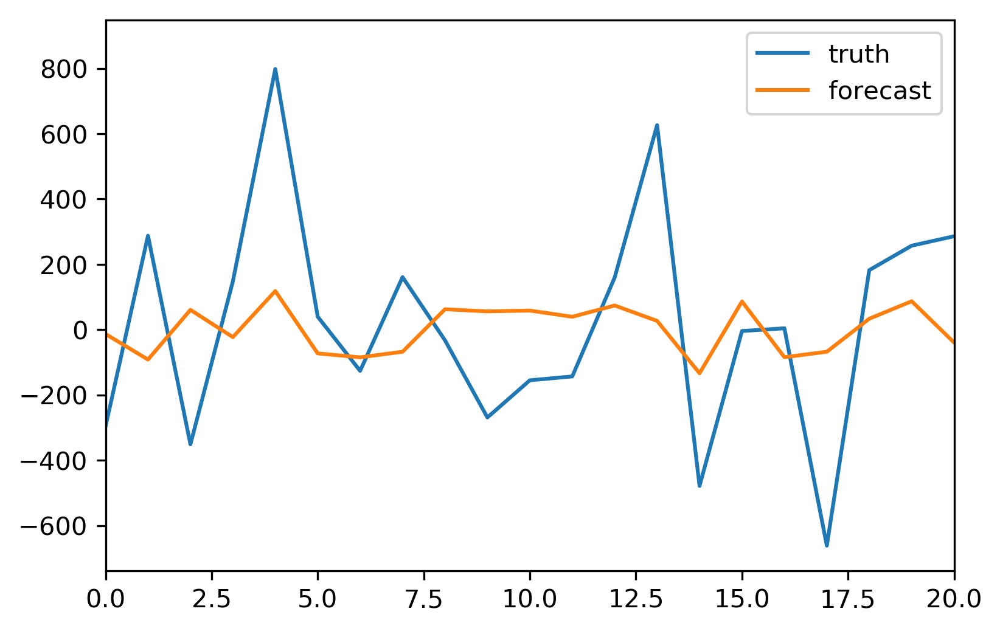

Month 1
Trained using month 1...
Validating against month 1
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


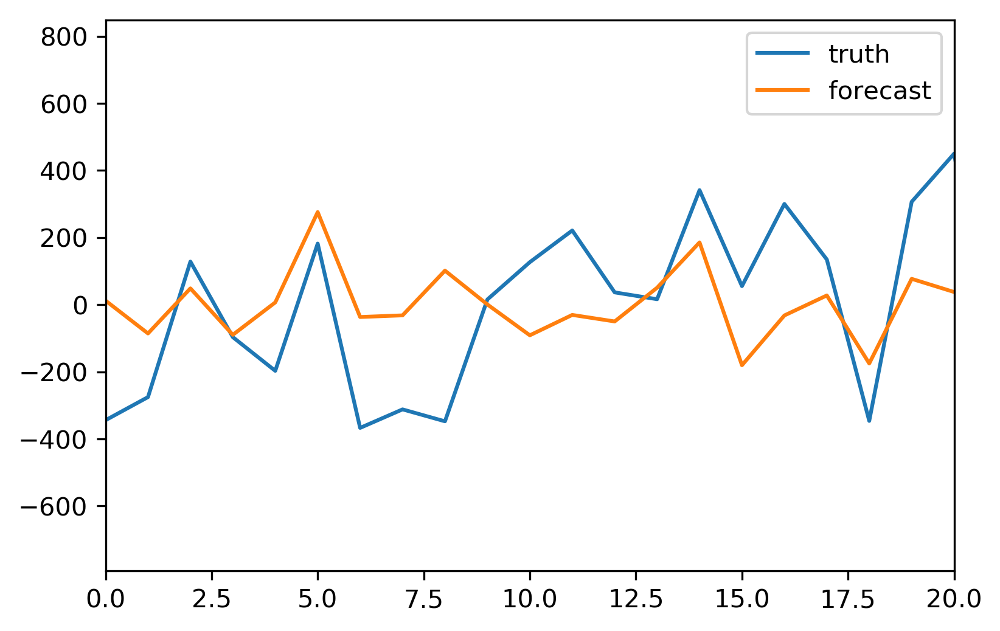

Month 2
Trained using month 2...
Validating against month 2
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


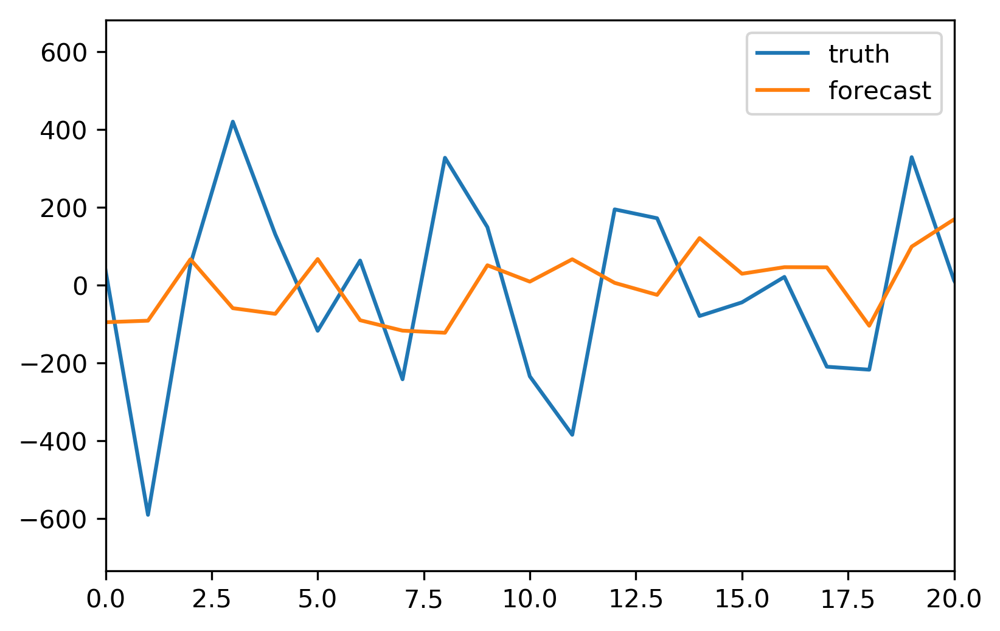

Month 3
Trained using month 3...
Validating against month 3
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


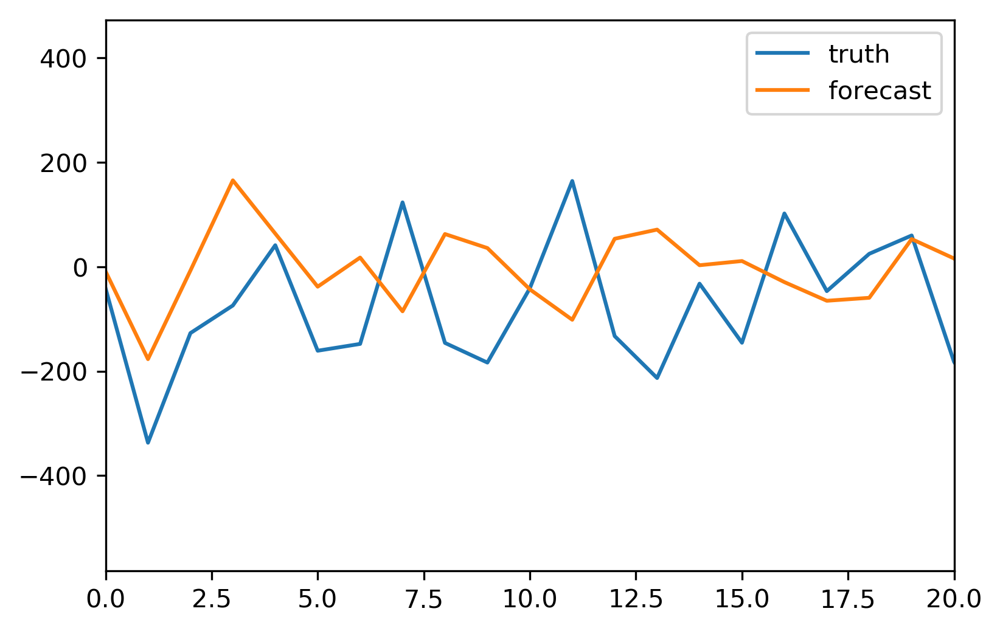

Month 4
Trained using month 4...
Validating against month 4
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


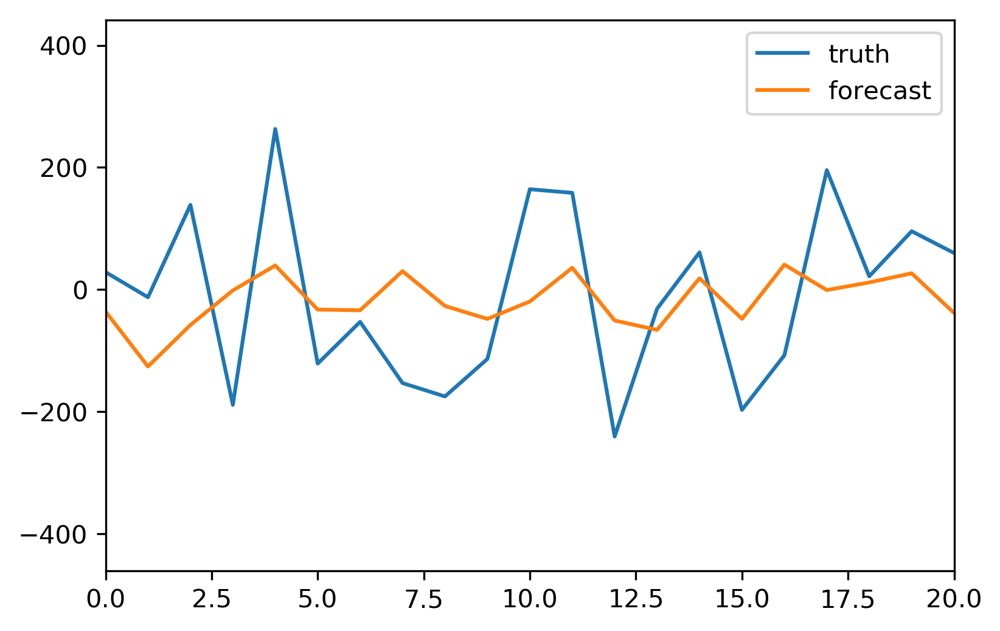

Month 5
Trained using month 5...
Validating against month 5
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


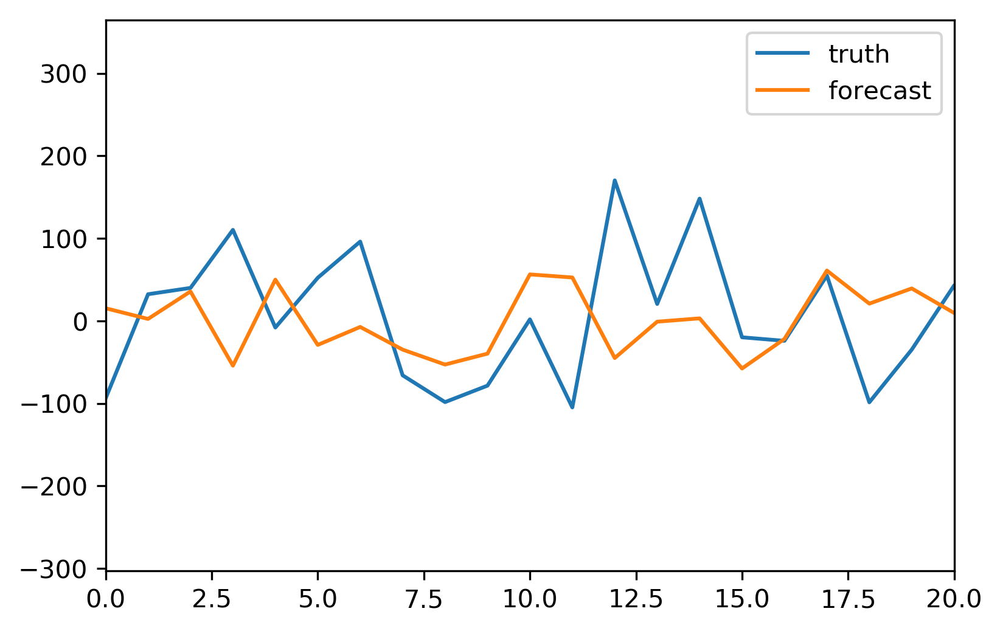

Month 6
Trained using month 6...
Validating against month 6
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


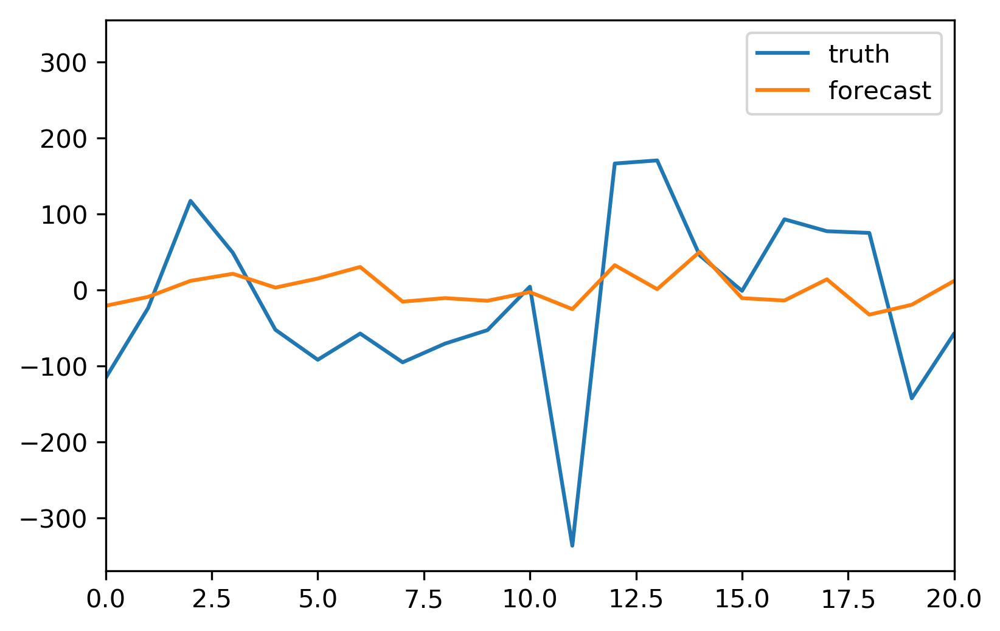

Month 7
Trained using month 7...
Validating against month 7
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


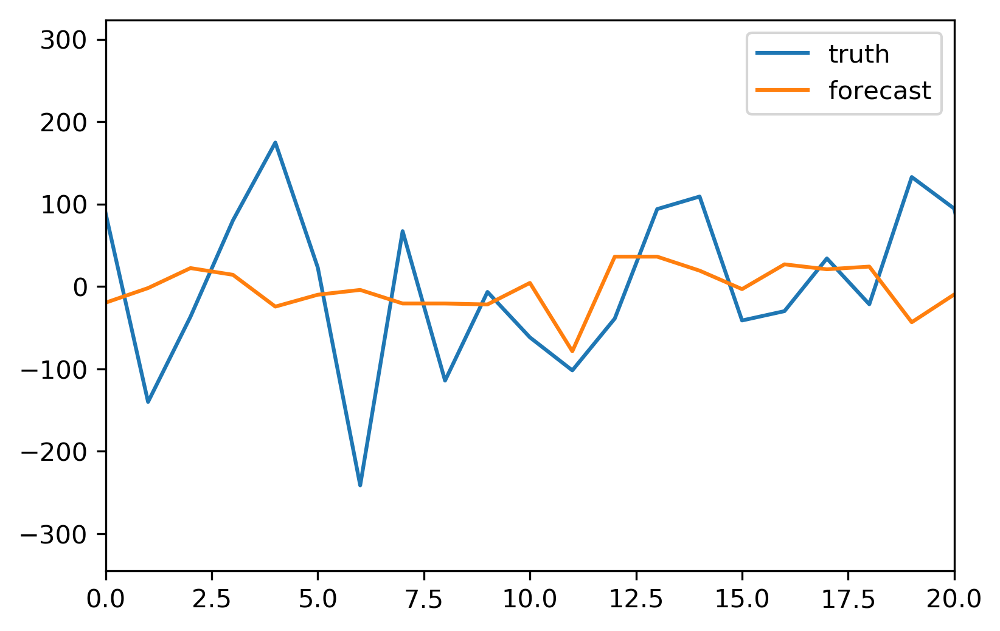

Month 8
Trained using month 8...
Validating against month 8
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


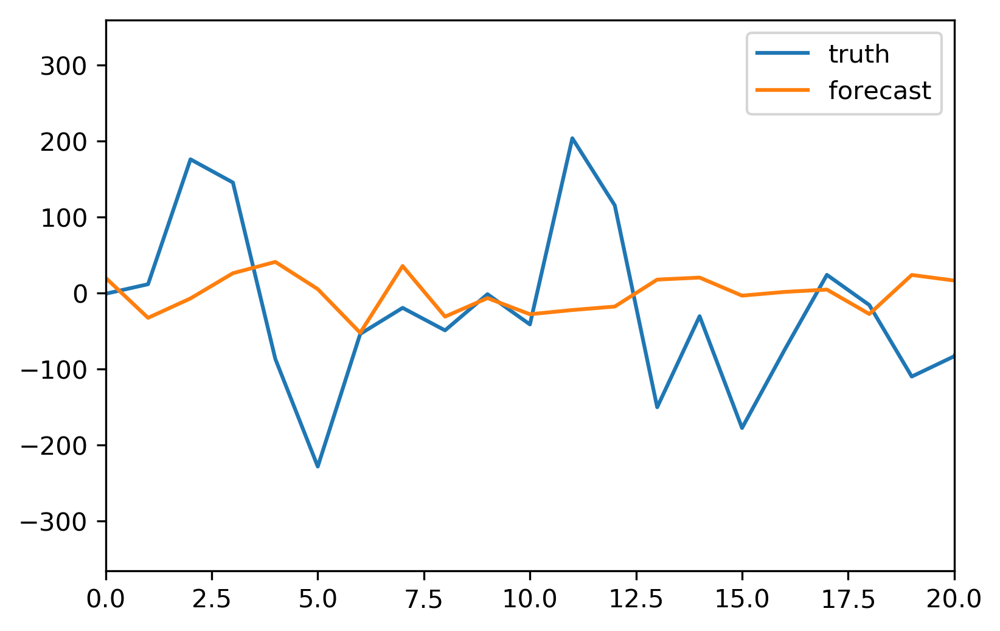

Month 9
Trained using month 9...
Validating against month 9
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


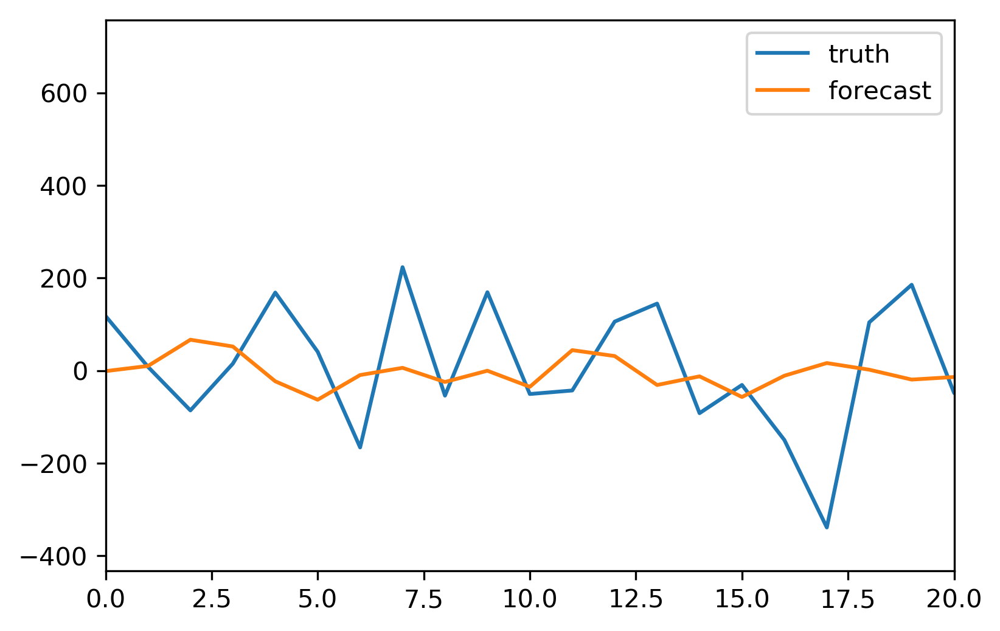

Month 10
Trained using month 10...
Validating against month 10
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


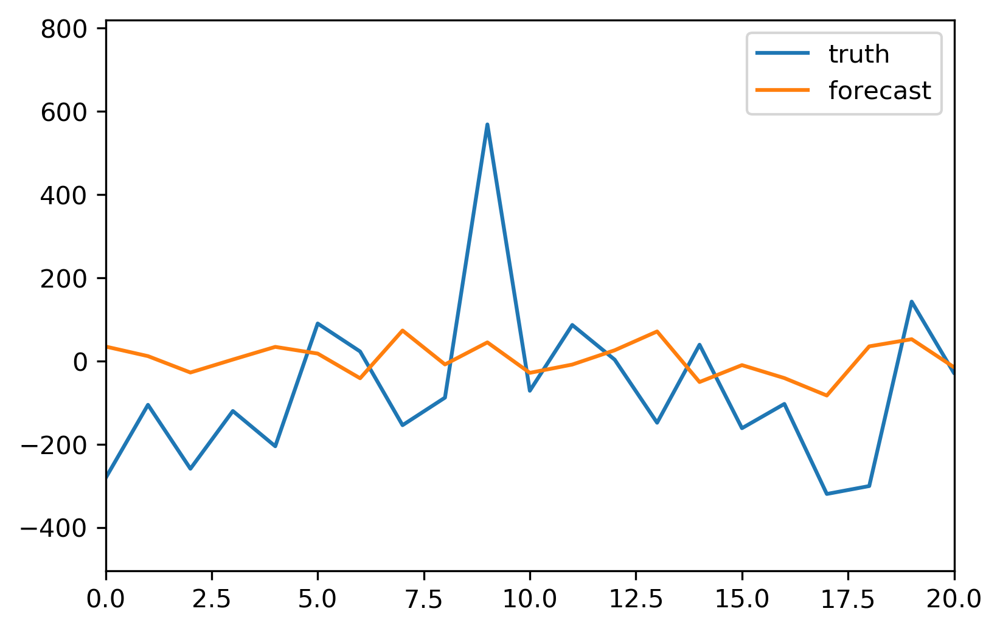

Month 11
Trained using month 11...
Validating against month 11
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


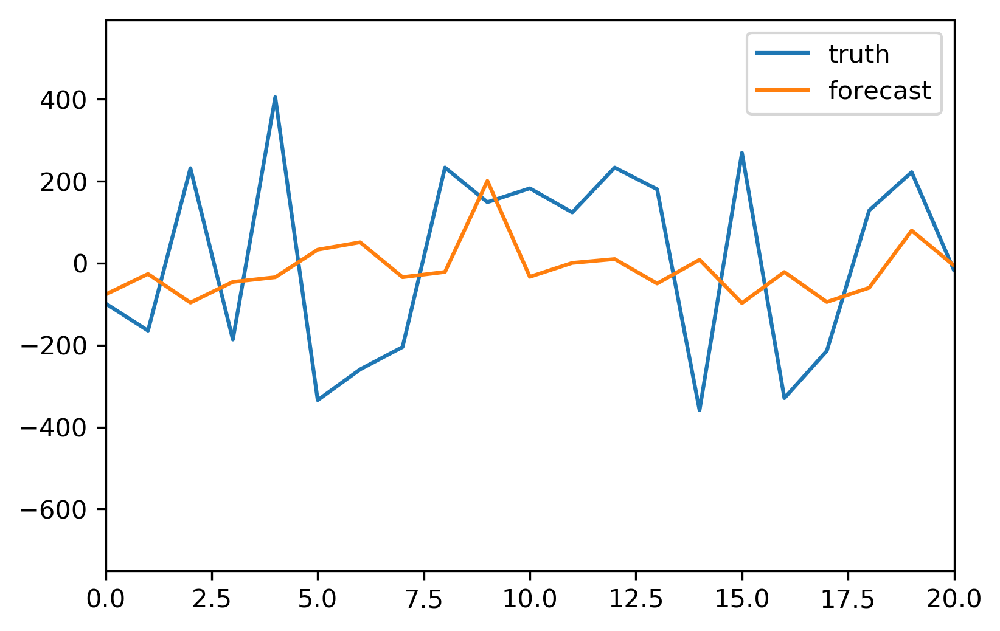

tecut = 1001, tscut = 801.0
Loading from zg
Loading from LME/LIMs/zg_500hPa_Amon_CESM_LMEallforc_002_085001-200512.nc
time dimension: 1651 - 1850
detrending...
Working on month...0
Working on month...1
Working on month...2
Working on month...3
Working on month...4
Working on month...5
Working on month...6
Working on month...7
Working on month...8
Working on month...9
Working on month...10
Working on month...11
latitude cutoff detected: 50
-----------------------------------------------------
completed in 22.397204399108887 seconds
-----------------------------------------------------
Month 0
Trained using month 0...
Validating against month 0
Truth_anom shape: (3168, 199)
Forecast_anom shape: (3168, 199)
changing cellarea units from m^2 to km^2


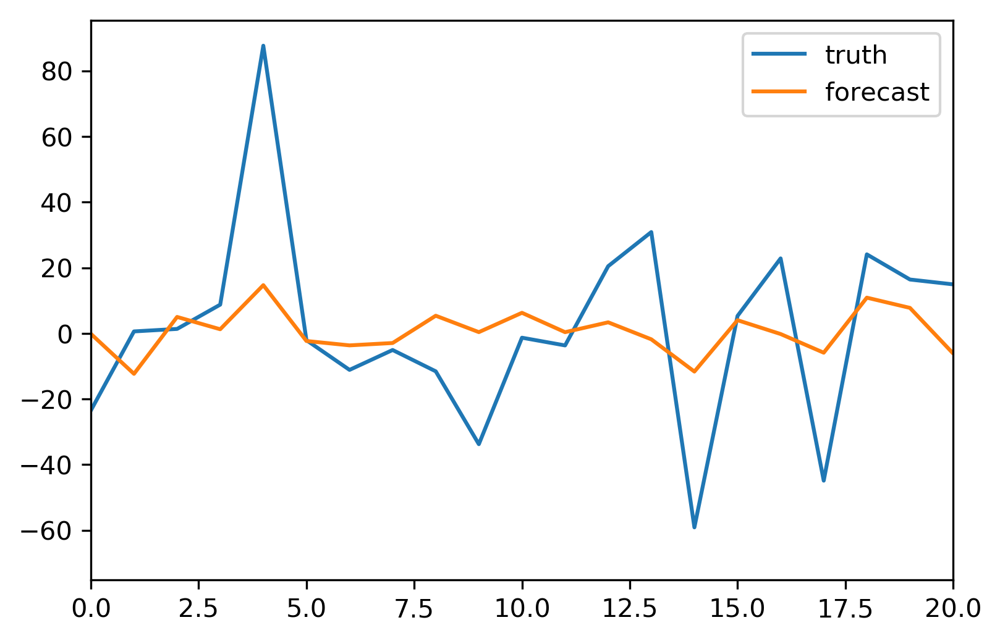

Month 1
Trained using month 1...
Validating against month 1
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


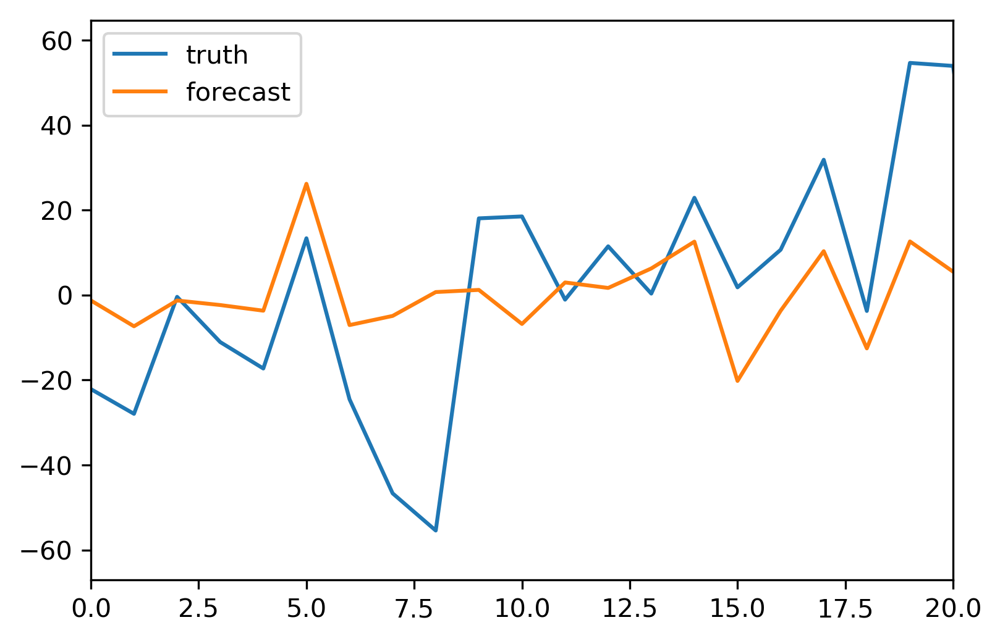

Month 2
Trained using month 2...
Validating against month 2
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


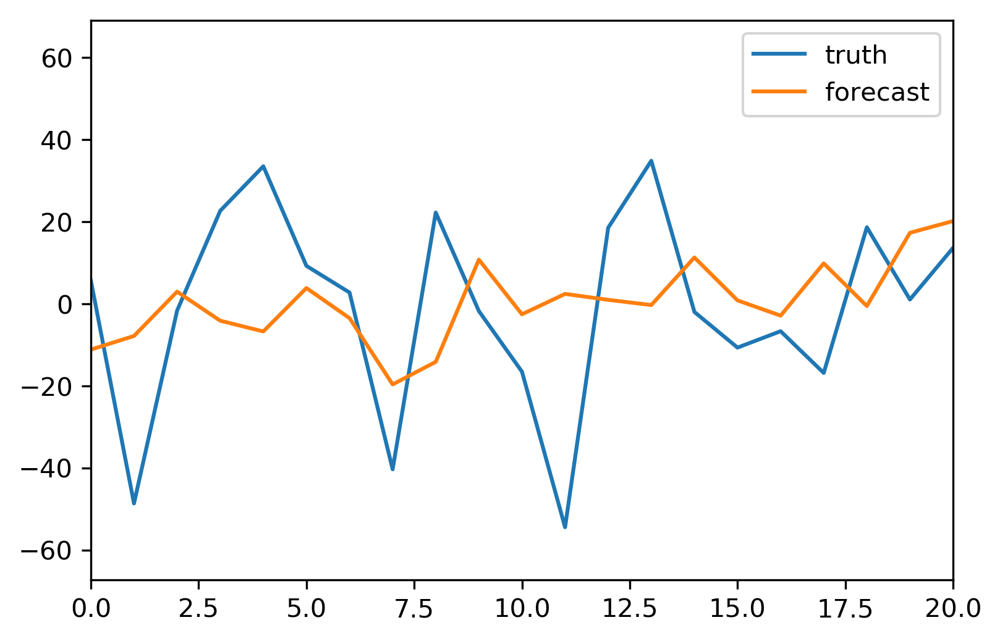

Month 3
Trained using month 3...
Validating against month 3
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


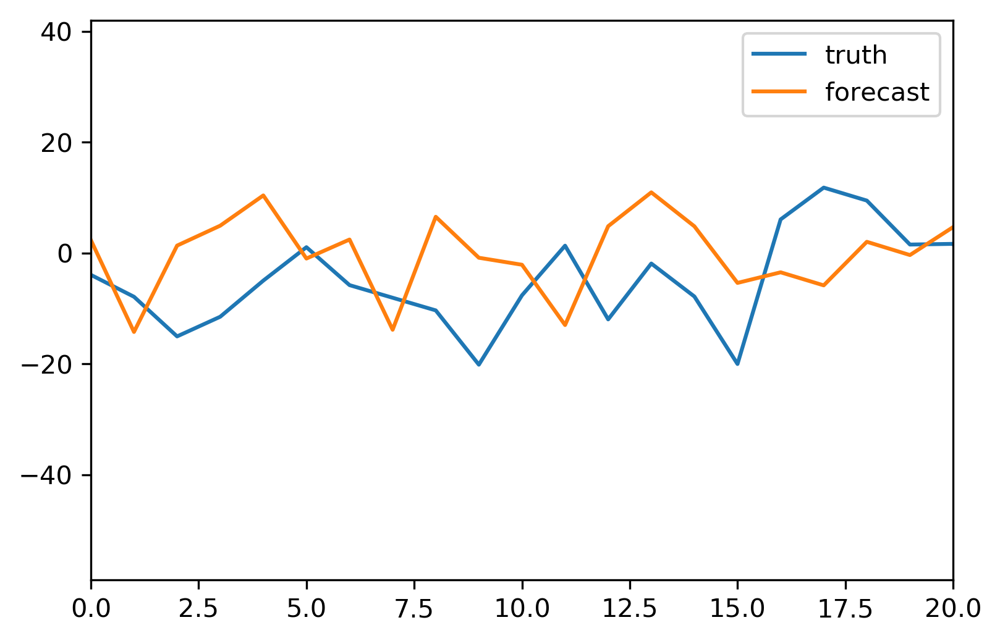

Month 4
Trained using month 4...
Validating against month 4
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


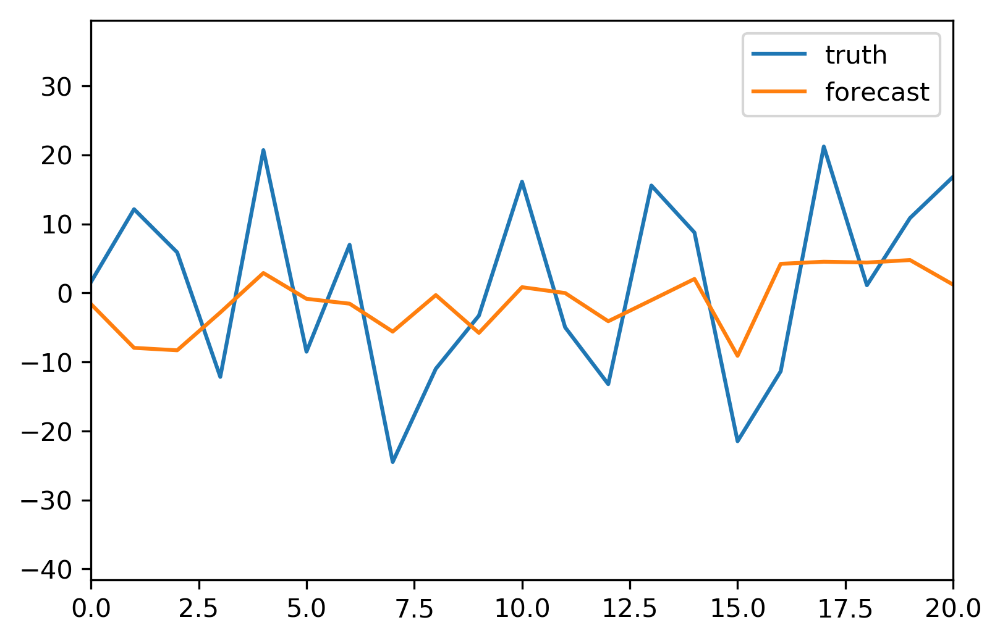

Month 5
Trained using month 5...
Validating against month 5
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


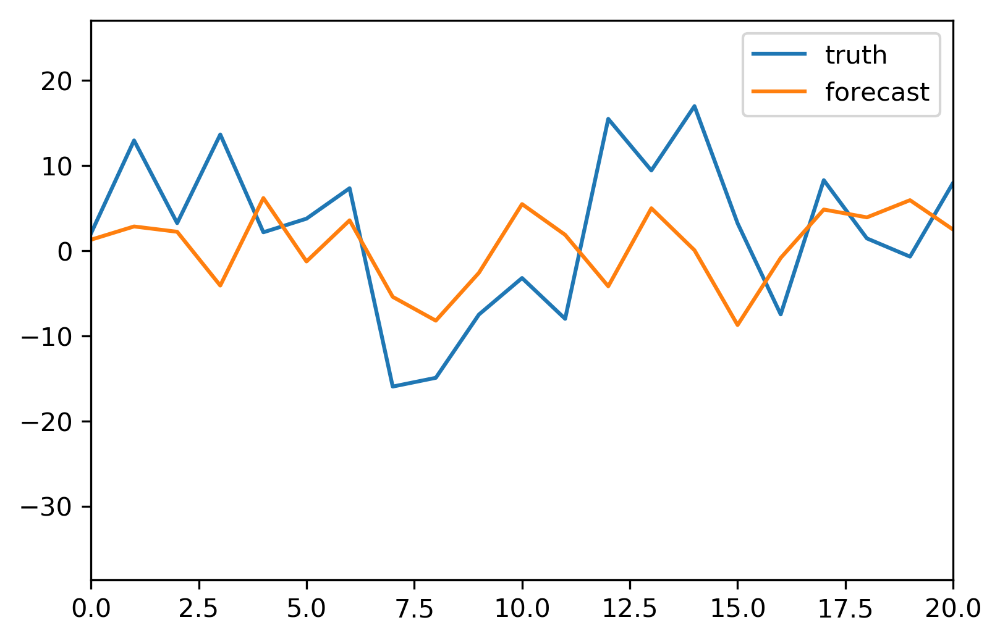

Month 6
Trained using month 6...
Validating against month 6
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


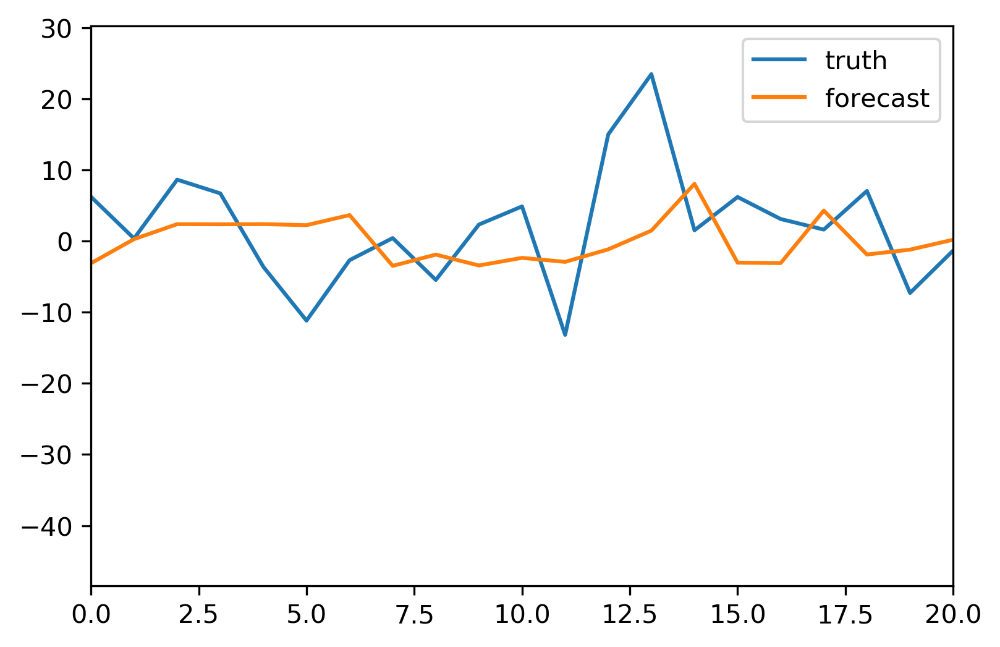

Month 7
Trained using month 7...
Validating against month 7
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


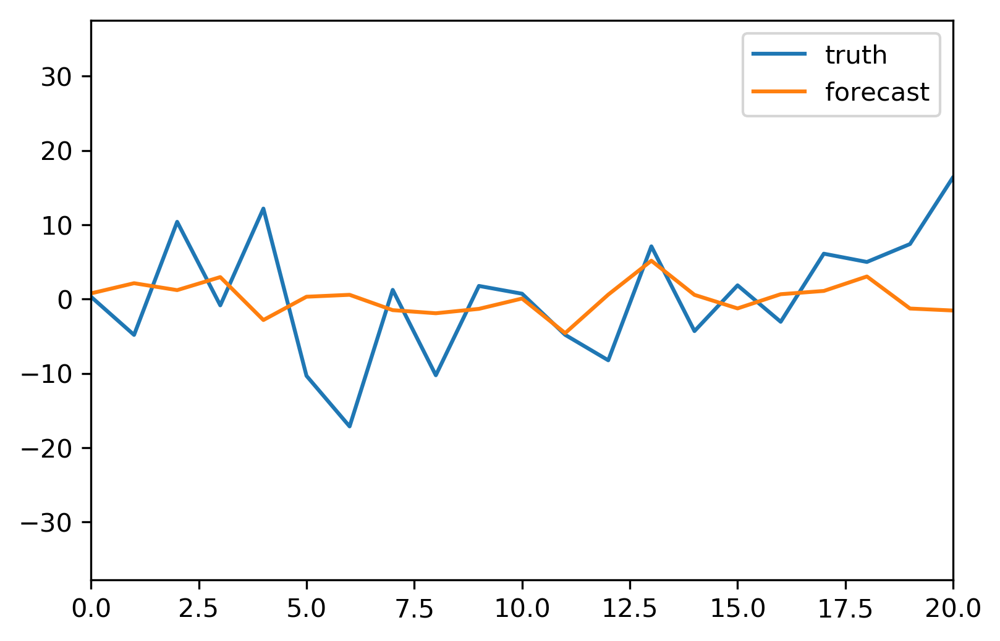

Month 8
Trained using month 8...
Validating against month 8
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


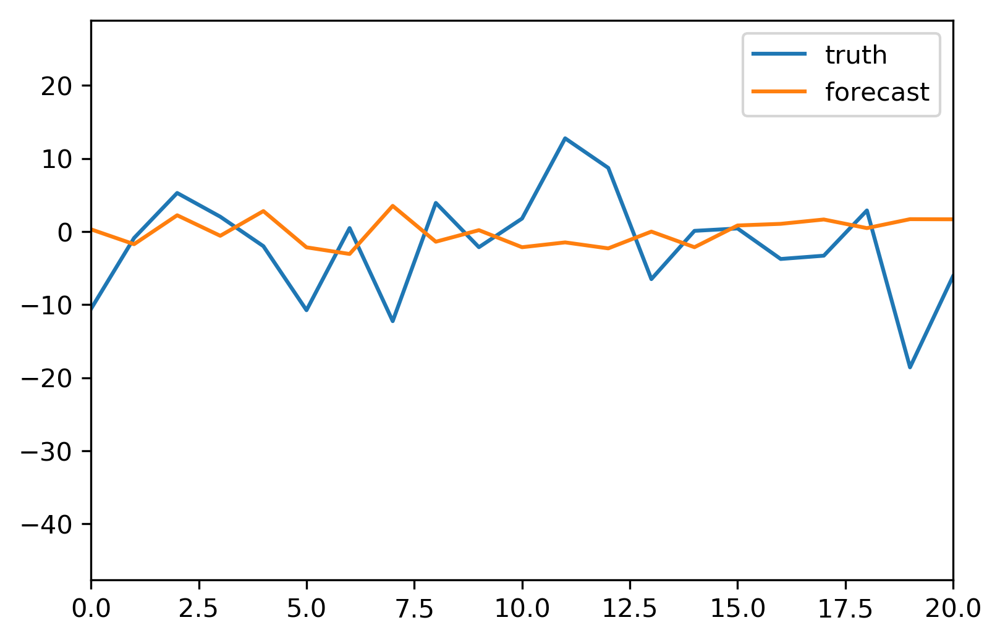

Month 9
Trained using month 9...
Validating against month 9
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


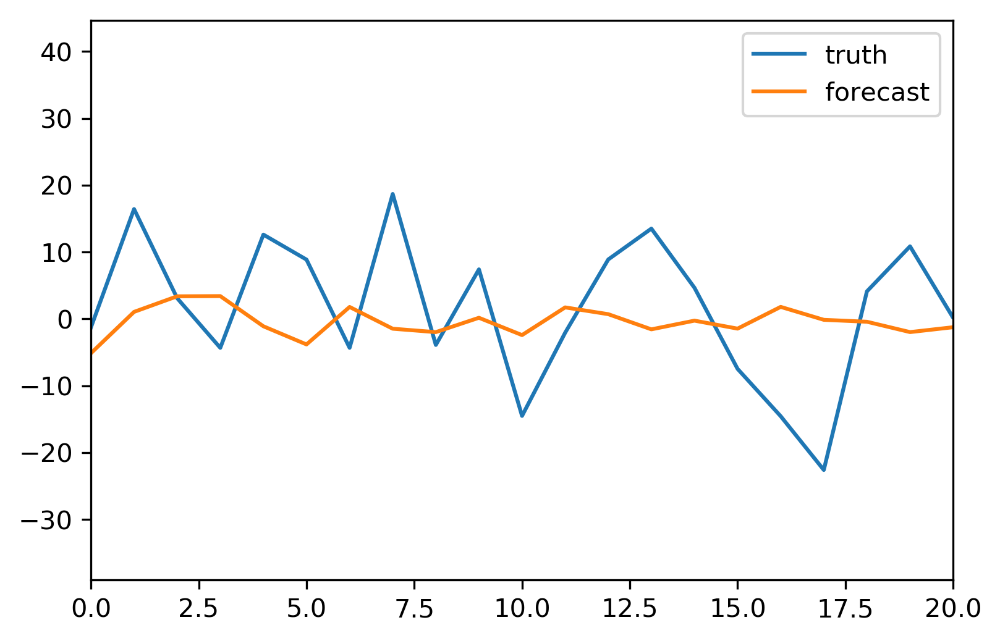

Month 10
Trained using month 10...
Validating against month 10
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


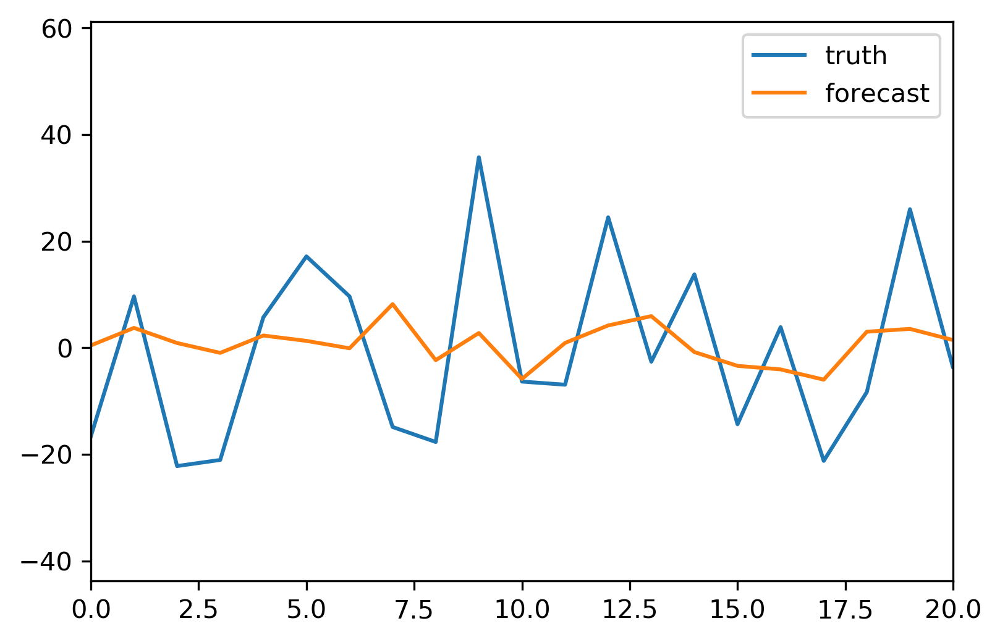

Month 11
Trained using month 11...
Validating against month 11
Truth_anom shape: (3168, 200)
Forecast_anom shape: (3168, 200)
changing cellarea units from m^2 to km^2


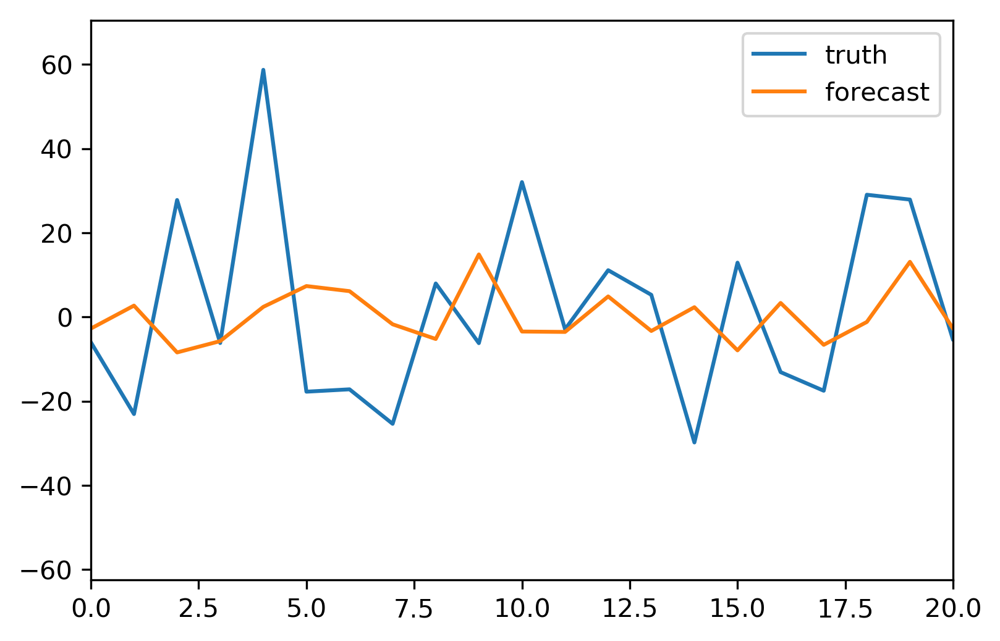

tecut = 1001, tscut = 801.0
Loading from tos
Loading from a/LME/LIMs/tos_sfc_Omon_CESM_LMEallforc_002_085001-200512.nc
time dimension: 1651 - 1850
detrending...
Working on month...0
Found with nans (not in satellite), going to fill with zeros...
Working on month...1
Found with nans (not in satellite), going to fill with zeros...
Working on month...2
Found with nans (not in satellite), going to fill with zeros...
Working on month...3
Found with nans (not in satellite), going to fill with zeros...
Working on month...4
Found with nans (not in satellite), going to fill with zeros...
Working on month...5
Found with nans (not in satellite), going to fill with zeros...
Working on month...6
Found with nans (not in satellite), going to fill with zeros...
Working on month...7
Found with nans (not in satellite), going to fill with zeros...
Working on month...8
Found with nans (not in satellite), going to fill with zeros...
Working on month...9
Found with nans (not in satellite), going to fill wit

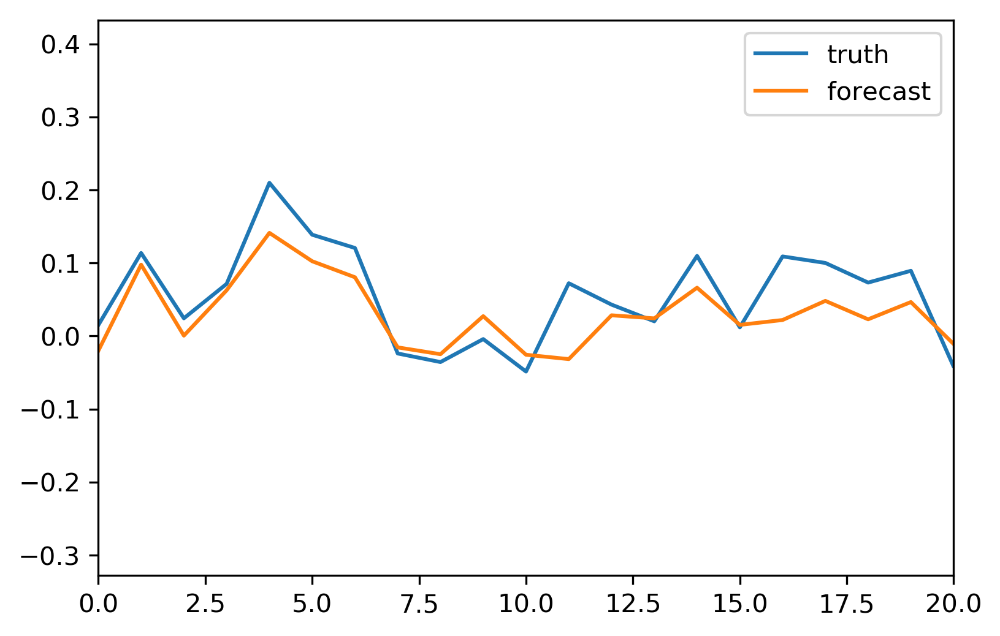

Month 1
Trained using month 1...
Validating against month 1
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


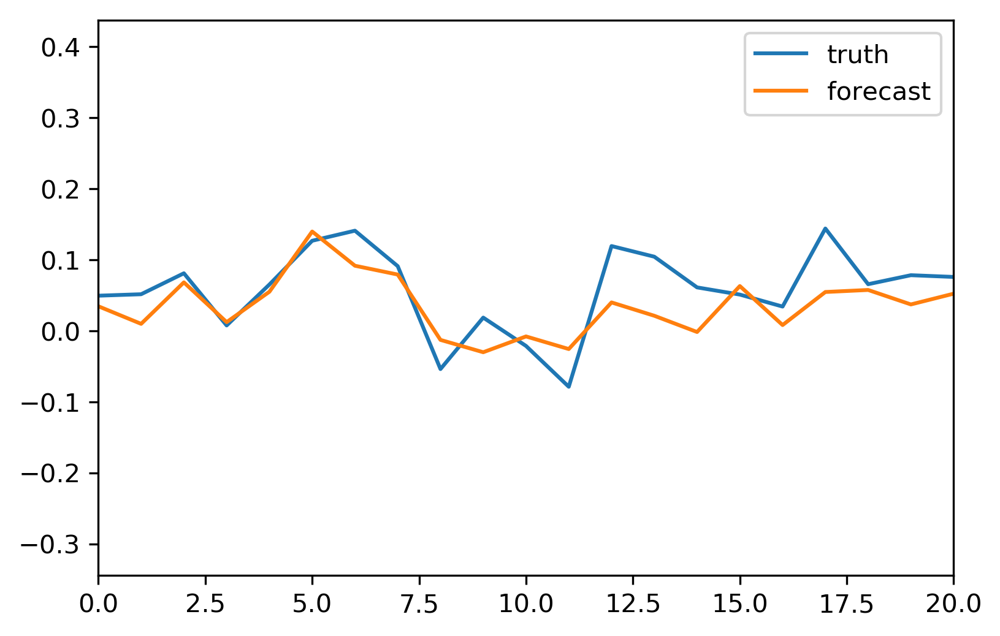

Month 2
Trained using month 2...
Validating against month 2
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


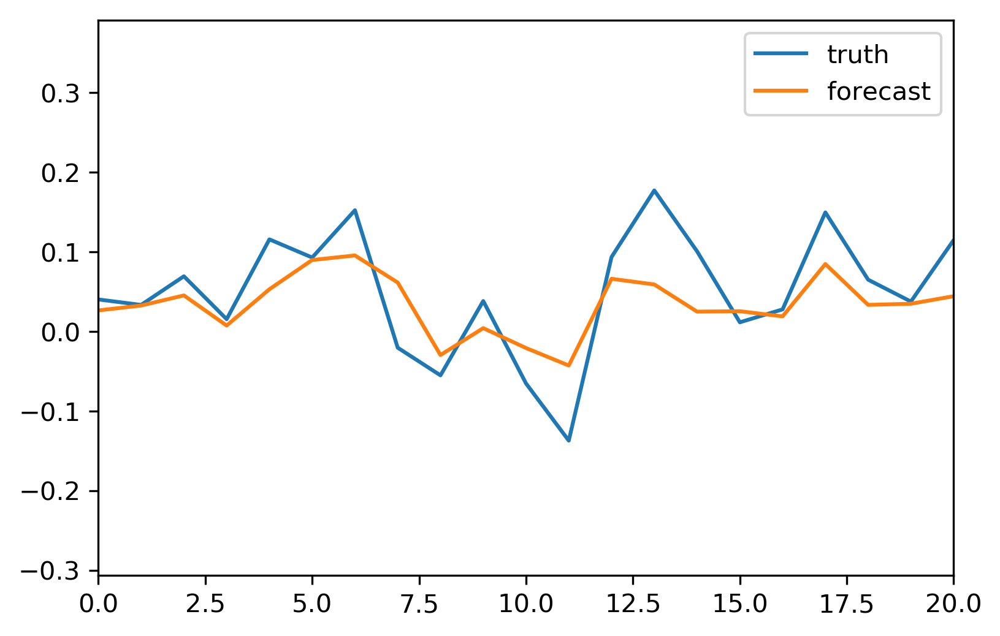

Month 3
Trained using month 3...
Validating against month 3
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


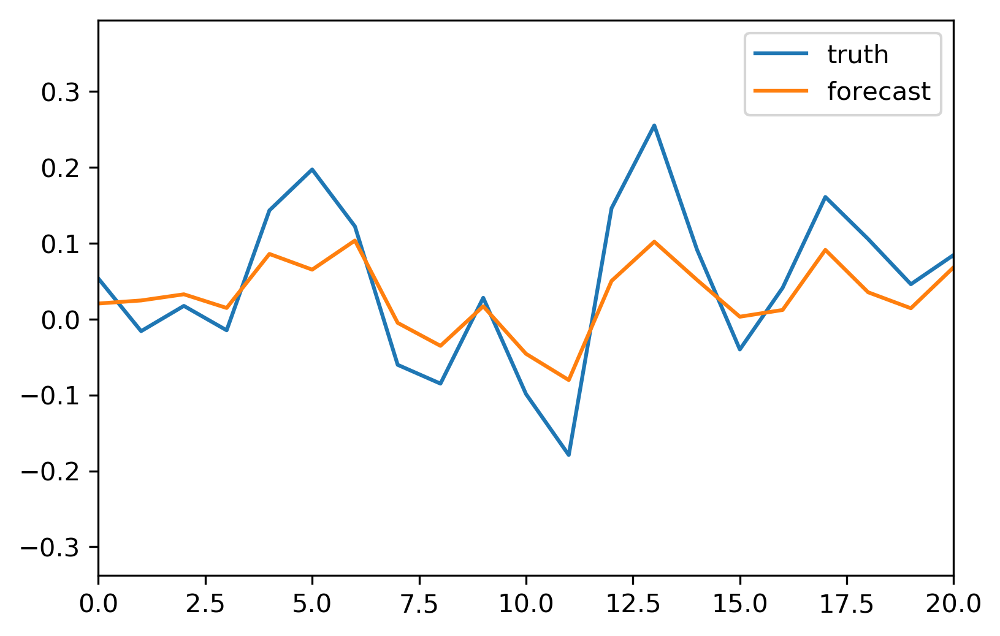

Month 4
Trained using month 4...
Validating against month 4
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


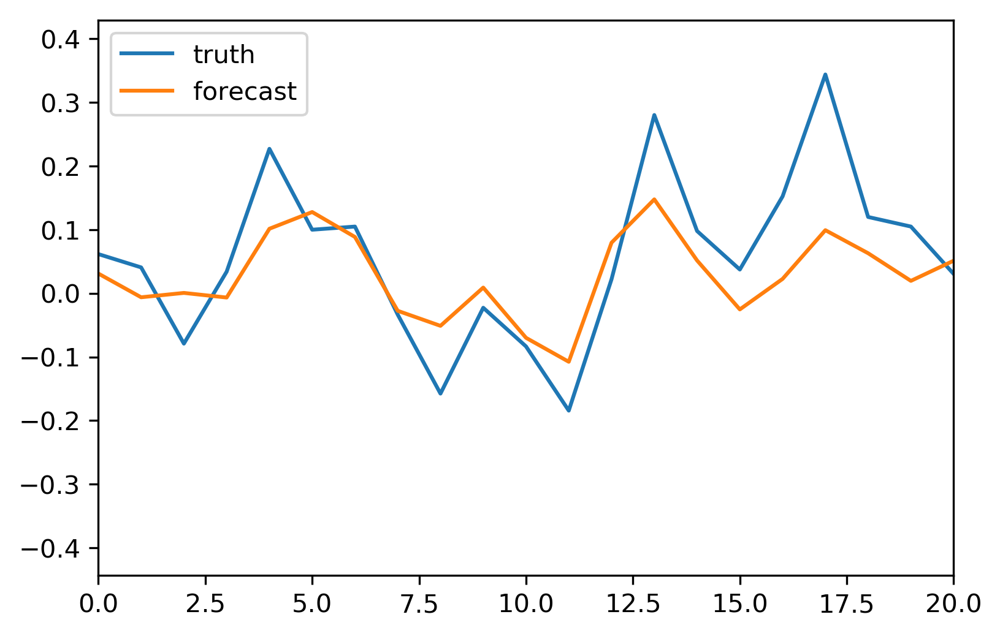

Month 5
Trained using month 5...
Validating against month 5
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


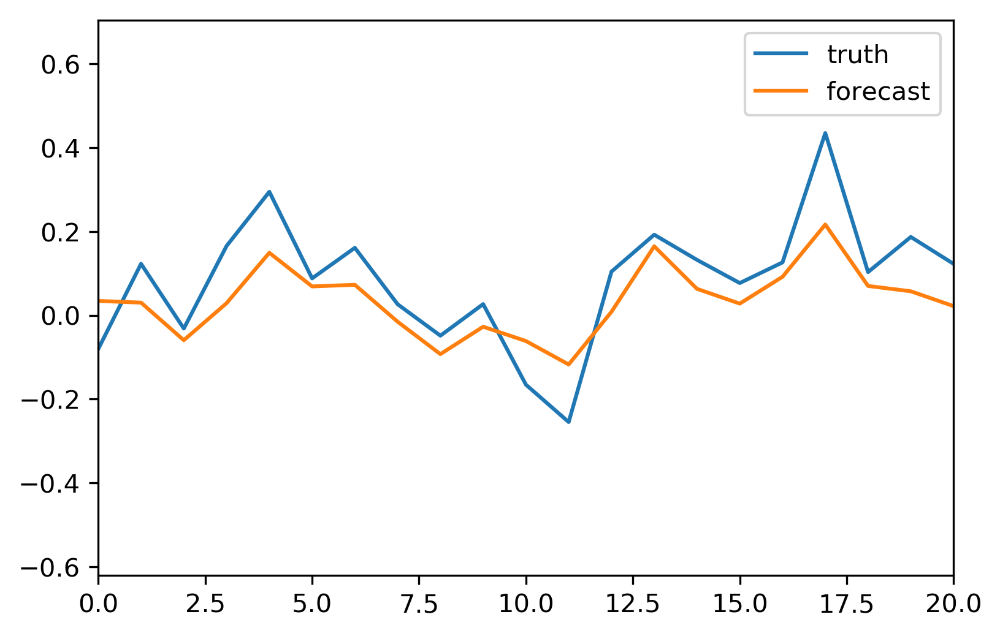

Month 6
Trained using month 6...
Validating against month 6
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


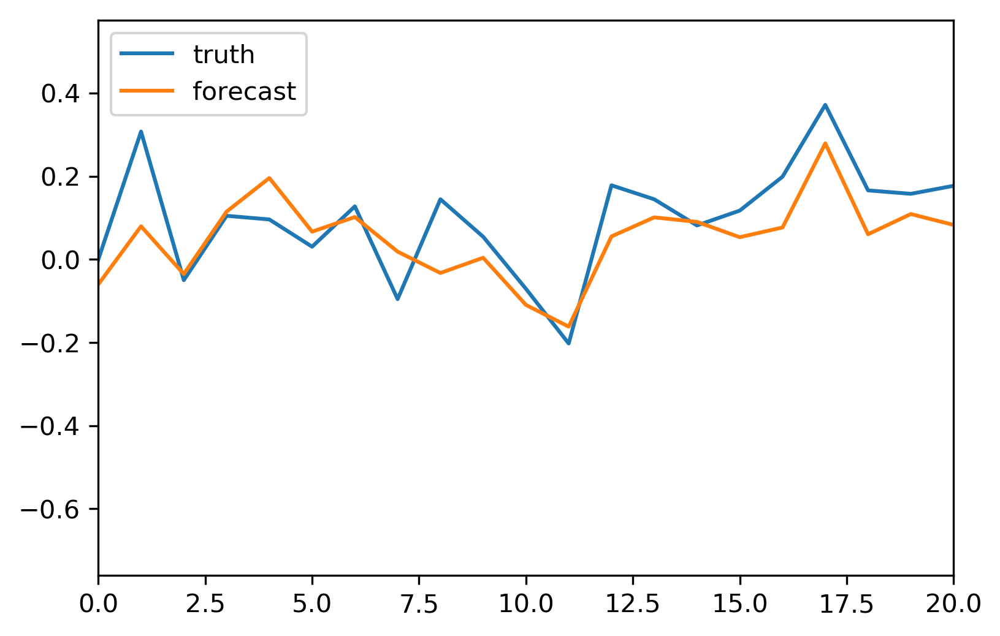

Month 7
Trained using month 7...
Validating against month 7
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


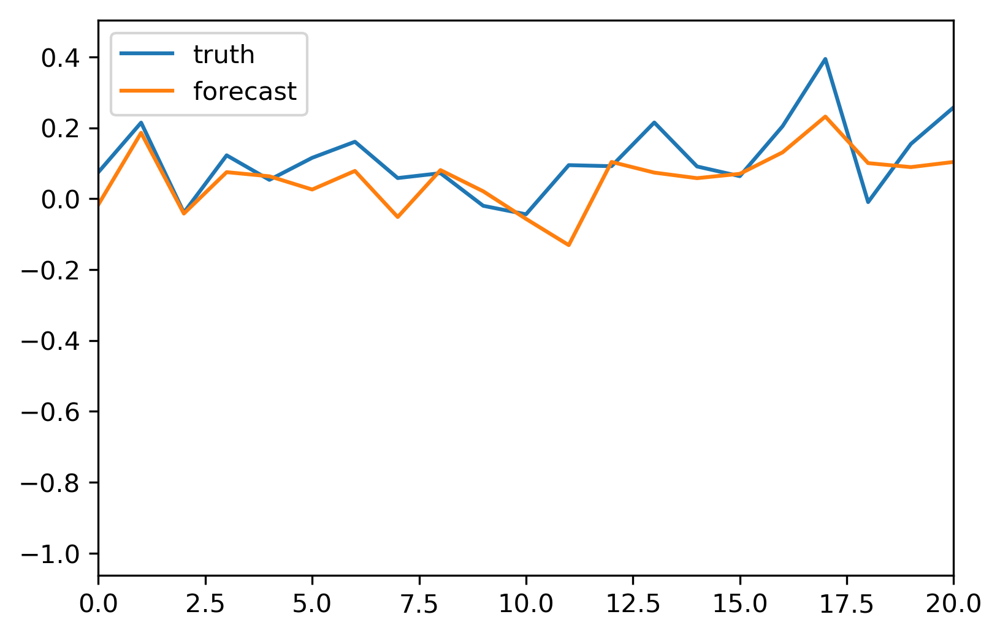

Month 8
Trained using month 8...
Validating against month 8
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


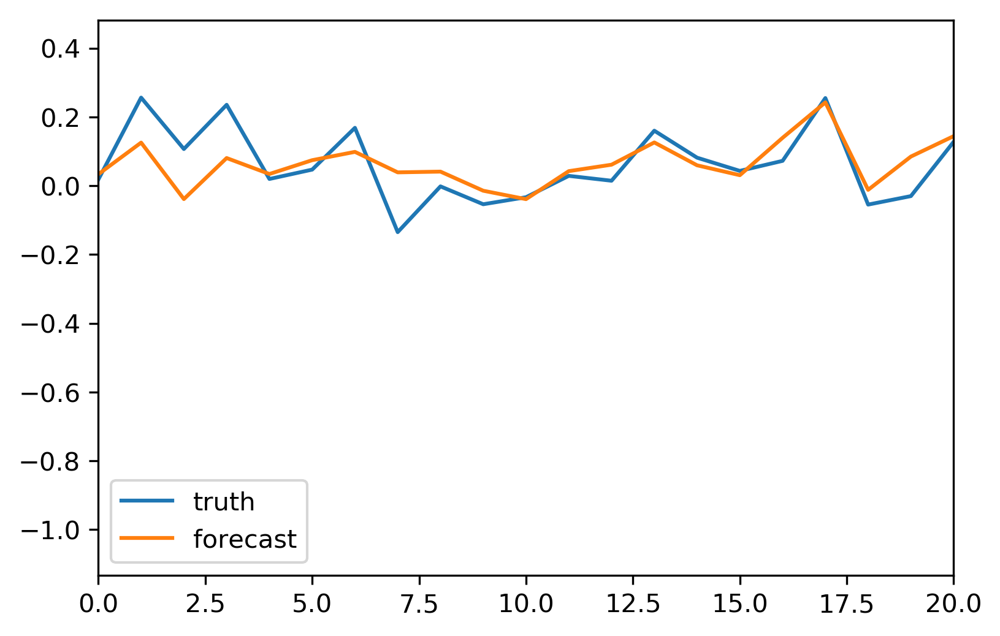

Month 9
Trained using month 9...
Validating against month 9
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


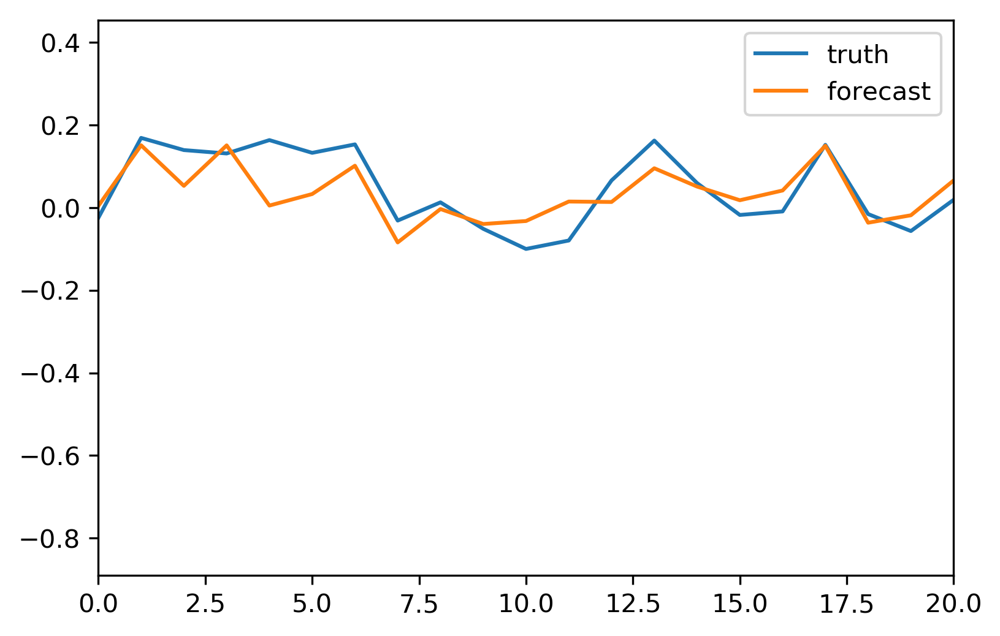

Month 10
Trained using month 10...
Validating against month 10
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


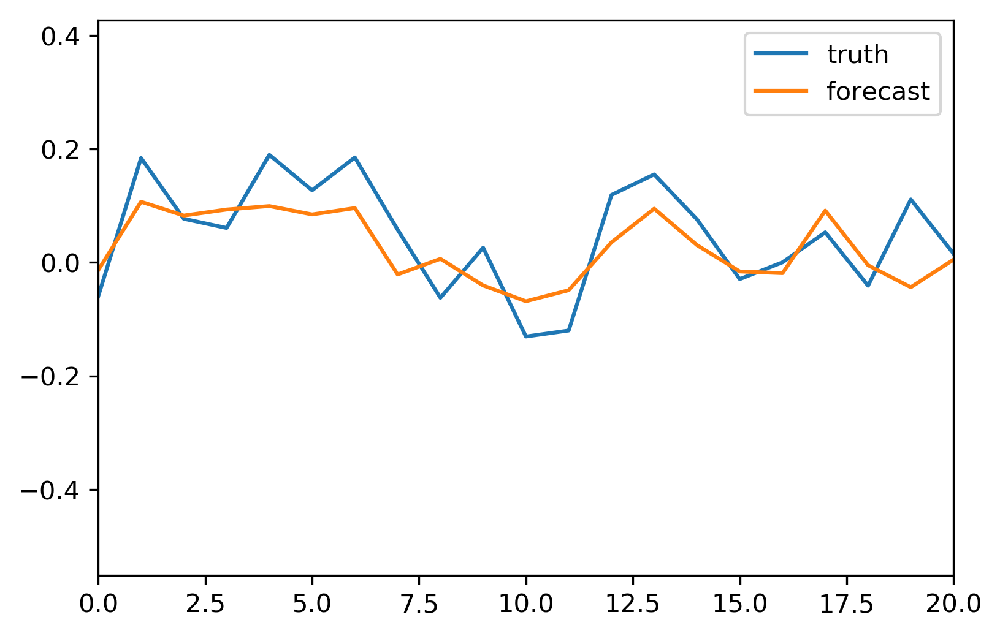

Month 11
Trained using month 11...
Validating against month 11
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


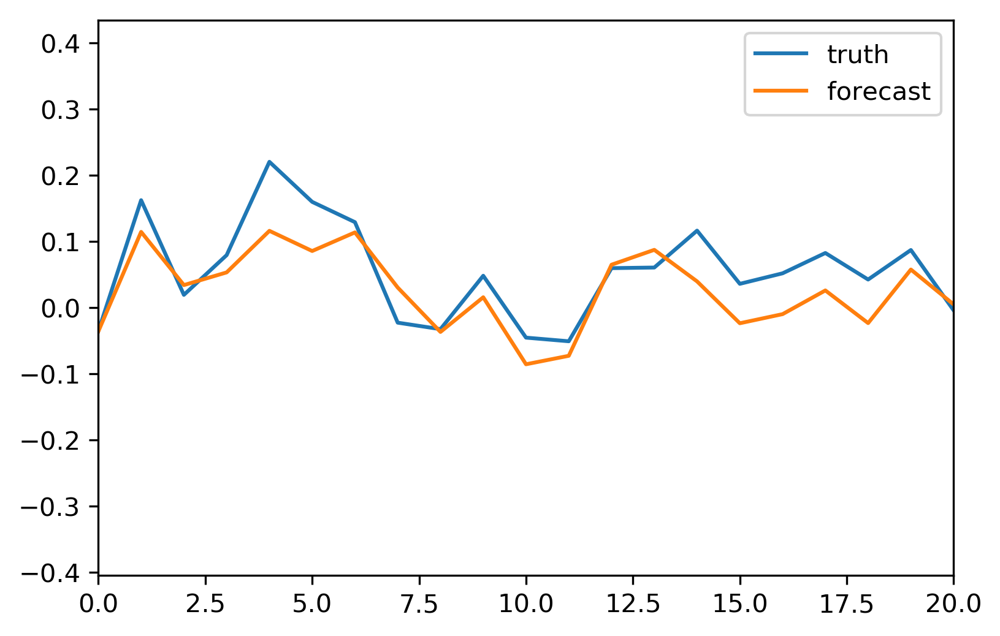

tecut = 1001, tscut = 801.0
Loading from sit
Loading from aIceData/LME/LIMs/sit_SImon_CESM_LME_nh_002_085001-200512.nc
time dimension: 1651 - 1850
detrending...
Working on month...0
Found with nans (not in satellite), going to fill with zeros...
Working on month...1
Found with nans (not in satellite), going to fill with zeros...
Working on month...2
Found with nans (not in satellite), going to fill with zeros...
Working on month...3
Found with nans (not in satellite), going to fill with zeros...
Working on month...4
Found with nans (not in satellite), going to fill with zeros...
Working on month...5
Found with nans (not in satellite), going to fill with zeros...
Working on month...6
Found with nans (not in satellite), going to fill with zeros...
Working on month...7
Found with nans (not in satellite), going to fill with zeros...
Working on month...8
Found with nans (not in satellite), going to fill with zeros...
Working on month...9
Found with nans (not in satellite), going to fill wit

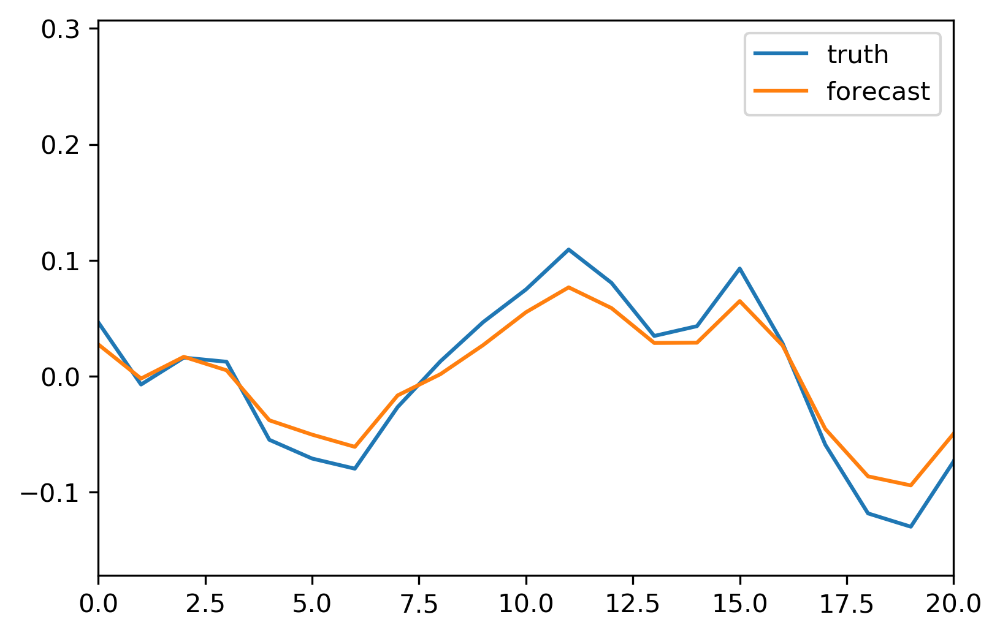

Month 1
Trained using month 1...
Validating against month 1
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


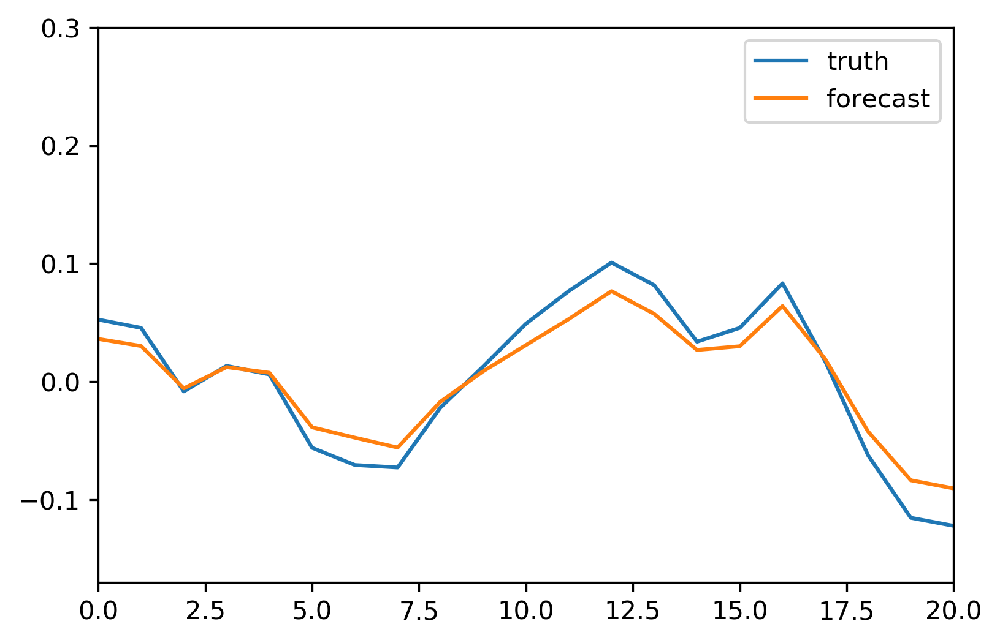

Month 2
Trained using month 2...
Validating against month 2
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


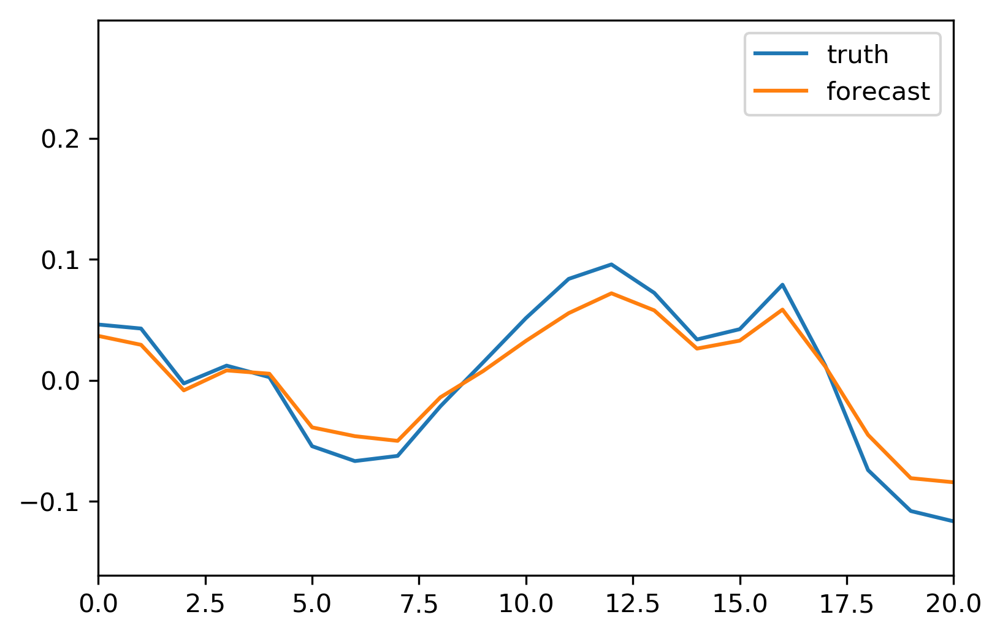

Month 3
Trained using month 3...
Validating against month 3
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


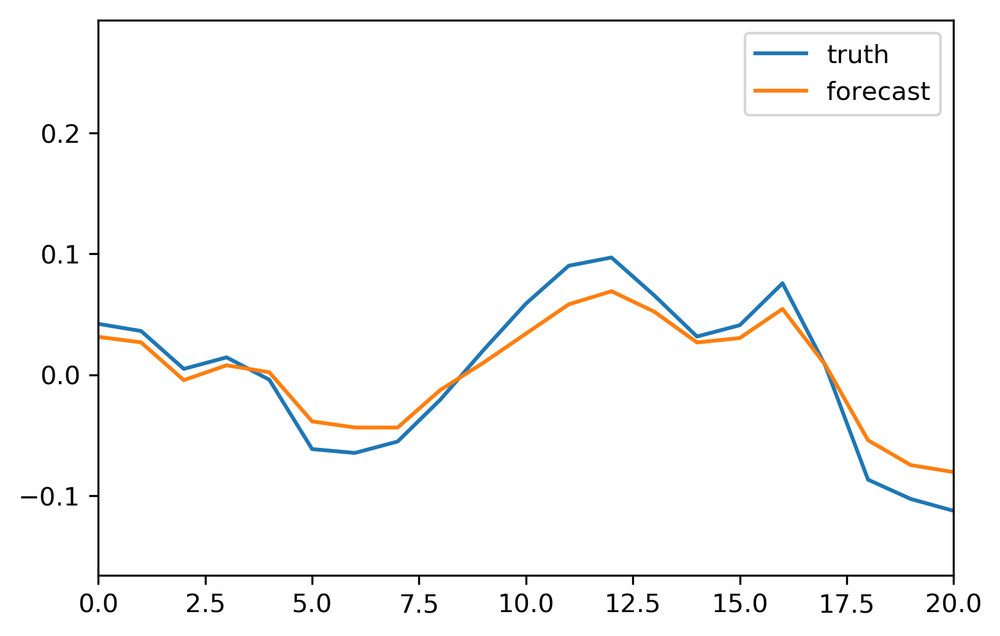

Month 4
Trained using month 4...
Validating against month 4
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


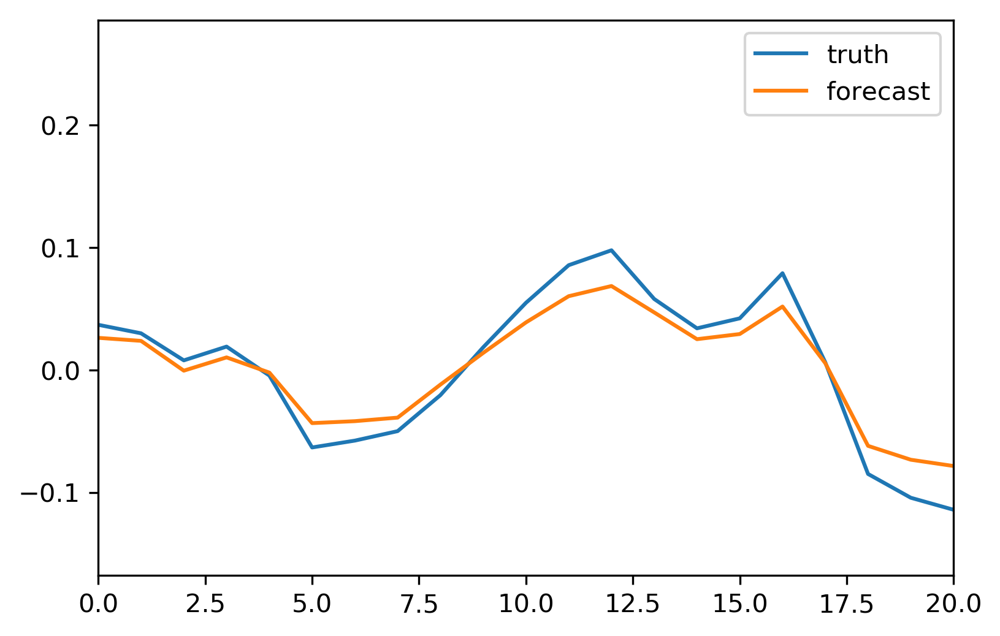

Month 5
Trained using month 5...
Validating against month 5
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


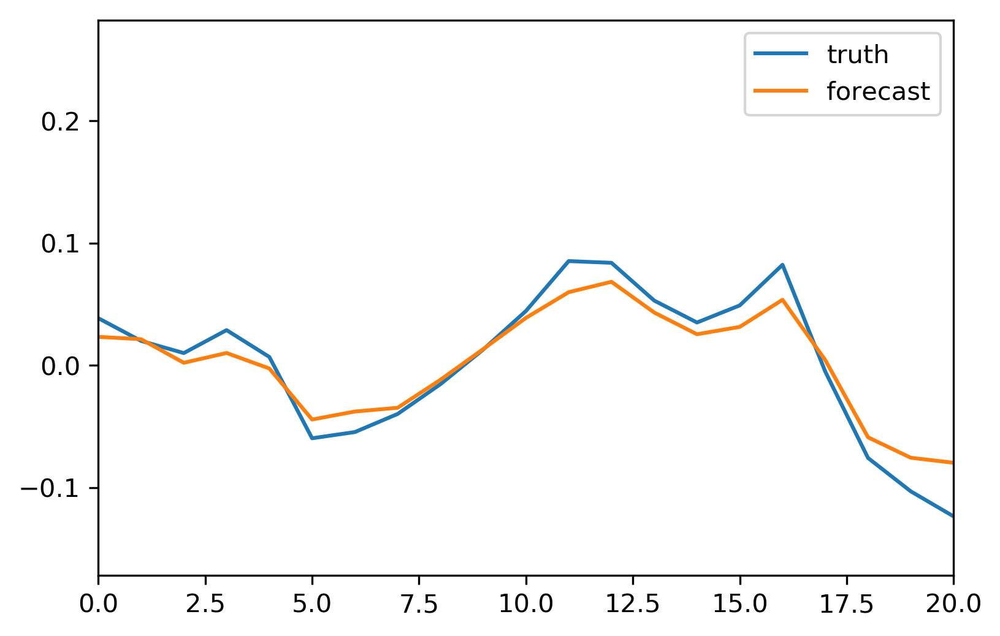

Month 6
Trained using month 6...
Validating against month 6
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


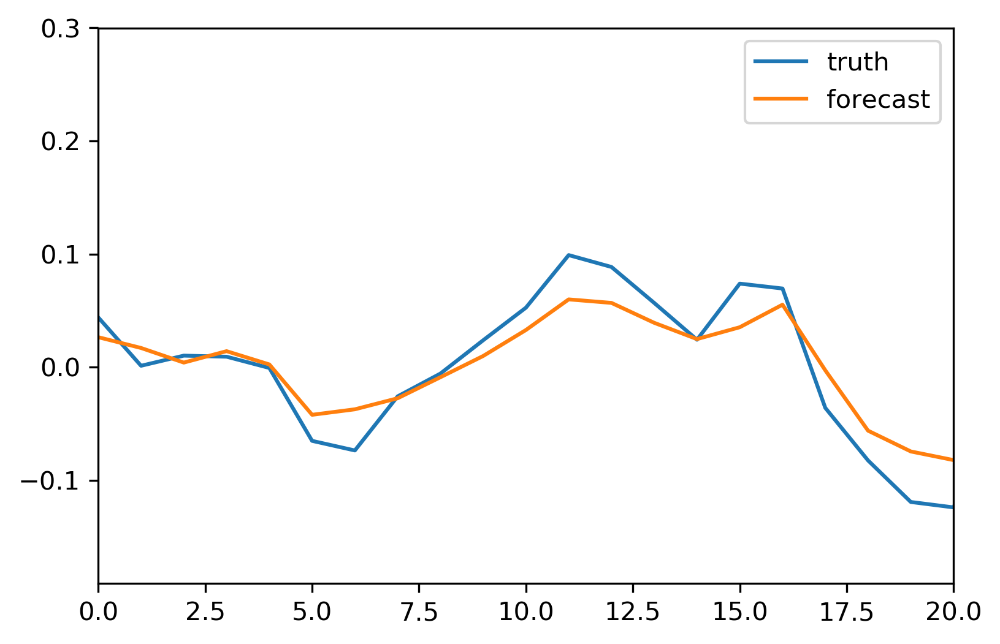

Month 7
Trained using month 7...
Validating against month 7
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


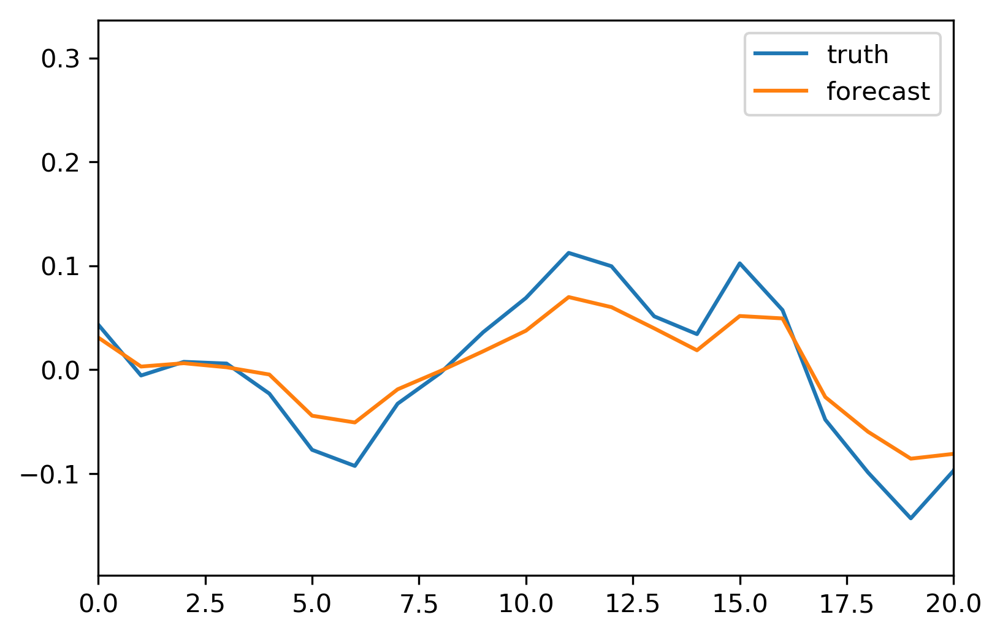

Month 8
Trained using month 8...
Validating against month 8
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


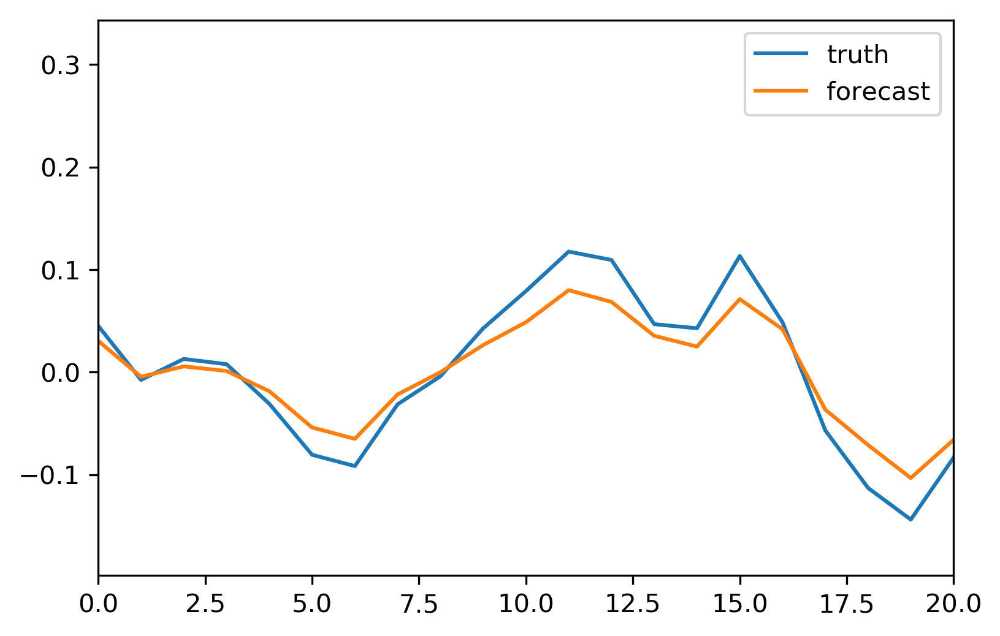

Month 9
Trained using month 9...
Validating against month 9
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


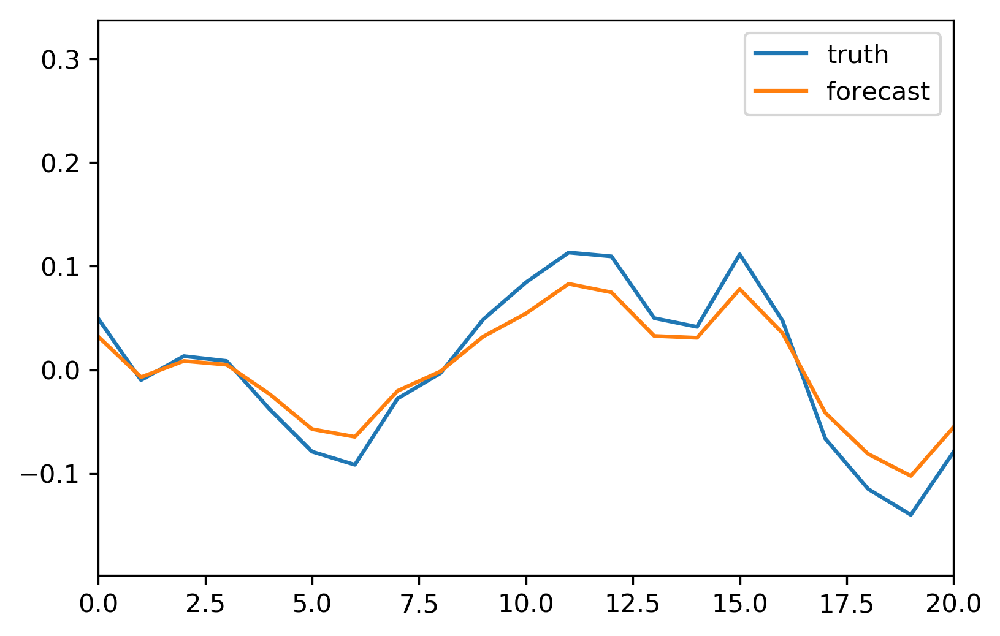

Month 10
Trained using month 10...
Validating against month 10
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


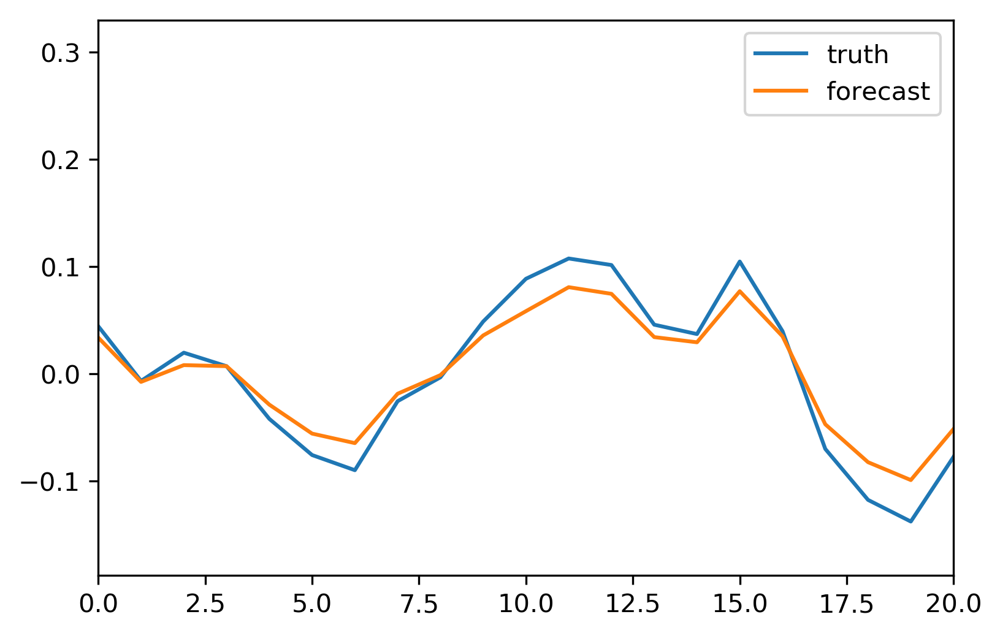

Month 11
Trained using month 11...
Validating against month 11
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


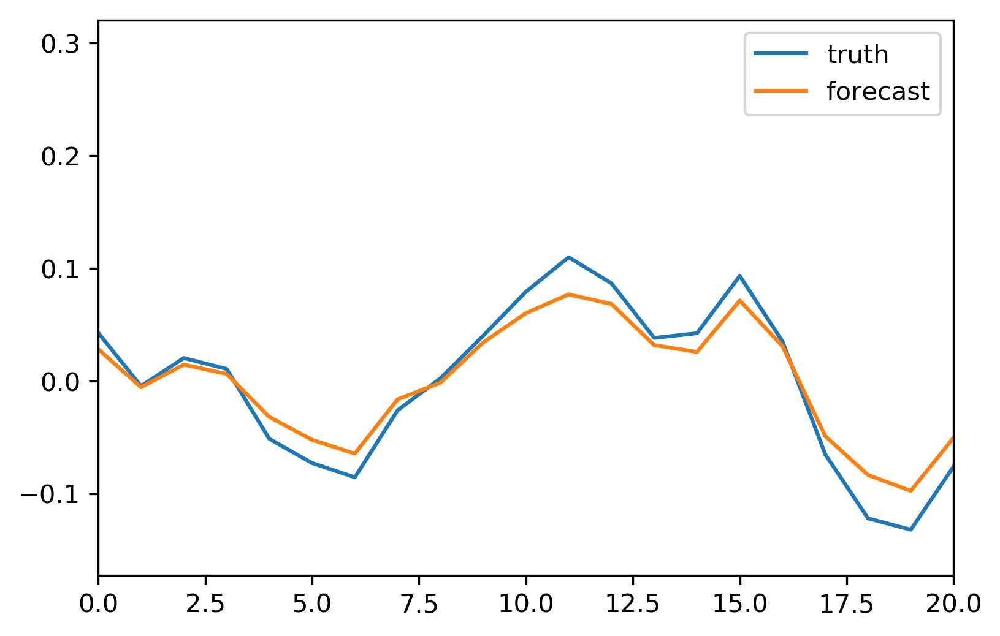

tecut = 1001, tscut = 801.0
Loading from sic
Loading from aIceData/LME/LIMs/sic_SImon_CESM_LME_nh_002_085001-200512.nc
time dimension: 1651 - 1850
detrending...
Working on month...0
Found with nans (not in satellite), going to fill with zeros...
Working on month...1
Found with nans (not in satellite), going to fill with zeros...
Working on month...2
Found with nans (not in satellite), going to fill with zeros...
Working on month...3
Found with nans (not in satellite), going to fill with zeros...
Working on month...4
Found with nans (not in satellite), going to fill with zeros...
Working on month...5
Found with nans (not in satellite), going to fill with zeros...
Working on month...6
Found with nans (not in satellite), going to fill with zeros...
Working on month...7
Found with nans (not in satellite), going to fill with zeros...
Working on month...8
Found with nans (not in satellite), going to fill with zeros...
Working on month...9
Found with nans (not in satellite), going to fill wit

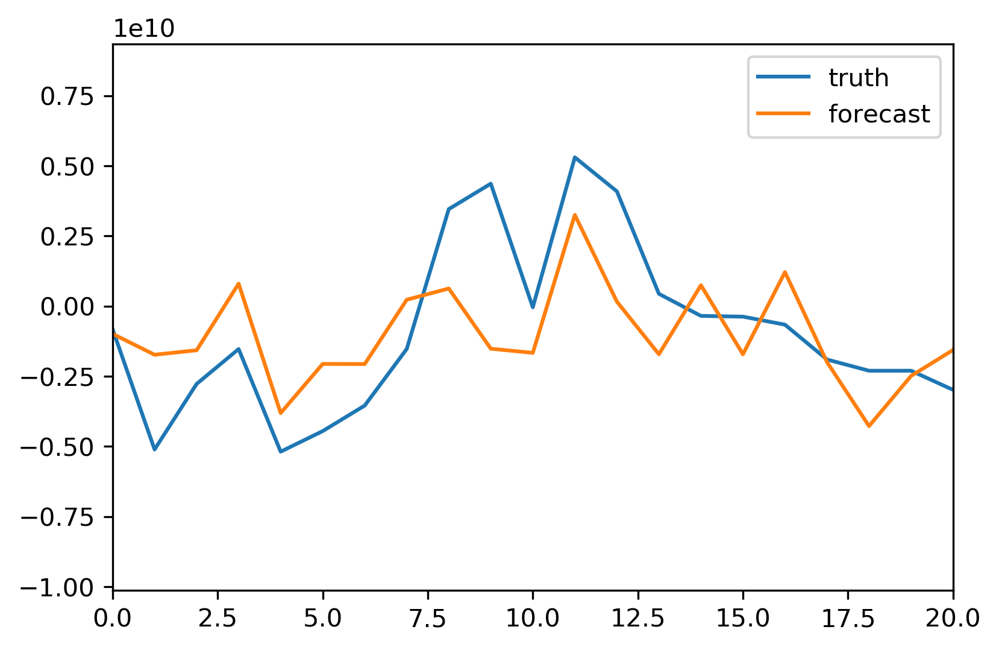

Month 1
Trained using month 1...
Validating against month 1
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


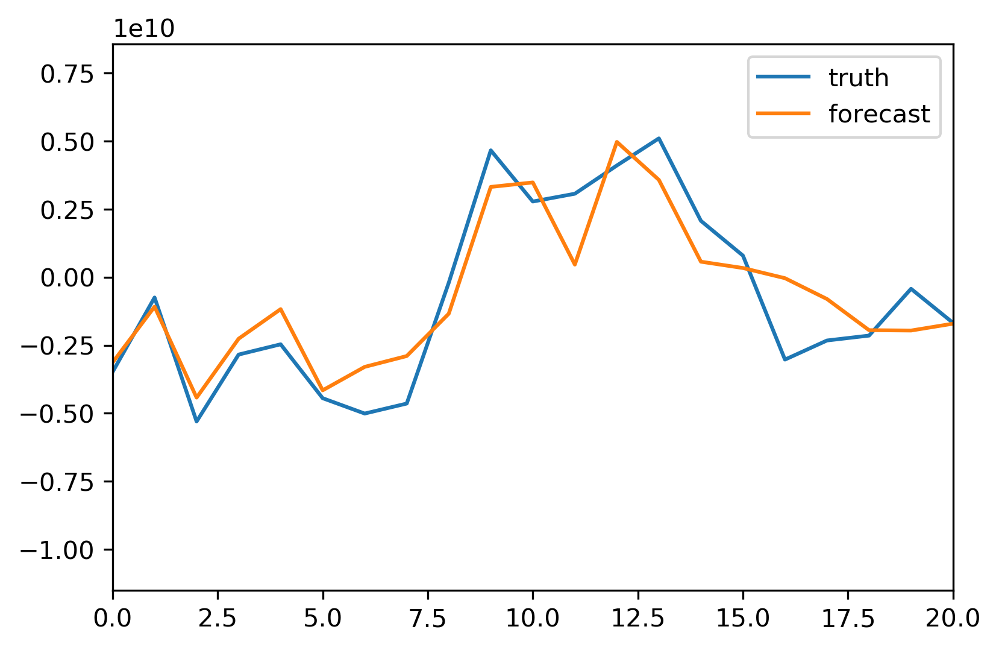

Month 2
Trained using month 2...
Validating against month 2
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


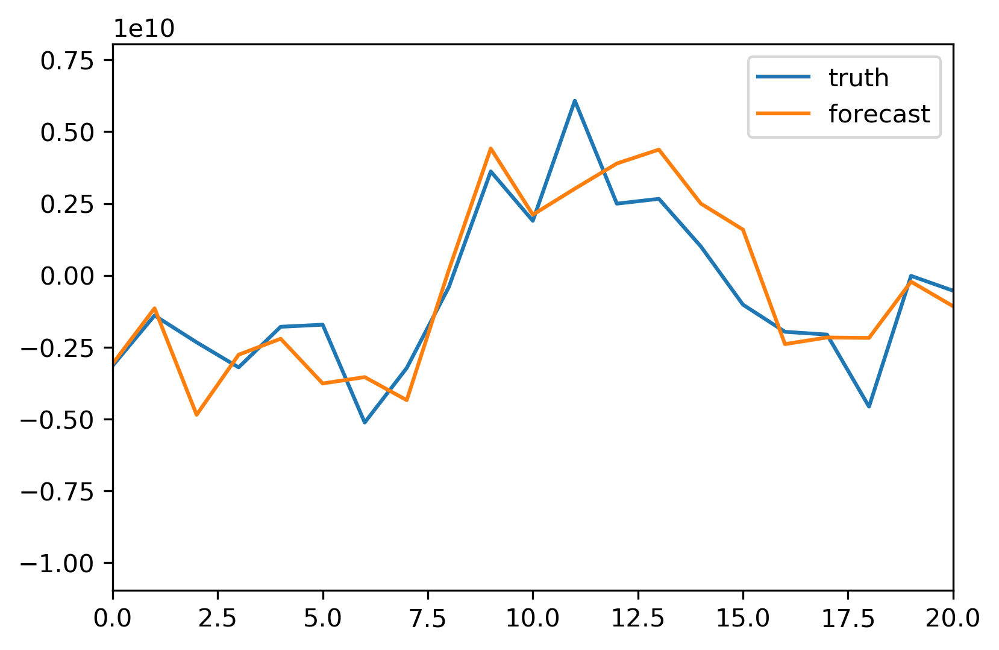

Month 3
Trained using month 3...
Validating against month 3
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


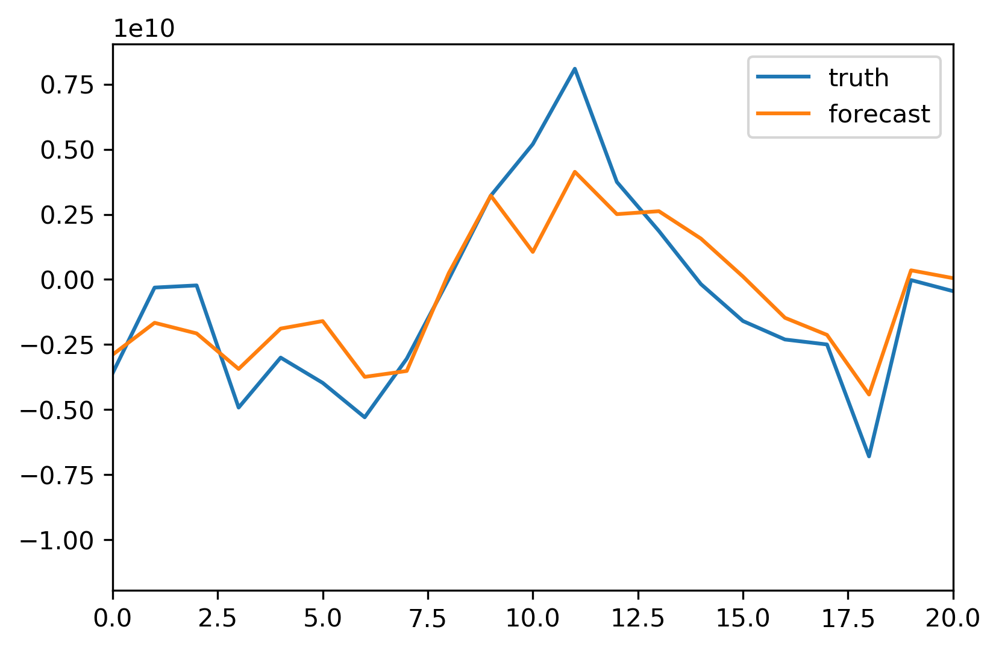

Month 4
Trained using month 4...
Validating against month 4
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


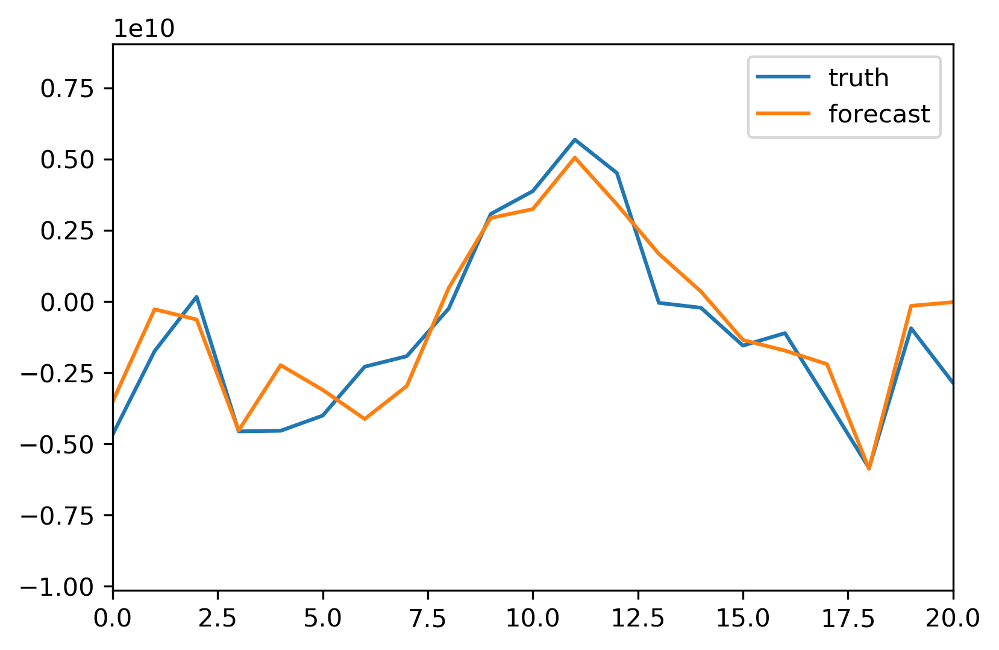

Month 5
Trained using month 5...
Validating against month 5
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


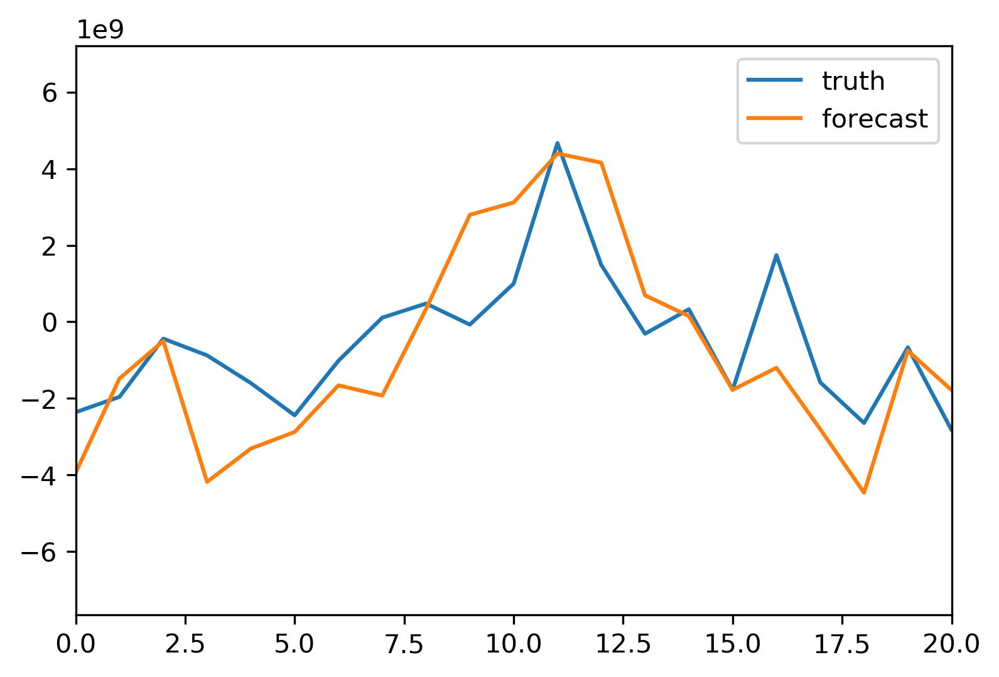

Month 6
Trained using month 6...
Validating against month 6
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


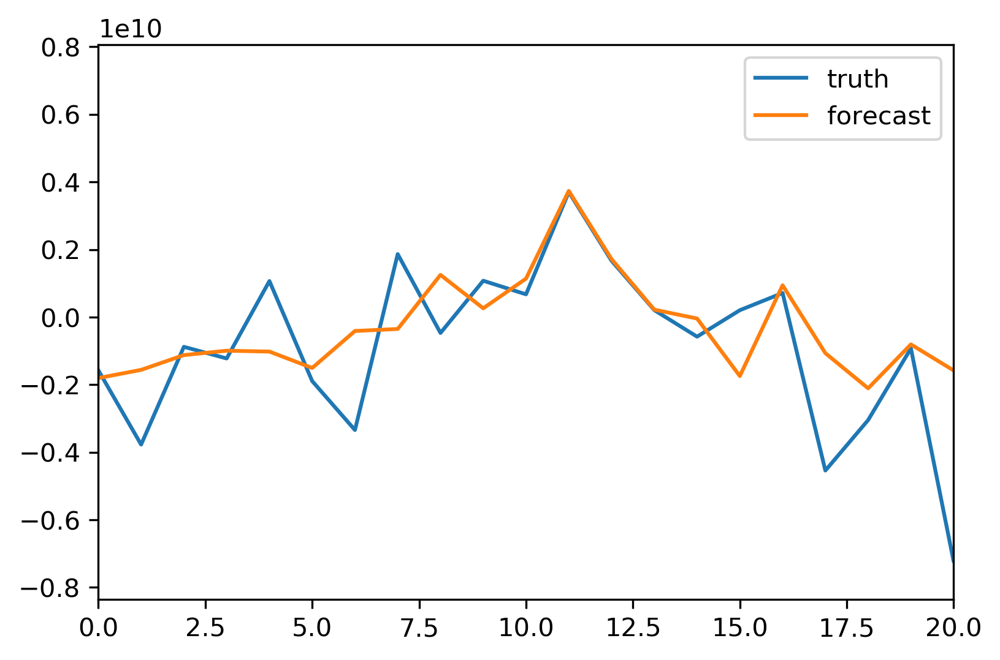

Month 7
Trained using month 7...
Validating against month 7
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


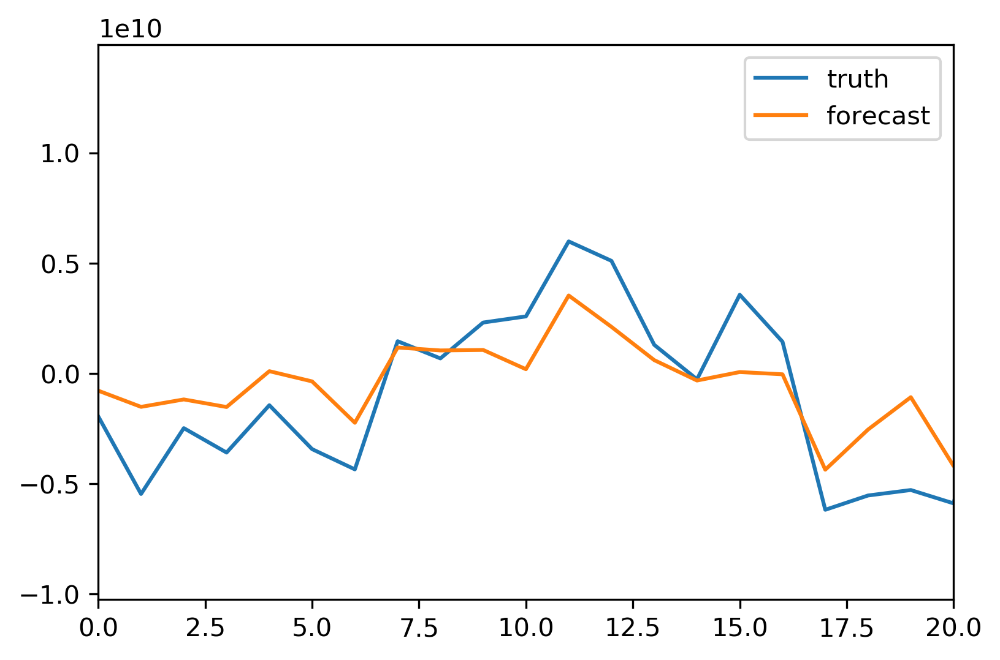

Month 8
Trained using month 8...
Validating against month 8
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


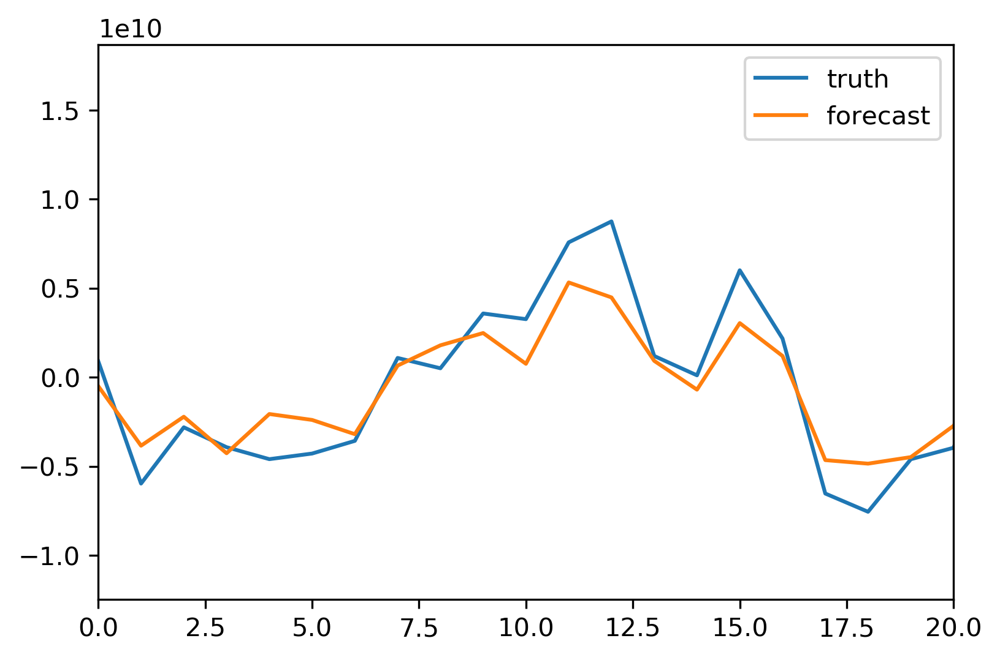

Month 9
Trained using month 9...
Validating against month 9
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


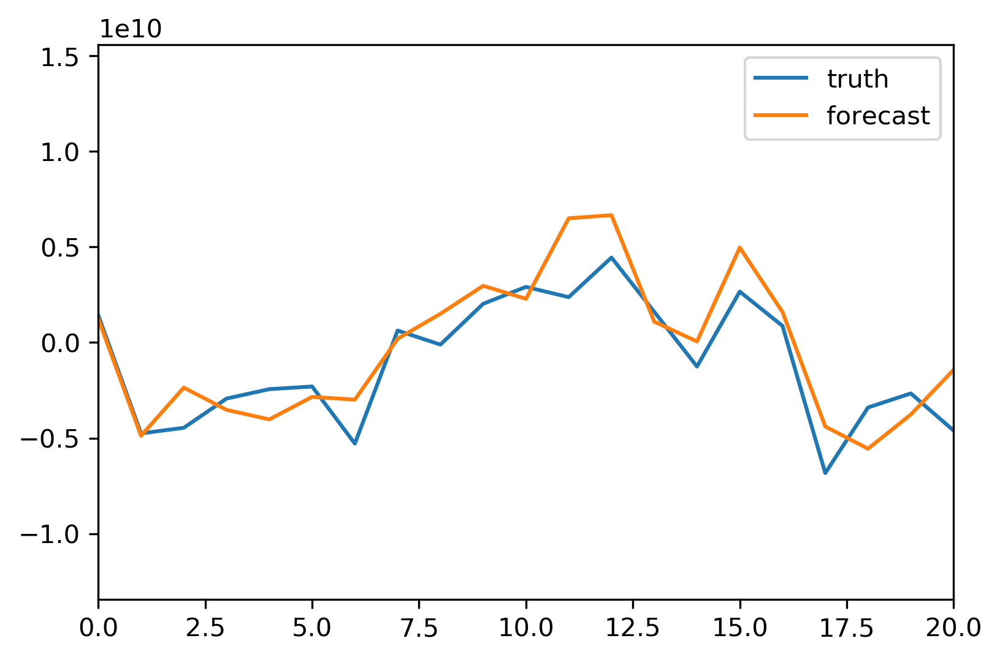

Month 10
Trained using month 10...
Validating against month 10
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


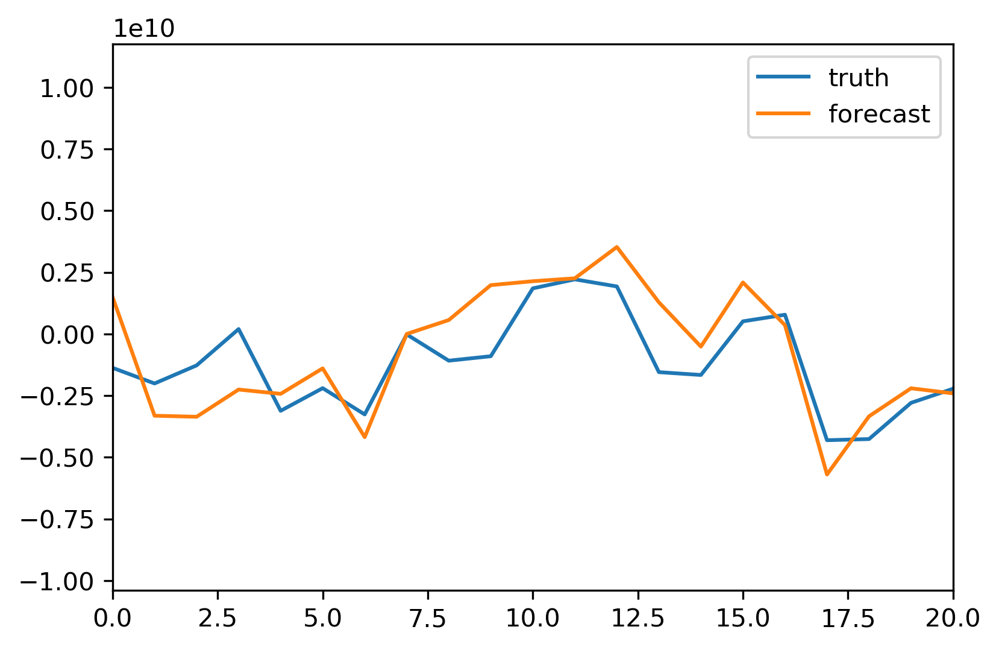

Month 11
Trained using month 11...
Validating against month 11
Truth_anom shape: (25600, 200)
Forecast_anom shape: (25600, 200)
changing cellarea units from centimeter^2 to km^2


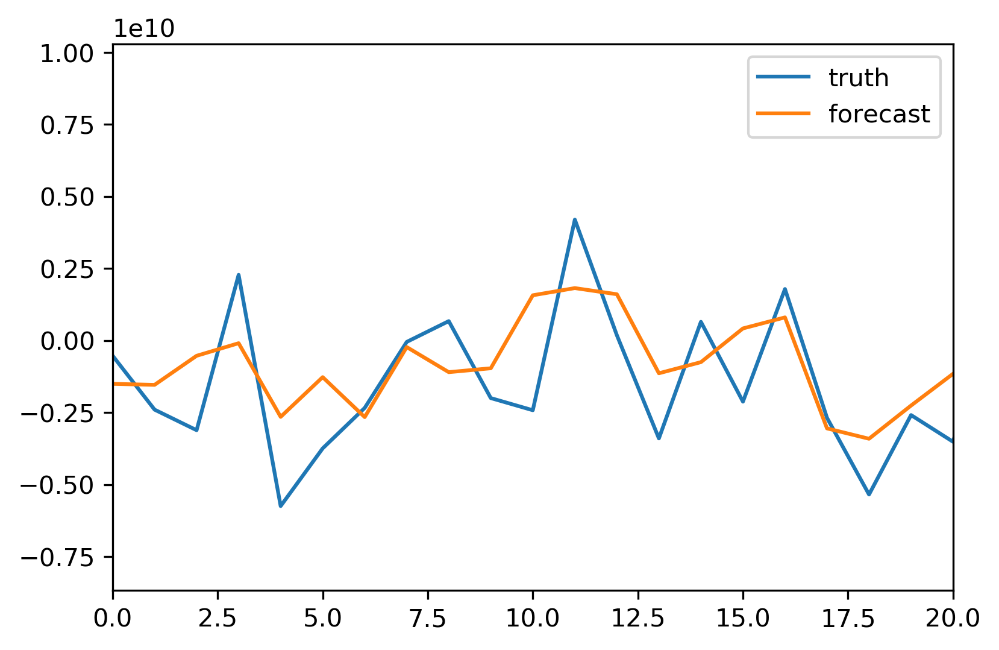

In [28]:
ar1cast = rf.ar1_forecast_valid_by_month(LIMd_os['P_train'], forecast_os['P_train_valid'], LIMd_os,
                                         exp_setup_os, exp_setup_os['limvars'], mo_names, 
                                         '', forecast_os,lag=None, iplot=True, save=False, 
                                         save_decomp=True)

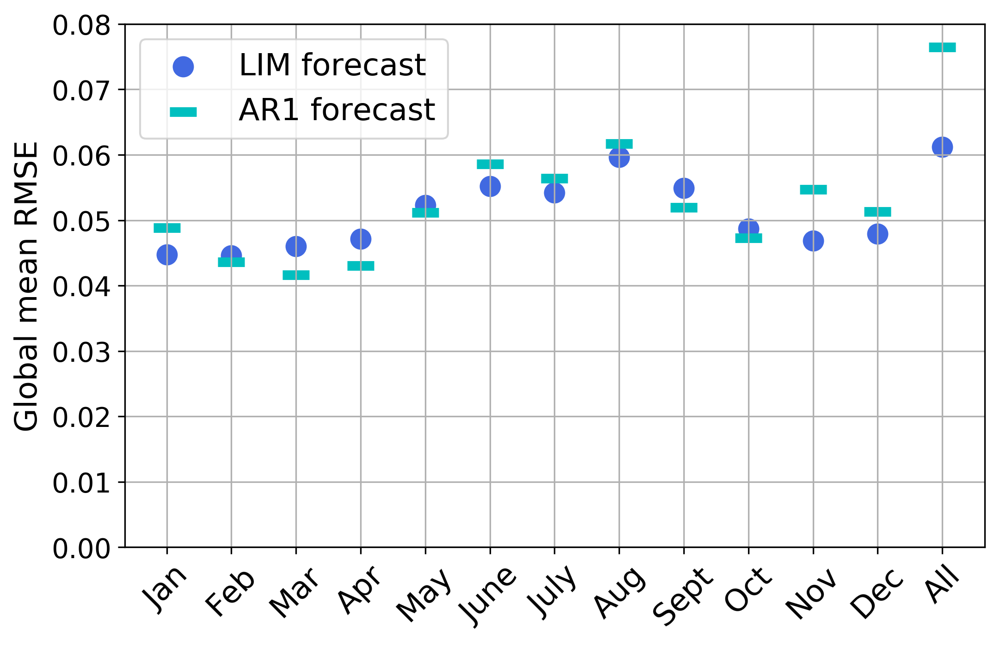

In [29]:
fig,ax = plt.subplots(1,1,figsize=(8,5))
plt.grid(axis='both')

plt.scatter(np.arange(0,12,1),forecast_validation['validation_stats']['sic']['gm_rmse'], 
            s=100, label='LIM forecast', color='royalblue')
plt.scatter(np.arange(0,12,1),ar1cast['validation_stats_ar1']['sic']['gm_rmse'],s=200, marker='_', linewidth=5,
           label='AR1 forecast',color='c')
plt.scatter(12,forecast_validation_lags_os['validation_stats_lags']['sic']['gm_rmse'][1],
           s=100, color='royalblue')
plt.scatter(12,ar1cast_lags_os['validation_stats_ar1_lags']['sic']['gm_rmse'][1],
           s=200, marker='_', linewidth=5,color='c')

plt.ylim(0,0.08)
plt.ylabel('Global mean RMSE',fontsize=16)
ax.set_xticks(ticks=np.arange(0,13,1))
ax.set_xticklabels(mo_names, fontsize=16, rotation=45)
plt.yticks(fontsize=14)
plt.legend(loc='upper left',fontsize=16)

### Check validation function for each month: 

In [192]:
ar1cast_dcomp_sic = ar1cast['ar1_forecast_dcomp'][LIMd_os['var_dict']['sic']['var_inds'],:]
ar1cast_dcomp_sic_3d = np.reshape(ar1cast_dcomp_sic,(25600,200,12))

In [206]:
ar1cast_dcomp_sic[:,0].sum()

0.0

In [208]:
se_indmo_ar1 = np.reshape((X_var_valid-ar1cast_dcomp_sic)**2,(25600,200,12))
rmse_indmo_ar1 = np.sqrt(np.nanmean(se_indmo_ar1,axis=1))
gm_rmse_indmo_ar1 = statskb.global_mean(rmse_indmo_ar1*forecast_nan_mask[:,np.newaxis],acell)

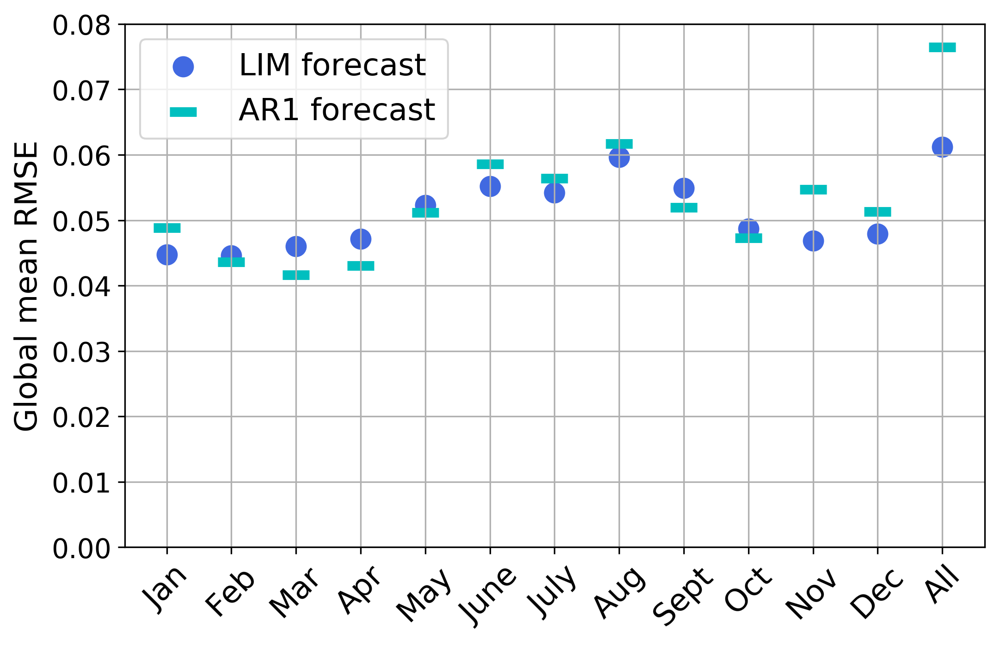

In [201]:
fig,ax = plt.subplots(1,1,figsize=(8,5))
plt.grid(axis='both')

plt.scatter(np.arange(0,12,1),forecast_validation['validation_stats']['sic']['gm_rmse'], 
            s=100, label='LIM forecast', color='royalblue')
plt.scatter(np.arange(0,12,1),gm_rmse_indmo_ar1,s=200, marker='_', linewidth=5,
           label='AR1 forecast',color='c')
plt.scatter(12,forecast_validation_lags_os['validation_stats_lags']['sic']['gm_rmse'][1],
           s=100, color='royalblue')
plt.scatter(12,ar1cast_lags_os['validation_stats_ar1_lags']['sic']['gm_rmse'][1],
           s=200, marker='_', linewidth=5,color='c')

plt.ylim(0,0.08)
plt.ylabel('Global mean RMSE',fontsize=16)
ax.set_xticks(ticks=np.arange(0,13,1))
ax.set_xticklabels(mo_names, fontsize=16, rotation=45)
plt.yticks(fontsize=14)
plt.legend(loc='upper left',fontsize=16)

## Calculate climotology performance: 

In [176]:
ntrunc = 50 # EOF truncation for individual fields (reduced-state space)
nmodes = 50 # number of coupled EOFs for LIM state space (truncated-state space)
#nmodes = 25
nmodes_sic = 50
#modes_sic = 10

mo='all'
#mo=7

# forecast lead time in months that defines the LIM training
tau = 1

lat_cutoff = 50

tscut = False     # time start cut 
#tecut = 16       # time end cut 
#tecut = 10
#tecut = 655       # 500 training years LME
tecut = 355       # 800 training years LME
#tecut = 1001      # 154 training years LME

# specify the model source 
train_dsource = 'cesm_lme'

valid_dsource = 'cesm_lme'

sic_separate = True
Insamp = False
dt=True
wt=True

In [177]:
fdic_train = limkb.build_training_dic(train_dsource)
fdic_valid = limkb.build_training_dic(valid_dsource)

full_names, areawt_name, month_names = limbuild.load_full_names()
areacell, areacell_dict = limbuild.load_areacell_dict(fdic_train, lat_cutoff=lat_cutoff,remove_climo=False, 
                                                      detrend=False, verbose=False )

Loading from cuments/SeaIceData/LME/LIMs/areacella_CESM_LME_global_001.nc
latitude cutoff detected: 50
Loading from b22/Documents/SeaIceData/LME/LIMs/areacello_global_LME_02.nc
latitude cutoff detected: 50


In [43]:
var_dict = {}
X_var, var_dict = limkb.load_data(var, var_dict, fdic_train, remove_climo=True, 
                                   detrend=dt, verbose=True, cmip6=False,
                                   tscut=tscut, tecut=tecut, lat_cutoff=lat_cutoff)
    
if var == 'sic':
    if np.nanmax(X_var)>1:
        print('Changing units of sic be a between 0 to 1')
        X_var = X_var/100

Loading from sic
Loading from aIceData/LME/LIMs/sic_SImon_CESM_LME_nh_002_085001-200512.nc
time dimension: 850 - 1650
detrending...
Working on month...0
Found with nans (not in satellite), going to fill with zeros...
Working on month...1
Found with nans (not in satellite), going to fill with zeros...
Working on month...2
Found with nans (not in satellite), going to fill with zeros...
Working on month...3
Found with nans (not in satellite), going to fill with zeros...
Working on month...4
Found with nans (not in satellite), going to fill with zeros...
Working on month...5
Found with nans (not in satellite), going to fill with zeros...
Working on month...6
Found with nans (not in satellite), going to fill with zeros...
Working on month...7
Found with nans (not in satellite), going to fill with zeros...
Working on month...8
Found with nans (not in satellite), going to fill with zeros...
Working on month...9
Found with nans (not in satellite), going to fill with zeros...
Working on month..

In [179]:
X_var_3d = np.reshape(X_var,(X_var.shape[0],int(X_var.shape[1]/12),12))
climo_var = np.nanmean(X_var_3d,axis=1)

In [213]:
climo_var.shape

(25600, 12)

In [180]:
var_dict_valid = {}
X_var_valid, var_dict_valid = limkb.load_data(var, var_dict_valid, fdic_valid, remove_climo=True, 
                                               detrend=dt, verbose=True, cmip6=False,
                                               tscut=801, tecut=1001, lat_cutoff=lat_cutoff)
    
if var == 'sic':
    if np.nanmax(X_var_valid)>1:
        print('Changing units of sic be a between 0 to 1')
        X_var_valid = X_var_valid/100

Loading from sic
Loading from aIceData/LME/LIMs/sic_SImon_CESM_LME_nh_002_085001-200512.nc
time dimension: 1651 - 1850
detrending...
Working on month...0
Found with nans (not in satellite), going to fill with zeros...
Working on month...1
Found with nans (not in satellite), going to fill with zeros...
Working on month...2
Found with nans (not in satellite), going to fill with zeros...
Working on month...3
Found with nans (not in satellite), going to fill with zeros...
Working on month...4
Found with nans (not in satellite), going to fill with zeros...
Working on month...5
Found with nans (not in satellite), going to fill with zeros...
Working on month...6
Found with nans (not in satellite), going to fill with zeros...
Working on month...7
Found with nans (not in satellite), going to fill with zeros...
Working on month...8
Found with nans (not in satellite), going to fill with zeros...
Working on month...9
Found with nans (not in satellite), going to fill with zeros...
Working on month.

In [181]:
X_var_valid_3d = np.reshape(X_var_valid,(X_var_valid.shape[0],int(X_var_valid.shape[1]/12),12))

In [182]:
gm_rmse = np.zeros((12))
gsum_rmse = np.zeros((12))
rmse = np.zeros((X_var.shape[0],12))

for i,m in enumerate(range(12)):
    print('Month '+str(m))

    units = areacell_dict[areawt_name[var]][areawt_name[var]]['units']
    
    #Check cell area units: change all to km^2
    if 'km' in units:
        acell = areacell[areawt_name[var]]
    else: 
        print('changing cellarea units from '+
              str(areacell_dict[areawt_name[var]][areawt_name[var]]['units'])+' to km^2')
        acell = areacell[areawt_name[var]]*(1e-6)
        units = 'km^2'
    forecast_nan_mask = np.where(np.isclose(np.nanvar(LIMd_is['E3'][var],axis=1),0,atol=1e-5),np.nan,1)
    
    rmse[:,i] = np.sqrt(np.nanmean((X_var_valid_3d [:,:,i]-climo_var[:,np.newaxis,i])**2,axis=1))
    gm_rmse[i] = statskb.global_mean(rmse[:,i]*forecast_nan_mask,acell)
    gsum_rmse[i] = np.nansum(rmse[:,i]*forecast_nan_mask)

valid_stats['gm_rmse'] = gm_rmse
valid_stats['gsum_rmse'] = gsum_rmse
valid_stats['rmse'] = rmse

validation_stats[var] = valid_stats

Month 0
changing cellarea units from centimeter^2 to km^2
Month 1
changing cellarea units from centimeter^2 to km^2
Month 2
changing cellarea units from centimeter^2 to km^2
Month 3
changing cellarea units from centimeter^2 to km^2
Month 4
changing cellarea units from centimeter^2 to km^2
Month 5
changing cellarea units from centimeter^2 to km^2
Month 6
changing cellarea units from centimeter^2 to km^2
Month 7
changing cellarea units from centimeter^2 to km^2
Month 8
changing cellarea units from centimeter^2 to km^2
Month 9
changing cellarea units from centimeter^2 to km^2
Month 10
changing cellarea units from centimeter^2 to km^2
Month 11
changing cellarea units from centimeter^2 to km^2


In [210]:
X_var_valid.shape, np.nanmean(climo_var,axis=1).shape

((25600, 2400), (25600,))

In [189]:
rmse_allmo = np.sqrt(np.nanmean((X_var_valid-np.nanmean(climo_var,axis=1)[:,np.newaxis])**2,axis=1))
gm_rmse_allmo = statskb.global_mean(rmse_annual*forecast_nan_mask,acell)

se_indmo = np.reshape((X_var_valid-np.nanmean(climo_var,axis=1)[:,np.newaxis])**2,(25600,200,12))
rmse_indmo = np.sqrt(np.nanmean(se_indmo,axis=1))
gm_rmse_indmo = statskb.global_mean(rmse_indmo*forecast_nan_mask[:,np.newaxis],acell)

In [216]:
rmse_indmo.shape

(25600, 12)

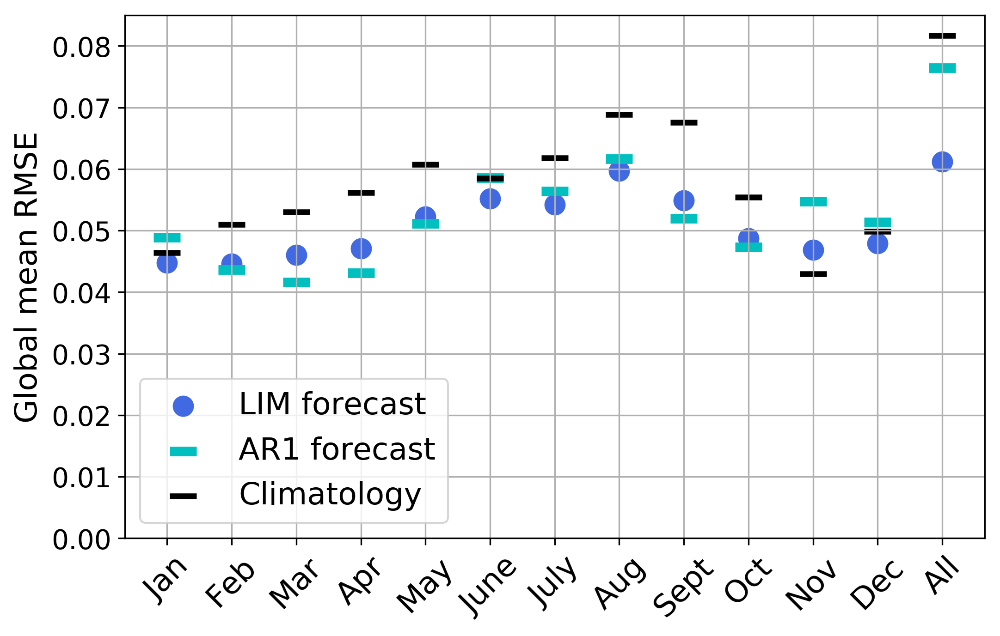

In [212]:
fig,ax = plt.subplots(1,1,figsize=(8,5))
plt.grid(axis='both')

plt.scatter(np.arange(0,12,1),forecast_validation['validation_stats']['sic']['gm_rmse'], 
            s=100, label='LIM forecast', color='royalblue')
plt.scatter(np.arange(0,12,1),ar1cast['validation_stats_ar1']['sic']['gm_rmse'],s=200, marker='_', linewidth=5,
           label='AR1 forecast',color='c')
plt.scatter(12,forecast_validation_lags_os['validation_stats_lags']['sic']['gm_rmse'][1],
           s=100, color='royalblue')
plt.scatter(12,ar1cast_lags_os['validation_stats_ar1_lags']['sic']['gm_rmse'][1],
           s=200, marker='_', linewidth=5,color='c')

plt.scatter(np.arange(0,12,1),gm_rmse_indmo, 
            s=200, marker='_', linewidth=3, label='Climatology', color='k')
plt.scatter(12,gm_rmse_allmo, 
            s=200, marker='_', linewidth=3, color='k')

plt.ylim(0,0.085)
plt.ylabel('Global mean RMSE',fontsize=16)
ax.set_xticks(ticks=np.arange(0,13,1))
ax.set_xticklabels(mo_names, fontsize=16, rotation=45)
plt.yticks(fontsize=14)
plt.legend(loc='lower left',fontsize=16)

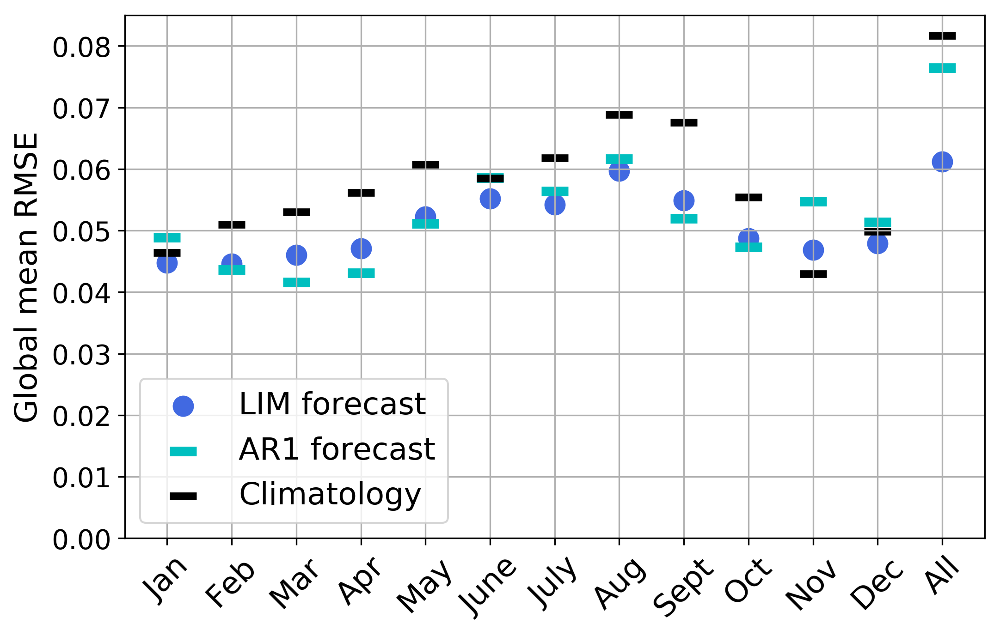

In [191]:
fig,ax = plt.subplots(1,1,figsize=(8,5))
plt.grid(axis='both')

plt.scatter(np.arange(0,12,1),forecast_validation['validation_stats']['sic']['gm_rmse'], 
            s=100, label='LIM forecast', color='royalblue')
plt.scatter(np.arange(0,12,1),ar1cast['validation_stats_ar1']['sic']['gm_rmse'],s=200, marker='_', linewidth=5,
           label='AR1 forecast',color='c')
plt.scatter(12,forecast_validation_lags_os['validation_stats_lags']['sic']['gm_rmse'][1],
           s=100, color='royalblue')
plt.scatter(12,ar1cast_lags_os['validation_stats_ar1_lags']['sic']['gm_rmse'][1],
           s=200, marker='_', linewidth=5,color='c')

plt.scatter(np.arange(0,12,1),gm_rmse, 
            s=200, marker='_', linewidth=4, label='Climatology', color='k')
plt.scatter(12,gm_rmse_allmo, 
            s=200, marker='_', linewidth=4, color='k')

plt.ylim(0,0.085)
plt.ylabel('Global mean RMSE',fontsize=16)
ax.set_xticks(ticks=np.arange(0,13,1))
ax.set_xticklabels(mo_names, fontsize=16, rotation=45)
plt.yticks(fontsize=14)
plt.legend(loc='lower left',fontsize=16)

(25600, 12)

In [84]:
X_var.shape, var_dict['sic']['lat'].shape, 104*320

((25600, 9612), (80, 320), 33280)

In [75]:
LIMd_os['var_dict']['sic']['climo'].shape

(33280, 12)

In [85]:
latmask = np.where(>lat_cutoff)
climo_3d = np.reshape(LIMd_os['var_dict']['sic']['climo'],(104,320,12))
climo

(80, 320)

In [81]:
LIMd_os['var_dict']['sic']['climo'].shape

(33280, 12)

In [31]:
ar1cast['validation_stats_ar1']['sic']['gm_rmse'], forecast_validation['validation_stats']['sic']['gm_rmse']

(array([4.62472774, 5.07943253, 5.27837453, 5.59546255, 6.05051759,
        5.8281983 , 6.15945366, 6.86600477, 6.73167908, 5.51578331,
        4.28246801, 4.97643405]),
 array([4.61898347, 5.07229852, 5.27243232, 5.59011436, 6.04710049,
        5.82500357, 6.15362548, 6.85982645, 6.72668761, 5.51392627,
        4.28226164, 4.96976825]))

In [ ]:
ar1_forecast, ar1_factor = statskb.red_noise_forecast_ar1(LIMd_os['P_train'].T, forecast_os['P_train_valid'].T,
                                                          lead=1)

In [ ]:
LIMd_os['P_train'].shape, forecast_os['P_train_valid'].shape, ar1_forecast.shape

In [ ]:
if len(exp_setup_os['limvars'])<=1:
    nmodes = 0
    ar1_forecast_dcomp = np.zeros((LIMd_os['E_sic'].shape[0],
                                   exp_setup_os['nyearsvalid']*12))
else: 
    nmodes = LIMd_os['E3_all'].shape[1]
    ar1_forecast_dcomp = np.zeros((LIMd_os['E3_all'].shape[0]+ LIMd_os['E_sic'].shape[0],
                                   exp_setup_os['nyearsvalid']*12))

nmodes = (len(exp_setup_os['limvars'])-1)*exp_setup_os['ntrunc']

In [ ]:
ar1_forecast_dcomp[:,1:] = limkb.decompress_eof_separate_sic(ar1_forecast.T, nmodes,
                                                             exp_setup_os['nmodes_sic'],LIMd_os['E3_all'],
                                                             LIMd_os['E_sic'],exp_setup_os['limvars'],
                                                             LIMd_os['var_dict'],LIMd_os['W_all'],
                                                             Weights=exp_setup_os['Weight'], 
                                                             sic_separate=exp_setup_os['sic_separate'])

In [ ]:
forecast_ar1_mo = np.reshape(ar1_forecast_dcomp, (ar1_forecast_dcomp.shape[0],
                                                      exp_setup_os['nyearsvalid'],12))

In [ ]:
forecast_ar1_mo.shape

In [ ]:
ar1_forecast_dcomp.shape

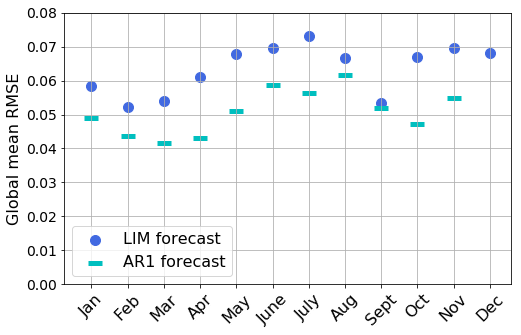

In [32]:
fig,ax = plt.subplots(1,1,figsize=(8,5))
plt.grid(axis='both')

plt.scatter(np.arange(0,12,1),forecast_validation_mo_os['validation_stats']['sic']['gm_rmse'], 
            s=100, label='LIM forecast', color='royalblue')
plt.scatter(np.arange(0,11,1),ar1cast_mo_os['sic']['gm_rmse'],s=200, marker='_', linewidth=5,
           label='AR1 forecast',color='c')

plt.ylim(0,0.08)
plt.ylabel('Global mean RMSE',fontsize=16)
ax.set_xticks(ticks=np.arange(0,12,1))
ax.set_xticklabels(mo_names, fontsize=16, rotation=45)
plt.yticks(fontsize=14)
plt.legend(loc='lower left',fontsize=16)

In [34]:
import glob
folder = 'last_millennium/'
var_names = (str(70)+"_").join(limvars)+str(70)
var='sic'

data_dir = '/home/disk/kalman2/mkb22/SI_LIMs/sensitivity_testing/neofs/'

filename_os_70 = ('LIMcast_'+model+'_002_ntrain_850_1650'+
               '_validyrs_1651_1850_'+var_names+'_*.pkl')
filename_is_70 = ('LIMcast_'+model+'_002_ntrain_850_1650'+
               '_validyrs_0851_1050_'+var_names+'_*.pkl')

file_load_os = glob.glob(data_dir+folder+filename_os_70)
file_load_is = glob.glob(data_dir+folder+filename_is_70)

print('Loading '+file_load_os[0])

experiment_os_70 =  pickle.load(open(file_load_os[0], 'rb'))
experiment_is_70 =  pickle.load(open(file_load_is[0], 'rb'))

LIMd_is_70 = experiment_is_70['LIMd']
exp_setup_is_70 = experiment_is_70['forecast']['exp_setup']
forecast_is_70 = experiment_is_70['forecast']
forecast_validation_lags_is_70 = experiment_is_70['forecast_validation_lags']
forecast_validation_mo_is_70 = experiment_is_70['forecast_validation']
ar1cast_lags_is_70 = experiment_is_70['ar1cast_lags']
ar1cast_mo_is_70 = experiment_is_70['ar1cast']['validation_stats_ar1']

LIMd_os_70 = experiment_os_70['LIMd']
exp_setup_os_70 = experiment_os_70['forecast']['exp_setup']
forecast_os_70 = experiment_os_70['forecast']
forecast_validation_lags_os_70 = experiment_os_70['forecast_validation_lags']
forecast_validation_mo_os_70 = experiment_os_70['forecast_validation']
ar1cast_lags_os_70 = experiment_os_70['ar1cast_lags']
ar1cast_mo_os_70 = experiment_os_70['ar1cast']['validation_stats_ar1']

Loading /home/disk/kalman2/mkb22/SI_LIMs/sensitivity_testing/neofs/last_millennium/LIMcast_cesm_lme_002_ntrain_850_1650_validyrs_1651_1850_tas70_psl70_zg70_tos70_sit70_sic70_20211113.pkl


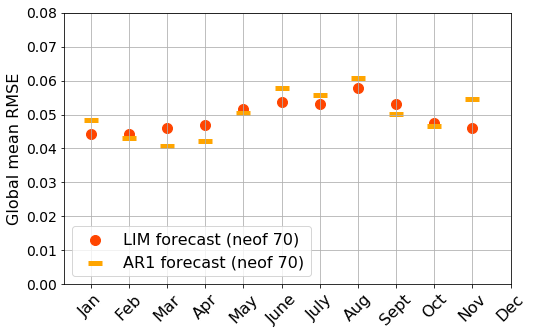

In [35]:
fig,ax = plt.subplots(1,1,figsize=(8,5))
plt.grid(axis='both')

plt.scatter(np.arange(0,11,1),forecast_validation_mo_os_70['validation_stats']['sic']['gm_rmse'], 
            s=100, label='LIM forecast (neof 70)', color='orangered')
plt.scatter(np.arange(0,11,1),ar1cast_mo_os_70['sic']['gm_rmse'],s=200, marker='_', linewidth=5,
           label='AR1 forecast (neof 70)',color='orange')

plt.ylim(0,0.08)
plt.ylabel('Global mean RMSE',fontsize=16)
ax.set_xticks(ticks=np.arange(0,12,1))
ax.set_xticklabels(mo_names, fontsize=16, rotation=45)
plt.yticks(fontsize=14)
plt.legend(loc='lower left',fontsize=16)

In [36]:
import glob
folder = 'last_millennium/'
var_names = (str(30)+"_").join(limvars)+str(30)
var='sic'

data_dir = '/home/disk/kalman2/mkb22/SI_LIMs/sensitivity_testing/neofs/'

filename_os_30 = ('LIMcast_'+model+'_002_ntrain_850_1650'+
               '_validyrs_1651_1850_'+var_names+'_*.pkl')
filename_is_30 = ('LIMcast_'+model+'_002_ntrain_850_1650'+
               '_validyrs_0851_1050_'+var_names+'_*.pkl')

file_load_os = glob.glob(data_dir+folder+filename_os_30)
file_load_is = glob.glob(data_dir+folder+filename_is_30)

print('Loading '+file_load_os[0])

experiment_os_30 =  pickle.load(open(file_load_os[0], 'rb'))
experiment_is_30 =  pickle.load(open(file_load_is[0], 'rb'))

LIMd_is_30 = experiment_is_30['LIMd']
exp_setup_is_30 = experiment_is_30['forecast']['exp_setup']
forecast_is_30 = experiment_is_30['forecast']
forecast_validation_lags_is_30 = experiment_is_30['forecast_validation_lags']
forecast_validation_mo_is_30 = experiment_is_30['forecast_validation']
ar1cast_lags_is_30 = experiment_is_30['ar1cast_lags']
ar1cast_mo_is_30 = experiment_is_30['ar1cast']['validation_stats_ar1']

LIMd_os_30 = experiment_os_30['LIMd']
exp_setup_os_30 = experiment_os_30['forecast']['exp_setup']
forecast_os_30 = experiment_os_30['forecast']
forecast_validation_lags_os_30 = experiment_os_30['forecast_validation_lags']
forecast_validation_mo_os_30 = experiment_os_30['forecast_validation']
ar1cast_lags_os_30 = experiment_os_30['ar1cast_lags']
ar1cast_mo_os_30 = experiment_os_30['ar1cast']['validation_stats_ar1']

Loading /home/disk/kalman2/mkb22/SI_LIMs/sensitivity_testing/neofs/last_millennium/LIMcast_cesm_lme_002_ntrain_850_1650_validyrs_1651_1850_tas30_psl30_zg30_tos30_sit30_sic30_20211113.pkl


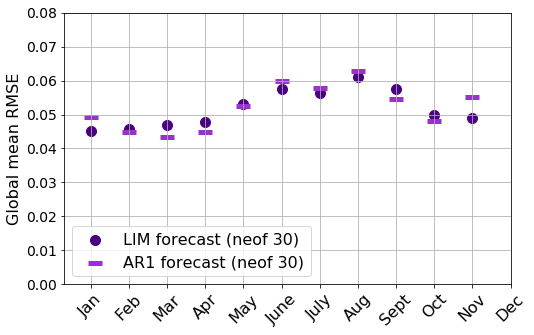

In [37]:
fig,ax = plt.subplots(1,1,figsize=(8,5))
plt.grid(axis='both')

plt.scatter(np.arange(0,11,1),forecast_validation_mo_os_30['validation_stats']['sic']['gm_rmse'], 
            s=100, label='LIM forecast (neof 30)', color='indigo')
plt.scatter(np.arange(0,11,1),ar1cast_mo_os_30['sic']['gm_rmse'],s=200, marker='_', linewidth=5,
           label='AR1 forecast (neof 30)',color='darkorchid')

plt.ylim(0,0.08)
plt.ylabel('Global mean RMSE',fontsize=16)
ax.set_xticks(ticks=np.arange(0,12,1))
ax.set_xticklabels(mo_names, fontsize=16, rotation=45)
plt.yticks(fontsize=14)
plt.legend(loc='lower left',fontsize=16)

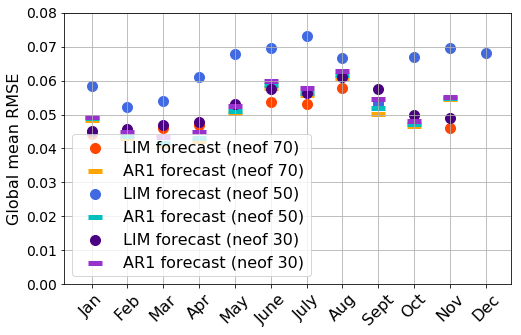

In [38]:
fig,ax = plt.subplots(1,1,figsize=(8,5))
plt.grid(axis='both')

plt.scatter(np.arange(0,11,1),forecast_validation_mo_os_70['validation_stats']['sic']['gm_rmse'], 
            s=100, label='LIM forecast (neof 70)', color='orangered')
plt.scatter(np.arange(0,11,1),ar1cast_mo_os_70['sic']['gm_rmse'],s=200, marker='_', linewidth=5,
           label='AR1 forecast (neof 70)',color='orange')

plt.scatter(np.arange(0,12,1),forecast_validation_mo_os['validation_stats']['sic']['gm_rmse'], 
            s=100, label='LIM forecast (neof 50)', color='royalblue')
plt.scatter(np.arange(0,11,1),ar1cast_mo_os['sic']['gm_rmse'],s=200, marker='_', linewidth=5,
           label='AR1 forecast (neof 50)',color='c')

plt.scatter(np.arange(0,11,1),forecast_validation_mo_os_30['validation_stats']['sic']['gm_rmse'], 
            s=100, label='LIM forecast (neof 30)', color='indigo')
plt.scatter(np.arange(0,11,1),ar1cast_mo_os_30['sic']['gm_rmse'],s=200, marker='_', linewidth=5,
           label='AR1 forecast (neof 30)',color='darkorchid')

plt.ylim(0,0.08)
plt.ylabel('Global mean RMSE',fontsize=16)
ax.set_xticks(ticks=np.arange(0,12,1))
ax.set_xticklabels(mo_names, fontsize=16, rotation=45)
plt.yticks(fontsize=14)
plt.legend(loc='lower left',fontsize=16)

In [10]:
%run run_forecast_LME_crossmodel_validation_122021.py

Loading truncated tas from: /home/disk/kalman2/mkb22/SI_LIMs/truncated_data/last_millennium/tas_ntrunc50_002_monthall_cesm_lme_latcutoff_40_wtTrue_dtTrue_ntrain_850_1650_20211014.pkl
Month is all
Loading truncated psl from: /home/disk/kalman2/mkb22/SI_LIMs/truncated_data/last_millennium/psl_ntrunc50_002_monthall_cesm_lme_latcutoff_40_wtTrue_dtTrue_ntrain_850_1650_20211014.pkl
Month is all
Loading truncated zg from: /home/disk/kalman2/mkb22/SI_LIMs/truncated_data/last_millennium/zg_ntrunc50_002_monthall_cesm_lme_latcutoff_40_wtTrue_dtTrue_ntrain_850_1650_20211014.pkl
Month is all
Loading truncated tos from: /home/disk/kalman2/mkb22/SI_LIMs/truncated_data/last_millennium/tos_ntrunc50_002_monthall_cesm_lme_latcutoff_40_wtTrue_dtTrue_ntrain_850_1650_20211014.pkl
Month is all
Loading truncated sit from: /home/disk/kalman2/mkb22/SI_LIMs/truncated_data/last_millennium/sit_ntrunc50_002_monthall_cesm_lme_latcutoff_40_wtTrue_dtTrue_ntrain_850_1650_20211014.pkl
Month is all
Loading truncated sic 

ValueError: operands could not be broadcast together with shapes (3888,1) (15552,1128) 

In [4]:
exp_setup['valid_dsource']

'cesm_le'